In [2]:
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format='retina'

In [3]:
import warnings
from copy import deepcopy
from functools import lru_cache

import astropy.units as u
import numpy as np
import pandas as pd
from astropy.coordinates import Distance, SkyCoord, match_coordinates_sky
from astropy.time import Time
from astropy.wcs import WCS
from astroquery.gaia import Gaia
from scipy import sparse
from tqdm import tqdm
from astropy.io import fits

In [4]:
import utils

/opt/anaconda3/envs/pandora/lib/python3.9/site-packages/lightkurve/config/__init__.py:119: UserWarning: The default Lightkurve cache directory, used by download(), etc., has been moved to /Users/raeholcomb/.lightkurve/cache. Please move all the files in the legacy directory /Users/raeholcomb/.lightkurve-cache to the new location and remove the legacy directory. Refer to https://docs.lightkurve.org/reference/config.html#default-cache-directory-migration for more information.
  warnings.warn(


In [5]:
# We'll use this for apertures
def gaussian_2d(x, y, mu_x, mu_y, sigma_x=2, sigma_y=2):
    """
    Compute the value of a 2D Gaussian function.

    Parameters:
    x (float): x-coordinate.
    y (float): y-coordinate.
    mu_x (float): Mean of the Gaussian in the x-direction.
    mu_y (float): Mean of the Gaussian in the y-direction.
    sigma_x (float): Standard deviation of the Gaussian in the x-direction.
    sigma_y (float): Standard deviation of the Gaussian in the y-direction.

    Returns:
    float: Value of the 2D Gaussian function at (x, y).
    """
    part1 = 1 / (2 * np.pi * sigma_x * sigma_y)
    part2 = np.exp(
        -((x - mu_x) ** 2 / (2 * sigma_x**2) + (y - mu_y) ** 2 / (2 * sigma_y**2))
    )
    return part1 * part2

def dgaussian_2d(x, y, mu_x, mu_y, sigma_x=2, sigma_y=2):
    """
    Compute the value of a 2D Gaussian function. (This returns the amplitude you need to multiply by a Gaussian to get the actual gradient.)

    Parameters:
    x (float): x-coordinate.
    y (float): y-coordinate.
    mu_x (float): Mean of the Gaussian in the x-direction.
    mu_y (float): Mean of the Gaussian in the y-direction.
    sigma_x (float): Standard deviation of the Gaussian in the x-direction.
    sigma_y (float): Standard deviation of the Gaussian in the y-direction.

    """
    
    dG_x = -(x - mu_x)/sigma_x**2
    dG_y = -(y - mu_y)/sigma_y**2
    return dG_x, dG_y

class SparseWarp3D(sparse.coo_matrix):
    """Special class for working with stacks of sparse 3D images"""

    def __init__(self, data, row, col, imshape):
        if not np.all([row.ndim == 3, col.ndim == 3, data.ndim == 3]):
            raise ValueError("Pass a 3D array (nrow, ncol, nvecs)")
        self.nvecs = data.shape[-1]
        if not np.all(
            [
                row.shape[-1] == self.nvecs,
                col.shape[-1] == self.nvecs,
            ]
        ):
            raise ValueError("Must have the same 3rd dimension (nvecs).")
        self.subrow = row.astype(int)
        self.subcol = col.astype(int)
        self.subdepth = (
            np.arange(row.shape[-1], dtype=int)[None, None, :]
            * np.ones(row.shape, dtype=int)[:, :, None]
        )
        self.subdata = data
        self._kz = self.subdata != 0

        self.imshape = imshape
        self.subshape = row.shape
        self.cooshape = (np.prod([*self.imshape[:2]]), self.nvecs)
        self.coord = (0, 0)
        super().__init__(self.cooshape)
        index0 = (np.vstack(self.subrow)) * self.imshape[1] + (np.vstack(self.subcol))
        index1 = np.vstack(self.subdepth).ravel()
        self._index_no_offset = np.vstack([index0.ravel(), index1.ravel()])
        self._submask_no_offset = np.vstack(self._get_submask(offset=(0, 0))).ravel()
        self._subrow_v = deepcopy(np.vstack(self.subrow).ravel())
        self._subcol_v = deepcopy(np.vstack(self.subcol).ravel())
        self._subdata_v = deepcopy(np.vstack(deepcopy(self.subdata)).ravel())
        self._index1 = np.vstack(self.subdepth).ravel()

        self._set_data()

    def __add__(self, other):
        if isinstance(other, SparseWarp3D):
            data = deepcopy(self.subdata + other.subdata)
            if (
                (self.subcol != other.subcol)
                | (self.subrow != other.subrow)
                | (self.imshape != other.imshape)
                | (self.subshape != other.subshape)
            ):
                raise ValueError("Must have same base indicies.")
            return SparseWarp3D(
                data=data, row=self.subrow, col=self.subcol, imshape=self.imshape
            )
        else:
            return super(sparse.coo_matrix, self).__add__(other)

    def tocoo(self):
        return sparse.coo_matrix((self.data, (self.row, self.col)), shape=self.cooshape)

    def index(self, offset=(0, 0)):
        """Get the 2D positions of the data"""
        if offset == (0, 0):
            return self._index_no_offset
        index0 = (self._subrow_v + offset[0]) * self.imshape[1] + (
            self._subcol_v + offset[1]
        )
        return index0, self._index1

    def _get_submask(self, offset=(0, 0)):
        # find where the data is within the array bounds
        kr = ((self.subrow + offset[0]) < self.imshape[0]) & (
            (self.subrow + offset[0]) >= 0
        )
        kc = ((self.subcol + offset[1]) < self.imshape[1]) & (
            (self.subcol + offset[1]) >= 0
        )
        return kr & kc & self._kz

    def _set_data(self, offset=(0, 0)):
        if offset == (0, 0):
            index0, index1 = self.index((0, 0))
            self.row, self.col = (
                index0[self._submask_no_offset],
                index1[self._submask_no_offset],
            )
            self.data = self._subdata_v[self._submask_no_offset]
        else:
            # find where the data is within the array bounds
            k = self._get_submask(offset=offset)
            k = np.vstack(k).ravel()
            new_row, new_col = self.index(offset=offset)
            self.row, self.col = new_row[k], new_col[k]
            self.data = self._subdata_v[k]
        self.coord = offset

    def __repr__(self):
        return (
            f"<{(*self.imshape, self.nvecs)} SparseWarp3D array of type {self.dtype}>"
        )

    def dot(self, other):
        if other.ndim == 1:
            other = other[:, None]
        nt = other.shape[1]
        return super().dot(other).reshape((*self.imshape, nt)).transpose([2, 0, 1])

    def reset(self):
        """Reset any translation back to the original data"""
        self._set_data(offset=(0, 0))
        self.coord = (0, 0)
        return

    def clear(self):
        """Clear data in the array"""
        self.data = np.asarray([])
        self.row = np.asarray([])
        self.col = np.asarray([])
        self.coord = (0, 0)
        return

    def translate(self, position):
        """Translate the data in the array by `position` in (row, column)"""
        self.reset()
        # If translating to (0, 0), do nothing
        if position == (0, 0):
            return
        self.clear()
        self._set_data(position)
        return

In [6]:
@lru_cache()
def _query_gaia(query_str):
    job = Gaia.launch_job_async(query_str, verbose=False)
    tbl = job.get_results()
    return deepcopy(tbl)

In [7]:
def get_sky_catalog(
    ra=210.8023,
    dec=54.349,
    radius=0.155,
    grpmagnitude_range=(-3, 20),
    epoch=Time.now(),
    limit=None,
    gaia_keys=[
        "source_id",
        "ra",
        "dec",
        "parallax",
        "pmra",
        "pmdec",
        "radial_velocity",
        "ruwe",
        "phot_rp_mean_flux",
        "teff_gspphot",
        "logg_gspphot",
    ],
):
    """Gets a catalog of coordinates on the sky based on an input ra, dec and radius"""

    query_str = f"""
    SELECT {f'TOP {limit} ' if limit is not None else ''}* FROM (
        SELECT gaia.{', gaia.'.join(gaia_keys)}, dr2.teff_val AS dr2_teff_val,
        dr2.rv_template_logg AS dr2_logg, tmass.j_m, tmass.j_msigcom, tmass.ph_qual, DISTANCE(
        POINT({u.Quantity(ra, u.deg).value}, {u.Quantity(dec, u.deg).value}),
        POINT(gaia.ra, gaia.dec)) AS ang_sep,
        EPOCH_PROP_POS(gaia.ra, gaia.dec, gaia.parallax, gaia.pmra, gaia.pmdec,
        gaia.radial_velocity, gaia.ref_epoch, 2000) AS propagated_position_vector
        FROM gaiadr3.gaia_source AS gaia
        JOIN gaiadr3.tmass_psc_xsc_best_neighbour AS xmatch USING (source_id)
        JOIN gaiadr3.dr2_neighbourhood AS xmatch2 ON gaia.source_id = xmatch2.dr3_source_id
        JOIN gaiadr2.gaia_source AS dr2 ON xmatch2.dr2_source_id = dr2.source_id
        JOIN gaiadr3.tmass_psc_xsc_join AS xjoin USING (clean_tmass_psc_xsc_oid)
        JOIN gaiadr1.tmass_original_valid AS tmass ON
        xjoin.original_psc_source_id = tmass.designation
        WHERE 1 = CONTAINS(
        POINT({u.Quantity(ra, u.deg).value}, {u.Quantity(dec, u.deg).value}),
        CIRCLE(gaia.ra, gaia.dec, {(u.Quantity(radius, u.deg) + 50*u.arcsecond).value}))
        AND gaia.parallax IS NOT NULL
        AND gaia.phot_rp_mean_mag > {grpmagnitude_range[0]}
        AND gaia.phot_rp_mean_mag < {grpmagnitude_range[1]}) AS subquery
    WHERE 1 = CONTAINS(
    POINT({u.Quantity(ra, u.deg).value}, {u.Quantity(dec, u.deg).value}),
    CIRCLE(COORD1(subquery.propagated_position_vector), COORD2(subquery.propagated_position_vector), {u.Quantity(radius, u.deg).value}))
    ORDER BY ang_sep ASC
    """
    tbl = _query_gaia(query_str)
    if len(tbl) == 0:
        raise ValueError("Could not find matches.")

    tbl = tbl.to_pandas()
    k = (~np.isfinite(tbl["parallax"])) | (tbl["parallax"] < 0)
    tbl.loc[k, "parallax"] = 0
    k = ~np.isfinite(tbl["logg_gspphot"])
    tbl.loc[k, "logg_gspphot"] = tbl["dr2_logg"][k]
    k = ~np.isfinite(tbl["teff_gspphot"])
    tbl.loc[k, "teff_gspphot"] = tbl["dr2_teff_val"][k]
    k = ~np.isfinite(tbl["ruwe"])
    tbl.loc[k, "ruwe"] = 99
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        c = SkyCoord(
            ra=tbl["ra"] * u.deg,
            dec=tbl["dec"] * u.deg,
            pm_ra_cosdec=np.nan_to_num(tbl["pmra"]) * u.mas / u.year,
            pm_dec=np.nan_to_num(tbl["pmdec"]) * u.mas / u.year,
            obstime=Time.strptime("2016", "%Y"),
            distance=Distance(
                parallax=np.asarray(tbl["parallax"]) * u.mas, allow_negative=True
            ),
            radial_velocity=np.nan_to_num(tbl["radial_velocity"]) * u.km / u.s,
        ).apply_space_motion(epoch)
        tbl["RA_EPOCH"] = c.ra.deg
        tbl["DEC_EPOCH"] = c.dec.deg
    return tbl

In [16]:
type(hdulist)

astropy.io.fits.hdu.hdulist.HDUList

In [17]:
# open tess cutout
# hdulist = fits.open(
#     # "/Users/chedges/Downloads/ffis/tess2022363171841-s0060-1-3-0249-s_ffic.fits"
#     "./data/tess2022363171841-s0060-1-3-0249-s_ffic.fits"
# )
hdulist = fits.open(
    # "/Users/chedges/Downloads/ffis/tess2022363171841-s0060-1-3-0249-s_ffic.fits"
    "./data/tess2022329190202-s0058-1-2-0247-s_ffic.fits"
)
wcs = WCS(hdulist[1].header)

# use a cutout of a tess FFI
R, C = np.mgrid[1500:1700, 1501:1700]
image_shape = R.shape
R0, C0 = R[:, 0].mean(), C[0].mean()
wR, wC = R - R0, C - C0
data = hdulist[1].data[1500:1700, 1501:1700]
err = hdulist[2].data[1500:1700, 1501:1700]

# make a wcs
c = wcs.pixel_to_world(R0, C0)
ra0, dec0 = c.ra.deg, c.dec.deg
l = np.asarray([[0, 0], [0, -1], [-1, 0], [-1, -1]]).T
cs = wcs.pixel_to_world(R[l[0], l[1]], C[l[0], l[1]])
radius = np.max(c.separation(cs).deg)
df = get_sky_catalog(
    ra0,
    dec0,
    radius=radius,
    grpmagnitude_range=(-3, 16),
    gaia_keys=[
        "source_id",
        "ra",
        "dec",
        "parallax",
        "pmra",
        "pmdec",
        "radial_velocity",
        "ruwe",
        "phot_rp_mean_flux",
        "teff_gspphot",
        "logg_gspphot",
        "phot_g_mean_flux", 
        "phot_g_mean_mag",
    ],
    epoch=Time(hdulist[0].header["DATE-OBS"]),
)

# I bet this "round" step is the culprit for why the weights look weird later
# instead, we should keep a rounded and an unrounded version
df[["X", "Y"]] = np.asarray(
    wcs.world_to_pixel(SkyCoord(df["RA_EPOCH"], df["DEC_EPOCH"], unit="deg"))
).T
df[["X0", "Y0"]] = np.round(np.asarray(
    wcs.world_to_pixel(SkyCoord(df["RA_EPOCH"], df["DEC_EPOCH"], unit="deg"))
).T, 2)

# this looks like it's taking a 3 pixel buffer around the image
k = (
    (df.X0 > R[0, 0] - 3)
    & (df.X0 < R[-1, 0] + 3)
    & (df.Y0 > C[0, 0] - 3)
    & (df.Y0 < C[0, -1] + 3)
)
df = df[k]
df = df.sort_values('phot_rp_mean_flux')
df = df.drop_duplicates(['X0', 'Y0'], keep='first')
df = df.reset_index(drop=True)

# subtract out a polynomial background
k = data.ravel() < np.percentile(data, 20)
polyorder = 2
poly = np.vstack(
    [
        wR.ravel() ** idx * wC.ravel() ** jdx
        for idx in range(polyorder + 1)
        for jdx in range(polyorder + 1)
    ]
).T
bkg_model = poly.dot(
    np.linalg.solve(poly[k].T.dot(poly[k]), poly[k].T.dot(data.ravel()[k]))
).reshape(data.shape)
data -= bkg_model

Set MJD-END to 59908.800157 from DATE-END'. [astropy.wcs.wcs]


In [9]:
def get_gaussian_scene(df, source_flux, std=1.5, x_col='X0', y_col='Y0', nstddevs=5):
    """Creates a model image with dimensions [n_sources, x, y] where each slice contains the gaussian for a single source in the image."""
    # row and column grids
    gR, gC = np.mgrid[
        np.floor(-nstddevs * std) : np.ceil(nstddevs * std + 1),
        np.floor(-nstddevs * std) : np.ceil(nstddevs * std) + 1,
    ]

    gauss = gaussian_2d(
        gC[:, :, None],
        gR[:, :, None],
        np.asarray(df[x_col] % 1),
        np.asarray(df[y_col] % 1),
        np.atleast_1d(std),
        np.atleast_1d(std),
    )

    s = SparseWarp3D(
            gauss * source_flux,
            gC[:, :, None] + np.asarray(np.floor(df[y_col] - C[0, 0])).astype(int),
            gR[:, :, None] + np.asarray(np.floor(df[x_col] - R[0, 0])).astype(int),
            image_shape,
        )
    
    return s


def get_gaussian_gradients(df, source_flux, std=1.5, x_col='X0', y_col='Y0', nstddevs=5):
    """Calculates the x and y gradients of the gaussian scene."""
    # row and column grids
    gR, gC = np.mgrid[
        np.floor(-nstddevs * std) : np.ceil(nstddevs * std + 1),
        np.floor(-nstddevs * std) : np.ceil(nstddevs * std) + 1,
    ]

    gauss = gaussian_2d(
        gC[:, :, None],
        gR[:, :, None],
        np.asarray(df[x_col] % 1),
        np.asarray(df[y_col] % 1),
        np.atleast_1d(std),
        np.atleast_1d(std),
    )

    dG_x, dG_y = dgaussian_2d(
        gC[:, :, None],
        gR[:, :, None],
        np.asarray(df[x_col] % 1),
        np.asarray(df['Y0'] % 1),
        np.atleast_1d(std),
        np.atleast_1d(std),
    )

    ds_x = SparseWarp3D(
            dG_x * gauss * source_flux,
            gC[:, :, None] + np.asarray(np.floor(df[y_col] - C[0, 0])).astype(int),
            gR[:, :, None] + np.asarray(np.floor(df[x_col] - R[0, 0])).astype(int),
            image_shape,
        ).sum(axis=1)
    
    ds_y = SparseWarp3D(
            dG_y *  gauss * source_flux,
            gC[:, :, None] + np.asarray(np.floor(df[y_col] - C[0, 0])).astype(int),
            gR[:, :, None] + np.asarray(np.floor(df[x_col] - R[0, 0])).astype(int),
            image_shape,
        ).sum(axis=1)
    
    return ds_x, ds_y

def get_gaussian_design_matrix(df, source_flux, std=1.5, x_col='X0', y_col='Y0', nstddevs=5):
    """Calls get_gaussian_scene and get_gaussian_gradients in order to build the design matrix."""
    s = get_gaussian_scene(
        df, source_flux, std=std, x_col=x_col, y_col=y_col, nstddevs=nstddevs
        )
    
    ds_x, ds_y = get_gaussian_gradients(
        df, source_flux, std=std, x_col=x_col, y_col=y_col, nstddevs=nstddevs
        )
    
    components = [s, ds_x, ds_y]
    return sparse.hstack(components, 'csr')

    

In [9]:
s = get_gaussian_scene(df, source_flux=np.asarray(df.phot_rp_mean_flux), std=std)

grads = get_gaussian_gradients(df, source_flux=np.asarray(df.phot_rp_mean_flux), std=std)

mat = sparse.hstack([s, grads[0], grads[1]], 'csr')


mat = get_gaussian_design_matrix(df, source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
mat.shape


NameError: name 'std' is not defined

In [289]:
s = get_gaussian_scene
ds_x, ds_y = get_gaussian_gradients

A = sparse.hstack([s, ds_x, ds_y], 'csr')
A = get_gaussian_design_matrix


TypeError: cannot unpack non-iterable function object

In [10]:
def get_gaussian_psfs(df, source_flux, std=1.5, x_col='X0', y_col='Y0'):
    """Note: the returned sparse matrix will have two more rows in the source dimension than the input source_flux array. This is because the gradient in x and the gradient in y are stacked on at the end."""
    nstddevs = 5
    gR, gC = np.mgrid[
        np.floor(-nstddevs * std) : np.ceil(nstddevs * std + 1),
        np.floor(-nstddevs * std) : np.ceil(nstddevs * std) + 1,
    ]
    
    gauss = gaussian_2d(
        gC[:, :, None],
        gR[:, :, None],
        np.asarray(df[x_col] % 1),
        np.asarray(df[y_col] % 1),
        np.atleast_1d(std),
        np.atleast_1d(std),
    )
    
    dG_x, dG_y = dgaussian_2d(
        gC[:, :, None],
        gR[:, :, None],
        np.asarray(df[x_col] % 1),
        np.asarray(df['Y0'] % 1),
        np.atleast_1d(std),
        np.atleast_1d(std),
    )
  
    s = SparseWarp3D(
            gauss * source_flux,
            gC[:, :, None] + np.asarray(np.floor(df[y_col] - C[0, 0])).astype(int),
            gR[:, :, None] + np.asarray(np.floor(df[x_col] - R[0, 0])).astype(int),
            image_shape,
        )

    ds_x = SparseWarp3D(
            dG_x * gauss * source_flux,
            gC[:, :, None] + np.asarray(np.floor(df[y_col] - C[0, 0])).astype(int),
            gR[:, :, None] + np.asarray(np.floor(df[x_col] - R[0, 0])).astype(int),
            image_shape,
        ).sum(axis=1)
    
    ds_y = SparseWarp3D(
            dG_y *  gauss * source_flux,
            gC[:, :, None] + np.asarray(np.floor(df[y_col] - C[0, 0])).astype(int),
            gR[:, :, None] + np.asarray(np.floor(df[x_col] - R[0, 0])).astype(int),
            image_shape,
        ).sum(axis=1)
    
    components = [s, ds_x, ds_y]
    return sparse.hstack(components, 'csr')

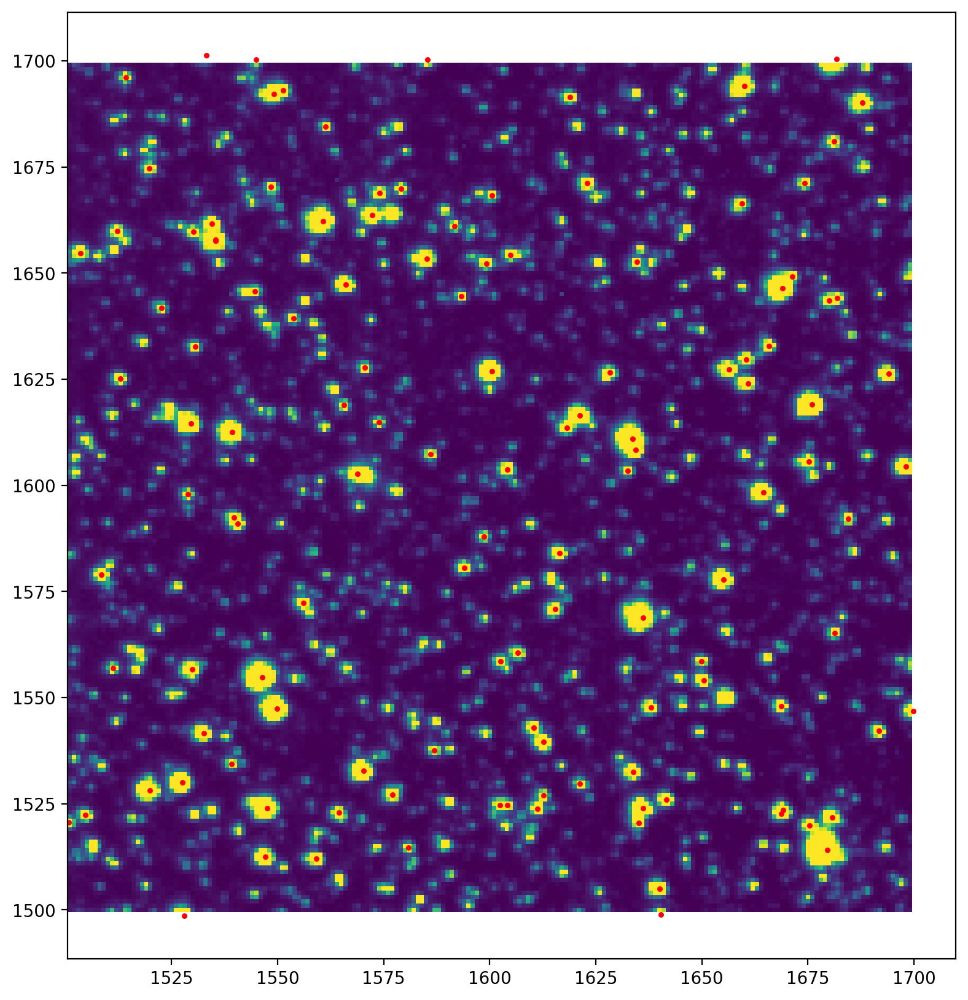

In [11]:
# plot bright sources
plt.figure(figsize=(10, 10))
plt.pcolormesh(C, R, data, vmin=0, vmax=200)
bright_sources = df.phot_rp_mean_flux > 1e5
plt.scatter(df["X0"][bright_sources], df["Y0"][bright_sources], s=5, c="r")
plt.gca().set_aspect("equal")

In [15]:
df['tess_flux'] = utils.mag_to_flux(df.j_m)

## Centroid Finding

In [280]:
from photutils.datasets import make_4gaussians_image
from photutils.centroids import (centroid_1dg, centroid_2dg,
                                 centroid_com, centroid_quadratic)

d1 = make_4gaussians_image()[43:79, 76:104]

x1, y1 = centroid_com(d1)
print((x1, y1))  


x2, y2 = centroid_quadratic(d1)
print((x2, y2))  

x3, y3 = centroid_1dg(d1)
x4, y4 = centroid_2dg(d1)



(13.93157998341214, 17.05123444106709)
(13.948284438186919, 16.98788199435759)


(0.0, 35.0)

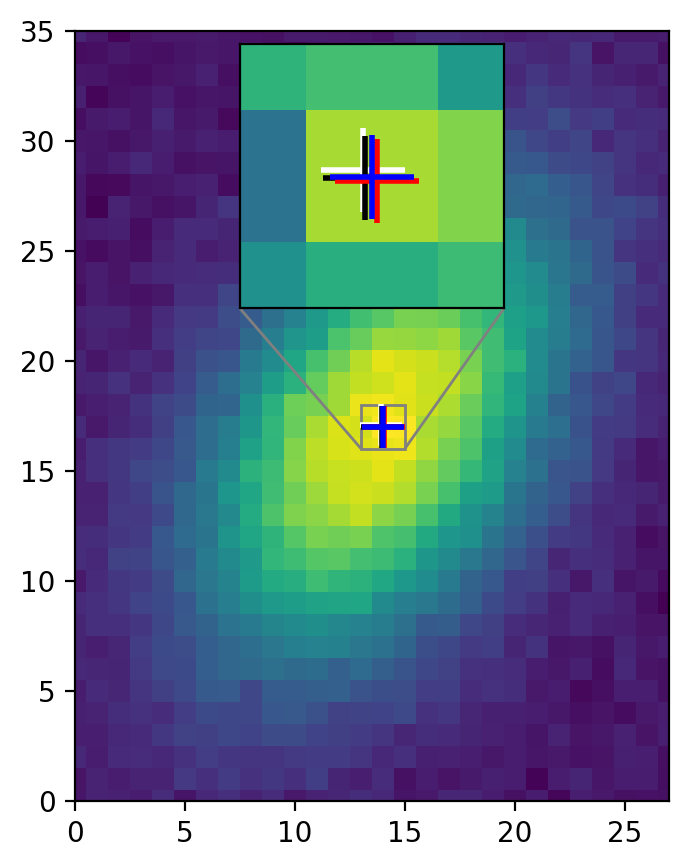

In [281]:
# for a single source
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import (mark_inset,
                                                   zoomed_inset_axes)
from photutils.centroids import (centroid_1dg, centroid_2dg,
                                 centroid_com, centroid_quadratic)
from photutils.datasets import make_4gaussians_image

data = make_4gaussians_image()[43:79, 76:104]  # extract single object
xycen1 = centroid_com(data)
xycen2 = centroid_quadratic(data)
xycen3 = centroid_1dg(data)
xycen4 = centroid_2dg(data)
xycens = [xycen1, xycen2, xycen3, xycen4]
fig, ax = plt.subplots(1, 1, figsize=(4, 5))
ax.imshow(data, origin='lower', interpolation='nearest')
marker = '+'
ms, mew = 15, 2.0
colors = ('white', 'black', 'red', 'blue')
for xycen, color in zip(xycens, colors):
    plt.plot(*xycen, color=color, marker=marker, ms=ms, mew=mew)

ax2 = zoomed_inset_axes(ax, zoom=6, loc=9)
ax2.imshow(data, vmin=190, vmax=220, origin='lower',
           interpolation='nearest')
ms, mew = 30, 2.0
for xycen, color in zip(xycens, colors):
    ax2.plot(*xycen, color=color, marker=marker, ms=ms, mew=mew)
ax2.set_xlim(13, 15)
ax2.set_ylim(16, 18)
mark_inset(ax, ax2, loc1=3, loc2=4, fc='none', ec='0.5')
ax2.axes.get_xaxis().set_visible(False)
ax2.axes.get_yaxis().set_visible(False)
ax.set_xlim(0, data.shape[1] - 1)
ax.set_ylim(0, data.shape[0] - 1)


In [293]:
from photutils.centroids import centroid_sources
d1 = make_4gaussians_image()
x_init = (25, 91, 151, 160)
y_init = (40, 61, 24, 71)
x, y = centroid_sources(d1, x_init, y_init, box_size=21,
                        centroid_func=centroid_com)
print(x)  

print(y)  



[ 24.98911515  90.43056554 150.20332399 159.87234831]
[40.08504359 60.56869612 24.74216925 70.32723054]


(100, 200)
1599.5 1600.0


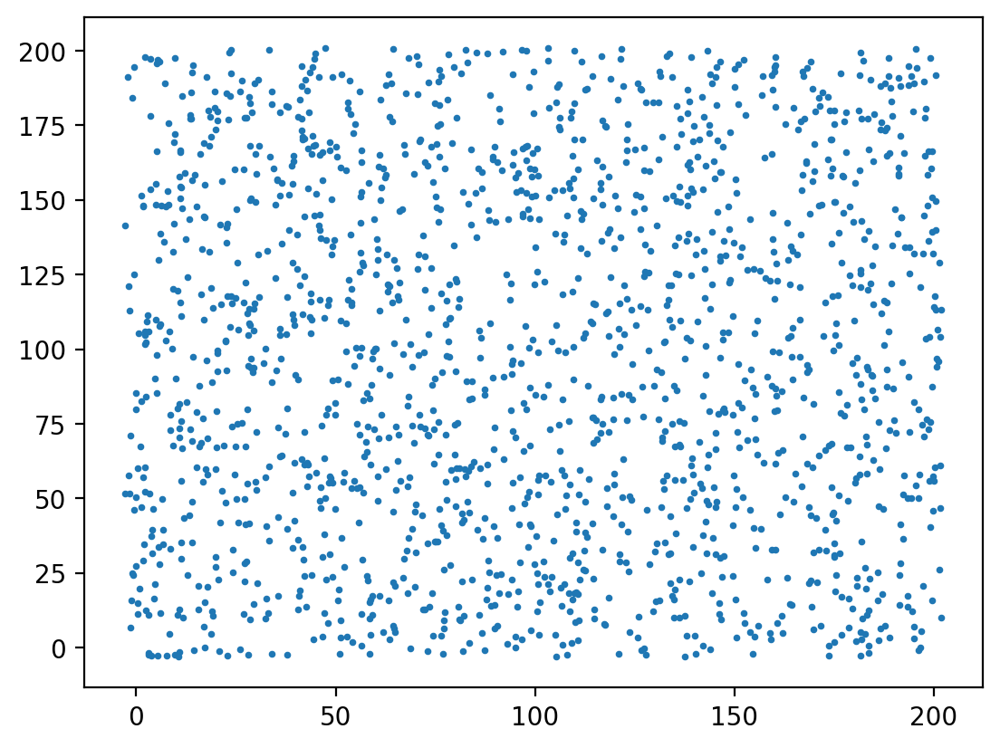

In [308]:
print(d1.shape)
print(R0, C0)

origin = (1500, 1501)
x_init = df.X0.to_numpy() - origin[0]
y_init = df.Y0.to_numpy() - origin[1]


plt.scatter(df.X0 - 1500 , df.Y0 - 1501, s=3)
plt.show()

In [312]:
data.shape

(200, 199)

In [325]:
df[df.j_m < 13]

,dr2_teff_val,propagated_position_vector,dec,ruwe,parallax,dr2_logg,j_msigcom,phot_g_mean_flux,ra,ang_sep,...,pmdec,j_m,source_id,logg_gspphot,teff_gspphot,phot_g_mean_mag,RA_EPOCH,DEC_EPOCH,X0,Y0
957,3923.852295,"(0.491639321886029 , 0.608882468391932)",34.886119,1.156516,21.321293,NaN,0.024,8.350439e+03,28.169051,0.493707,...,-62.150979,12.500,306138091969699072,NaN,3923.852295,15.883094,28.169134,34.886000,1684.23,1622.91
971,3748.157471,"(0.500460195702809 , 0.610198186000156)",34.961478,1.170136,9.245374,NaN,0.025,1.032828e+04,28.675335,0.264968,...,-68.044015,12.970,306151698426078208,4.7605,3473.804199,15.652297,28.675800,34.961348,1611.63,1644.42
990,4544.200195,"(0.502798646954417 , 0.616256505027901)",35.308538,1.221260,10.405247,NaN,0.023,9.534515e+03,28.808274,0.182562,...,-80.626710,12.621,330190630381971968,NaN,4544.200195,15.739120,28.808288,35.308384,1566.99,1599.26
1035,3476.500000,"(0.494982076565423 , 0.609748516613648)",34.935911,1.062253,8.411362,NaN,0.025,1.211462e+04,28.361492,0.351327,...,-23.840880,12.976,306160150921723520,4.8765,3548.774414,15.479093,28.361970,34.935865,1654.87,1627.87
1047,3725.653320,"(0.491481757130486 , 0.618333562087574)",35.427802,0.986032,5.168598,NaN,0.024,1.263671e+04,28.160198,0.422416,...,-22.716015,12.897,306237013656312704,4.7075,3709.276611,15.433282,28.160357,35.427759,1642.13,1538.51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1694,5891.000000,"(0.496330050785257 , 0.612219848337131)",35.077298,1.167901,12.099283,NaN,0.019,5.528051e+06,28.437965,0.202372,...,-70.905554,7.825,306167229027808896,4.3021,5775.353516,8.830936,28.438115,35.077162,1633.65,1610.98
1695,6757.240234,"(0.493785949574083 , 0.615881283565425)",35.287323,1.072068,5.133903,4.5,0.026,7.983456e+06,28.291778,0.269584,...,-17.017269,7.741,306220520981998464,3.7679,6681.290039,8.431890,28.291747,35.287290,1636.14,1568.87
1696,4663.859863,"(0.502595471720007 , 0.621177497521395)",35.590835,6.096034,2.676897,4.5,0.023,6.499604e+06,28.796650,0.399045,...,-3.204678,6.954,330204442996680704,4.5000,4663.859863,8.655149,28.796672,35.590829,1546.35,1554.76
1697,6074.033203,"(0.4961084380748 , 0.602042145958772)",34.494168,0.980594,8.585703,4.5,0.021,8.879824e+06,28.424972,0.743132,...,-68.749455,7.368,305927329334464512,3.8683,5992.208984,8.316356,28.424994,34.494037,1681.70,1700.44


In [333]:
tdf = df1.iloc[max_contributor_ind[ss_mask]].drop_duplicates(['X0', 'Y0'], keep='first')
# tdf = df[np.unique(max_contributor_ind[ss_mask])]


In [ ]:
plt.imshow(np.log(data))#, vmin=0, vmax=200)
plt.scatter(x_init[k&j], y_init[k&j], s=3)
plt.scatter(cx, cy, s=3)
plt.show()

11.069999999999936 189.47000000000003
11.0 189.1300000000001


/var/folders/kk/_9cq7r5j5nd8cxryt5p59v2c0000gn/T/ipykernel_1096/3000070617.py:11: RuntimeWarning: invalid value encountered in log
  cx, cy = centroid_sources(np.log(data), x_init[k&j], y_init[k&j], box_size=21,


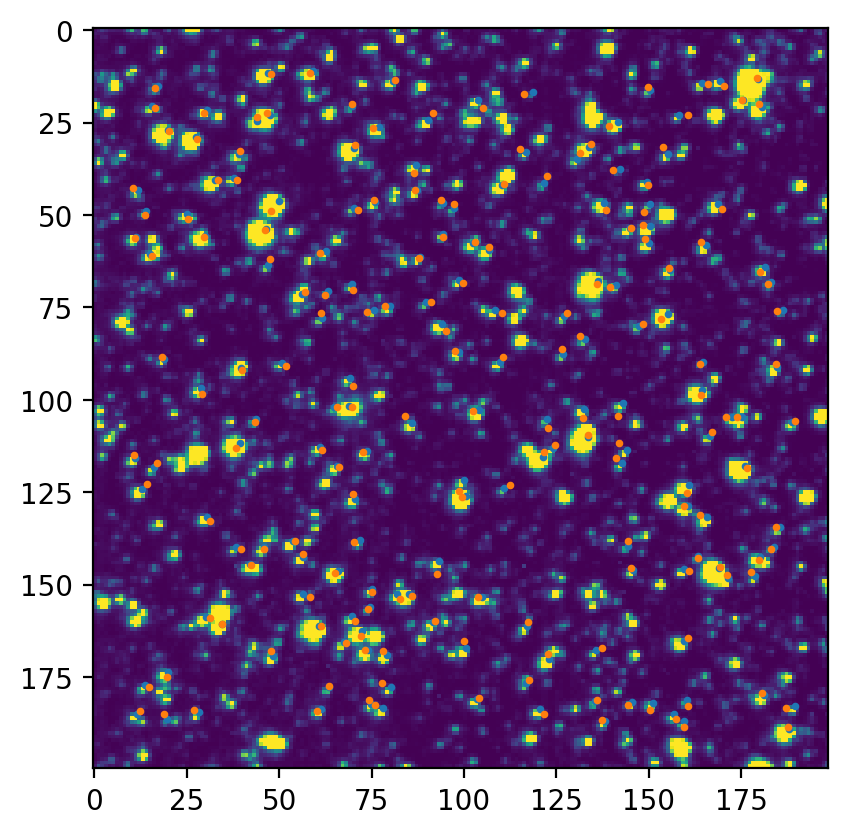

In [337]:
origin = (1500, 1501)
x_init = tdf.X0.to_numpy() - origin[0]
y_init = tdf.Y0.to_numpy() - origin[1]

k = (x_init > 10) & (y_init > 10) & (x_init < 190) & (y_init < 190)
j = tdf.j_m < 13

print(min(x_init[k&j]), max(x_init[k&j]))
print(min(y_init[k&j]), max(y_init[k&j]))

cx, cy = centroid_sources(np.log(data), x_init[k&j], y_init[k&j], box_size=21,
                        centroid_func=centroid_com, mask=ss_mask.reshape(image_shape))

plt.imshow(data, vmin=0, vmax=200)
plt.scatter(x_init[k&j], y_init[k&j], s=3)
plt.scatter(cx, cy, s=3)
plt.show()

In [ ]:
# christina's variables
# y, ye, dx, dy = np.hstack(y), np.hstack(ye), np.hstack(dx), np.hstack(dy)
# ye = 2.5 * ye/y * np.log(10)
# y = np.log10(y)
# k = np.isfinite(y) & np.isfinite(ye)
# y, ye, dx, dy, = y[k], ye[k], dx[k], dy[k] 
# r, phi = np.hypot(dx, dy), np.arctan2(dy, dx)

In [ ]:
# y = data.ravel()
# yerr = err.ravel()

y1 = np.hstack(data.ravel() / max_contributor_flux)
ye1 = 2.5 * yerr/y * np.log(10)

dx = np.hstack(C.ravel() - df1.iloc[max_contributor_ind][x_col].to_numpy())
dy = np.hstack(R.ravel() - df1.iloc[max_contributor_ind][y_col].to_numpy())
y1, ye1, dx, dy, = y1[ss_mask], ye1[ss_mask], dx[ss_mask], dy[ss_mask] 
r, phi = np.hypot(dx, dy), np.arctan2(dy, dx)

In [ ]:
# plt.scatter(phi, np.log(r), s=3)
# plt.scatter(dx, dy, s=3)


## Nearest neighbor analysis

In [168]:
# before we get into PSF stuff, let's check out the catalog and do some nearest neighbor analysis!
from astropy.coordinates import match_coordinates_sky

catalog = SkyCoord(ra=df.ra*u.degree, dec=df.dec*u.degree)
idx, d2d, d3d = match_coordinates_sky(catalog, catalog, nthneighbor=2)

In [207]:
d2d.arcsec

array([78.94383625, 57.55543979, 17.34307967, ..., 59.39402407,
       93.88356257, 22.18364513])

1000


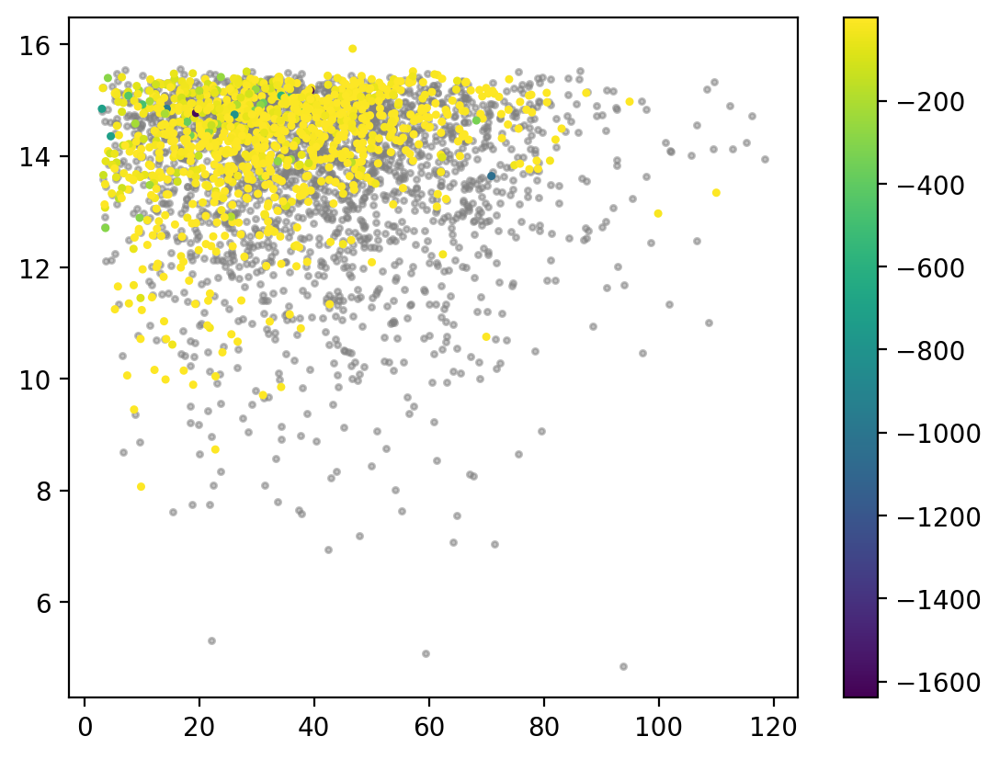

In [244]:
mdf = pd.DataFrame({'idx1':np.arange(len(idx)), 'idx2':idx, 'd2d':d2d.arcsec, 'd3d':d3d})
# make sure you're using the w that has individual source flux fitting
# len(w)

# source flux weights
sf = w[:-2]

# add weights of the star and it's nearest neighbor to the df
mdf['w1'] = sf 
mdf['w2'] = 0

for i in range(len(mdf)):
    mdf.loc[i,'w2'] = sf[mdf.loc[i,'idx2']]

print(len(sf[sf<0]))

plt.scatter(mdf.d2d[sf>0], df[sf>0].j_m, s=5, c='grey', alpha=0.5)
plt.scatter(mdf.d2d[sf<0], df[sf<0].j_m, s=5, c=sf[sf<0])
plt.colorbar()
# plt.xlim([-2000,0])
plt.show()

3143
1910


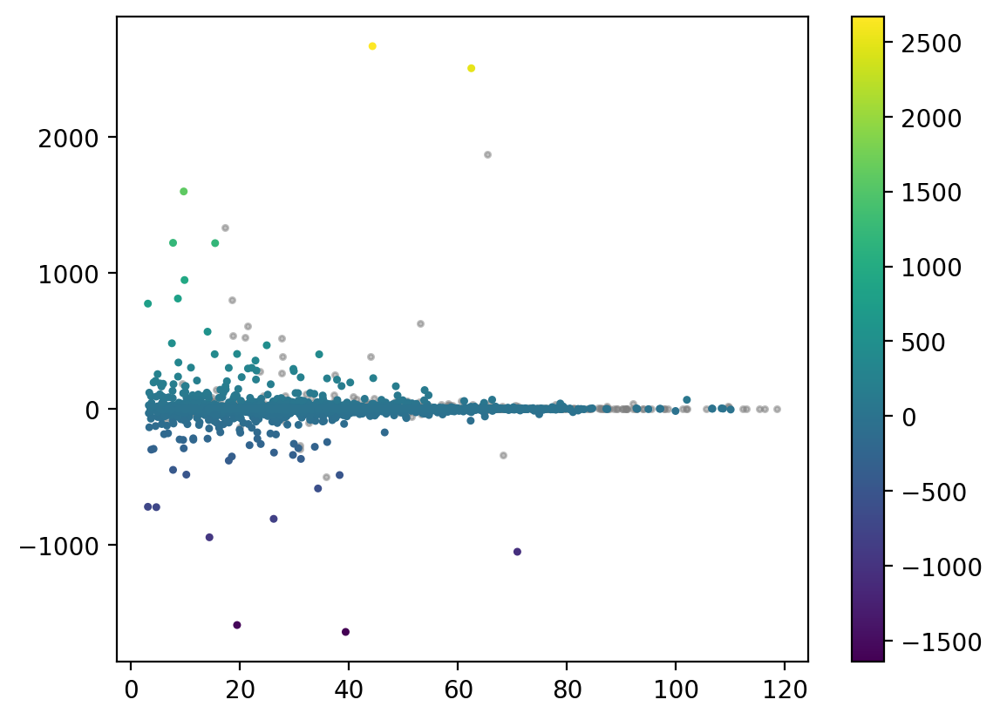

In [248]:
# how many neighbor pairs have one positive and one negative flux?

print(len(mdf))
print(len(mdf[(mdf.w1 / mdf.w2) < 0]))

plt.scatter(mdf.d2d[(mdf.w1 / mdf.w2) > 0], mdf[(mdf.w1 / mdf.w2) > 0].w1, s=5, c='grey', alpha=0.5)
plt.scatter(mdf.d2d[(mdf.w1 / mdf.w2) < 0], mdf[(mdf.w1 / mdf.w2) < 0].w1, s=5, c=sf[(mdf.w1 / mdf.w2) < 0])
plt.colorbar()
# plt.xlim([-2000,0])
plt.show()

(-100.0, 100.0)

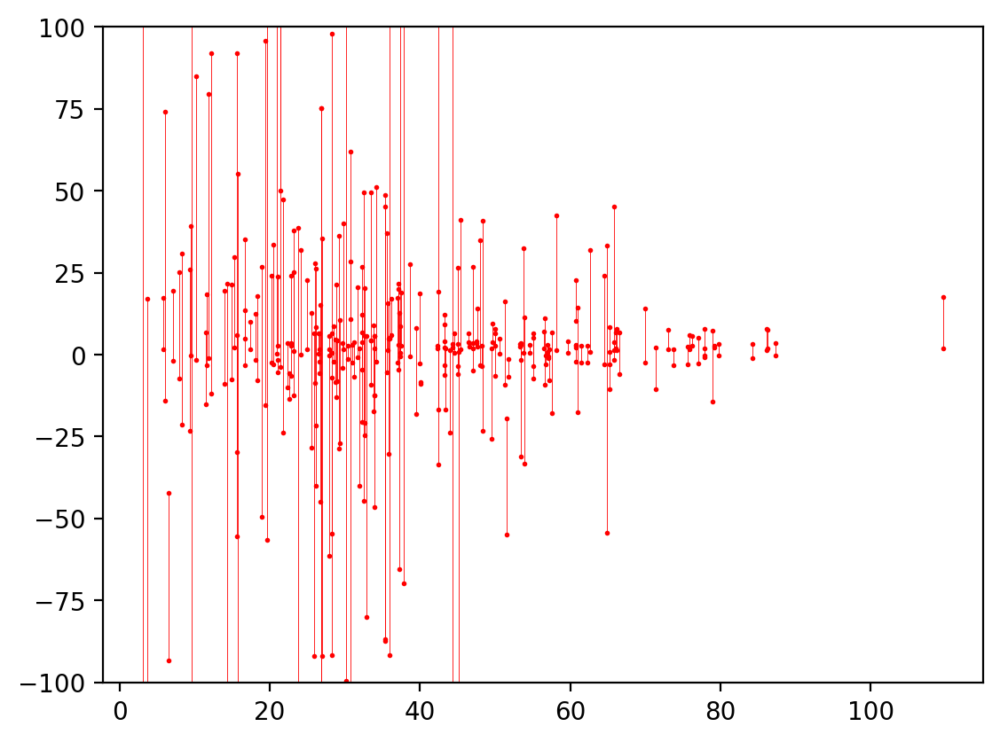

In [238]:
# for i in range(len(df)):
for i1 in range(200):
    i2 = mdf.loc[i1, 'idx2']

    # plot jmag
    # plt.plot([mdf.loc[i1, 'd2d']]*2, df.loc[[i1,i2], 'j_m'], 'ro-', markersize=3)    

    # plot the weight
    plt.plot([mdf.loc[i1, 'd2d']]*2, sf[[i1,i2]], 'ro-', markersize=1, linewidth=.3)

plt.ylim([-100,100])

## Main procedure (wip)

### Estimate Gaussian STD and Flux Coefficients (NEW)

Min STD: 1.1
Flux Coeff: 178.13224253739546


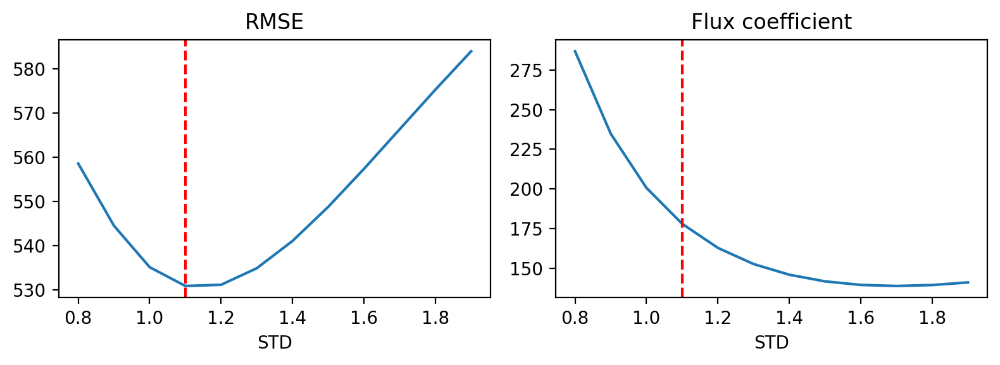

In [12]:
# as a first step, do a fit for a linear position shift and a constant flux coefficient across the entire image

stds = np.arange(0.8,2., 0.1)
flux_coeffs = np.zeros_like(stds)
rmse = np.zeros_like(stds)
w0s = np.zeros([len(stds),3])

y = data.ravel()
yerr = err.ravel()
# Finite pixel mask and positive pixel mask
k = np.isfinite(y)
j = y > 0

for ind, std in enumerate(stds):
    s = get_gaussian_design_matrix(df, source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
    s1 = sparse.hstack([s[:,:-2].sum(axis=1), s[:,-2], s[:,-1]], 'csr')

    # weight the pixels by their flux errors
    sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
    w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))    
    
    # # no errors
    # sigma_w_inv = s1.T.dot(s1)
    # w = np.linalg.solve(sigma_w_inv.toarray(), s1.T.dot(y))

    flux_coeffs[ind] = 1/w[0]
    w0s[ind] = w
    # out_image = s1.dot(w).reshape(image_shape)
    # output[ind] = np.sum(np.abs(data - s1.dot(w).reshape(image_shape)))

    # this is the RMSE
    rmse[ind] = np.sqrt(np.mean((data - s1.dot(w).reshape(image_shape))**2))

# take the STD and the flux_coeff that minimizes the resids
# Note: need to fix the resids function later
ind = np.argmin(rmse)
std = stds[ind]
flux_coeff = flux_coeffs[ind]
w0 = w0s[ind]
print('Min STD: ' + str(std))
print('Flux Coeff: ' + str(flux_coeff))

# plot
if True:
    fig, ax = plt.subplots(1,2, figsize=[8,3])
    ax[0].plot(stds,rmse)
    ax[0].set_title('RMSE')
    ax[0].axvline(std, c='r', linestyle='--')
    ax[0].set_xlabel('STD')

    ax[1].plot(stds,flux_coeffs)
    ax[1].set_title('Flux coefficient')
    ax[1].axvline(std, c='r', linestyle='--')
    ax[1].set_xlabel('STD')
    fig.tight_layout()


In [13]:
model_image = s1[:,:-2].sum(axis=1).reshape(image_shape) / data
# model_image = s.sum(axis=1).reshape(image_shape) / data

print(w[-2:])

# plots
if False:
    plt.imshow(s1.dot(w).reshape(image_shape)-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    plt.imshow(s1[:,:-2].dot(w[:-2]).reshape(image_shape)-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

[-0.00778485  0.01005234]


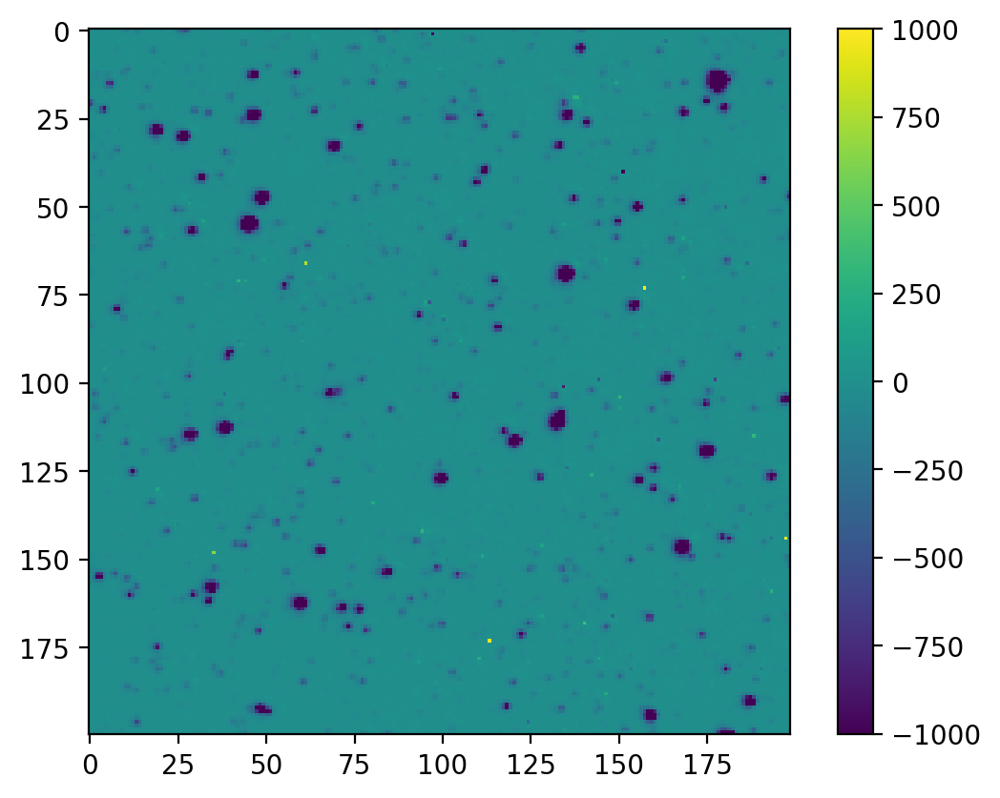

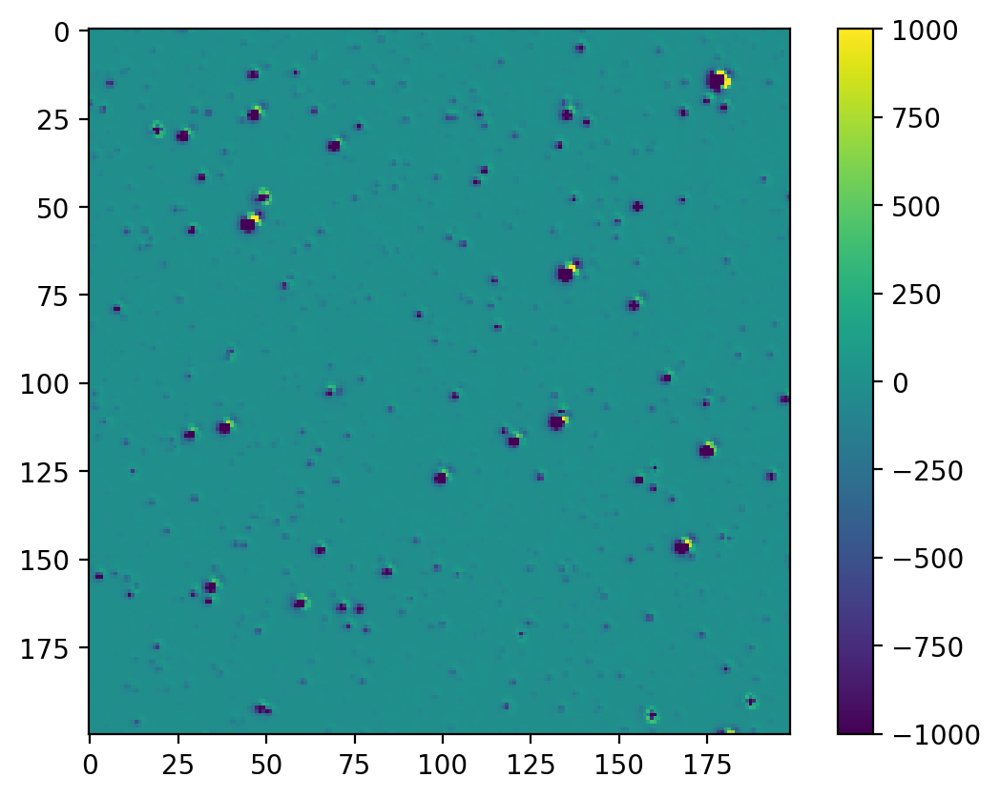

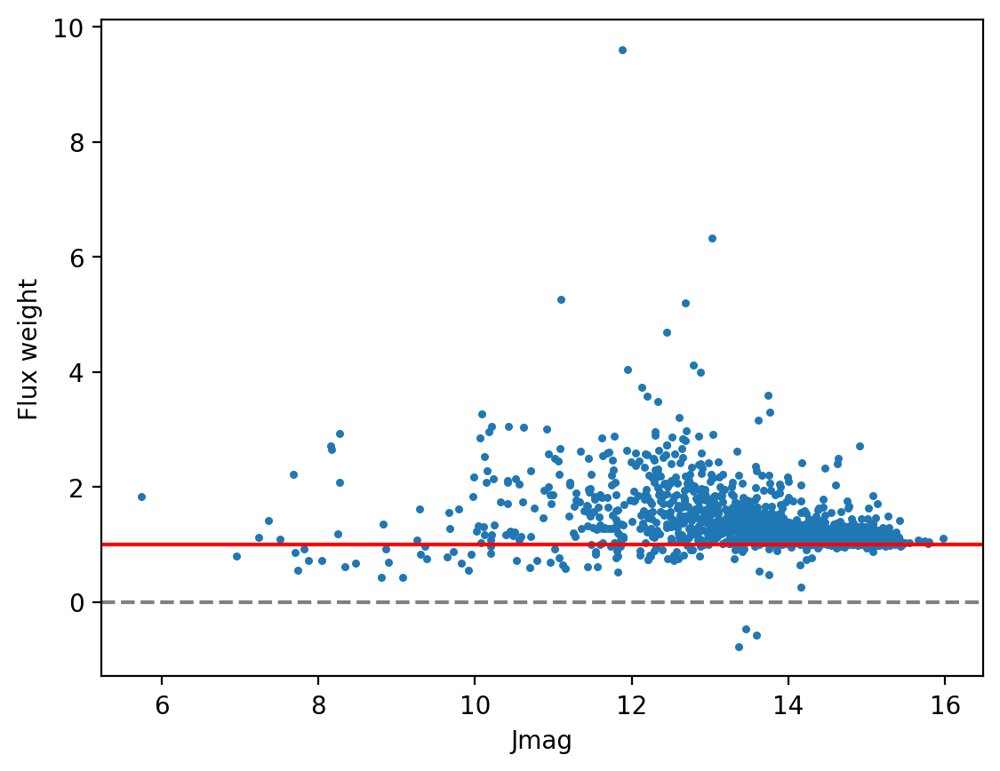

In [14]:
# Now fit individually for fluxes, using a tight gaussian prior

# impose a flux cutoff (currently disabled)
# flux_mask = df.j_m < 14
flux_mask = df.j_m < 100

# note that we have divided by the flux coeff
# s = get_gaussian_psfs(df, source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
# s = s[:, np.hstack([flux_mask, True, True])]
# s1 = sparse.hstack([s[:,:-2] / flux_coeff, s[:,-2], s[:,-1]], 'csr')

s1 = get_gaussian_scene(df, source_flux=np.asarray(df.phot_rp_mean_flux) / flux_coeff, std=std)
ds_x1, ds_y1 = get_gaussian_gradients(df, source_flux=np.asarray(df.phot_rp_mean_flux) / flux_coeff, std=std)

# stack themem together
A = sparse.hstack([s1, ds_x1, ds_y1], 'csr')

# define priors on the flux weights
prior_mu = np.ones(A.shape[1])
prior_sigma = (np.ones(A.shape[1]) * .02)

# set different priors for the last two terms, which apply to the gradients
prior_mu[-2:] = 0
prior_sigma[-2:] = 1

# regression with priors
sigma_w_inv = A.T.dot(A/yerr[:, None]**2)
sigma_w_inv += np.diag(prior_mu / (prior_sigma ** 2))
B = A.T.dot(y/yerr**2)
B = A.T.dot(y/yerr**2) + prior_mu / (prior_sigma ** 2) 
w = np.linalg.solve(sigma_w_inv, B)
# werrs = np.linalg.inv(sigma_w_inv).diagonal() ** 0.5

model_image = s1.sum(axis=1).reshape(image_shape) / data
out_image = A.dot(w).reshape(image_shape)

# plots
if True:
    plt.imshow(model_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    plt.imshow(out_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    # check the distribution of weights
    plt.scatter(df[flux_mask].j_m, w[:-2], s=5)
    # plt.ylim([-30,30])
    # plt.ylim([-5,5])
    # plt.xscale('log')
    plt.axhline(1, c='r')
    plt.axhline(0, c='grey', linestyle='--')
    plt.xlabel('Jmag')
    plt.ylabel('Flux weight')
    plt.show()


In [15]:
w[-2:]

array([-0.79837643,  0.7891693 ])

3


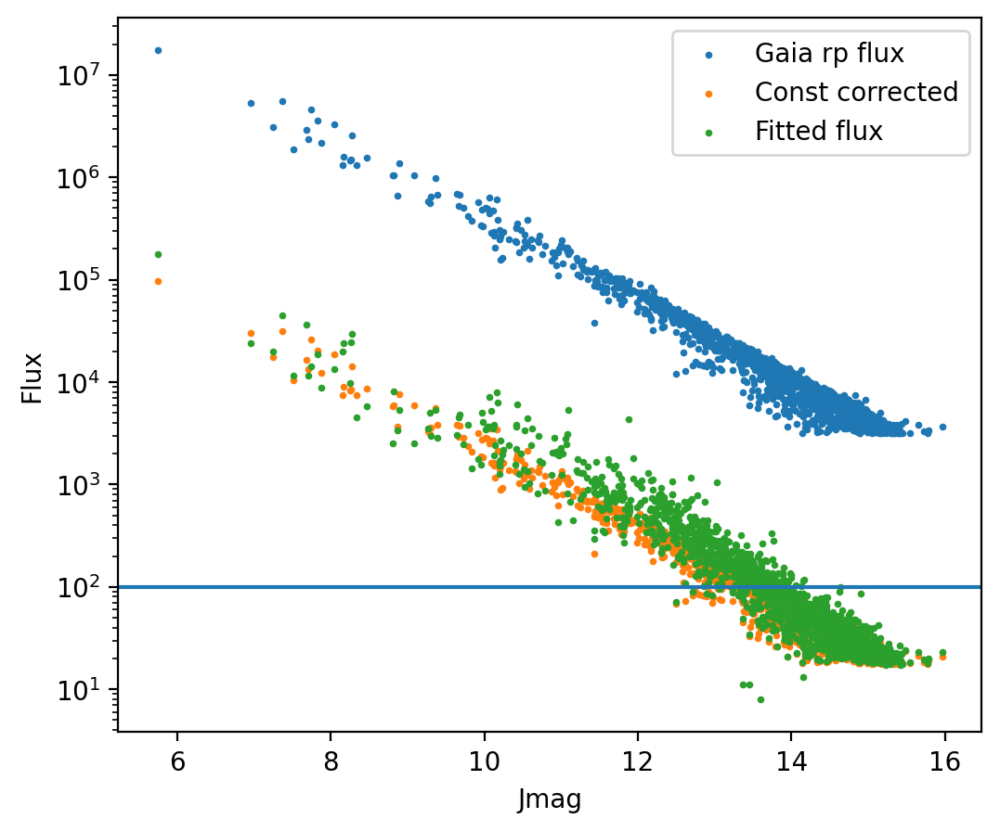

In [16]:
# Caculate the new flux array guess
# Reset weights that are below 0.1 get reset to 0.1
w_cut = np.hstack(((w[:-2] < .1), [False, False]))
print(sum(w_cut))

w_m = w.copy()
w_m[w_cut] = 0.1
flux_new = df.phot_rp_mean_flux / flux_coeff * w_m[:-2]

# print(sum(flux_new < 0))

# plot
if True:
    plt.figure(figsize=[6,5])
    plt.scatter(df.j_m, df.phot_rp_mean_flux, s=3, label='Gaia rp flux')
    plt.scatter(df.j_m, df.phot_rp_mean_flux / flux_coeff, s=3, label='Const corrected')
    plt.scatter(df.j_m, flux_new, s=3, label='Fitted flux')
    plt.axhline(100)
    plt.yscale('log')
    plt.xlabel('Jmag')
    plt.ylabel('Flux')
    plt.legend()
    plt.show()


In [17]:
print(sum(flux_mask))
print(len(df))

1699
1699


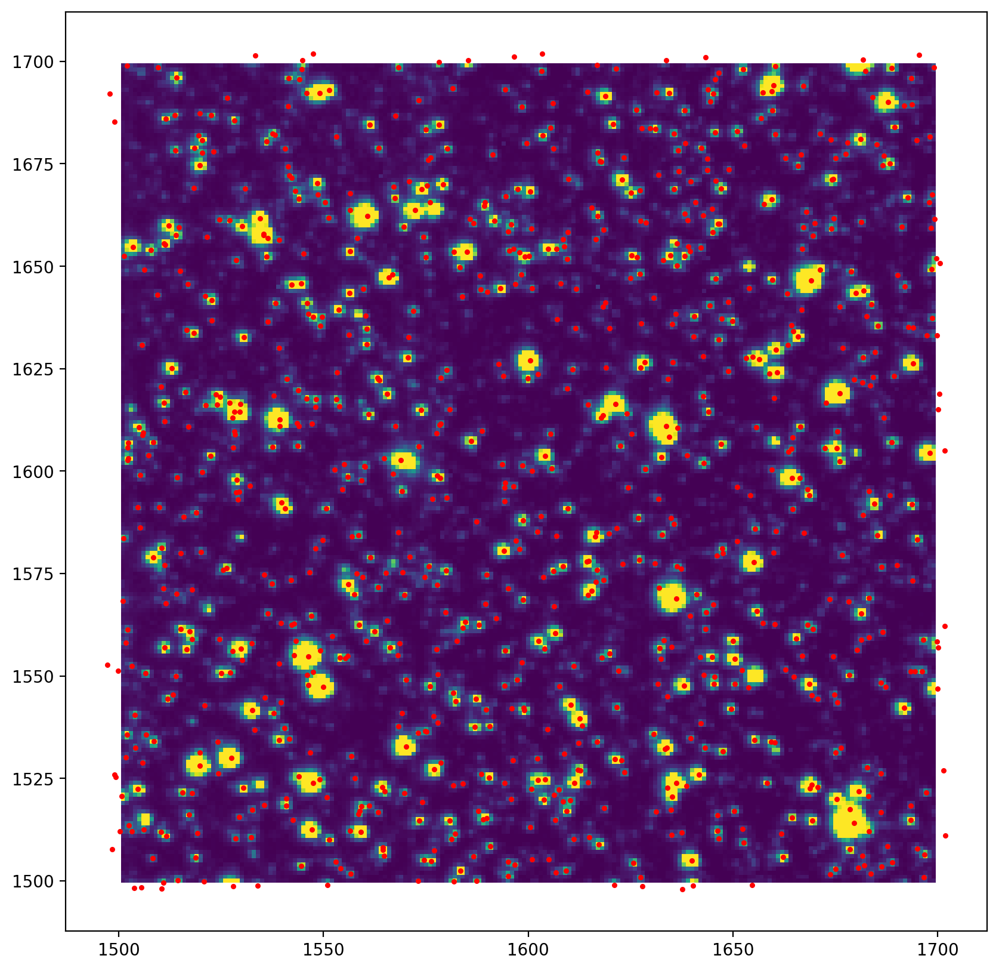

In [18]:
# downselect only to sources above a certain flux
flux_mask = flux_new > 50
df['flux_fit1'] = flux_new
df1 = df[flux_mask]


plt.figure(figsize=(10, 10))
plt.pcolormesh(C, R, data, vmin=0, vmax=200)
bright_sources = df.phot_rp_mean_flux > 1e5
plt.scatter(df1["X0"], df1["Y0"], s=5, c="r")
plt.gca().set_aspect("equal")

Text(0, 0.5, 'NN Separation (arcsec)')

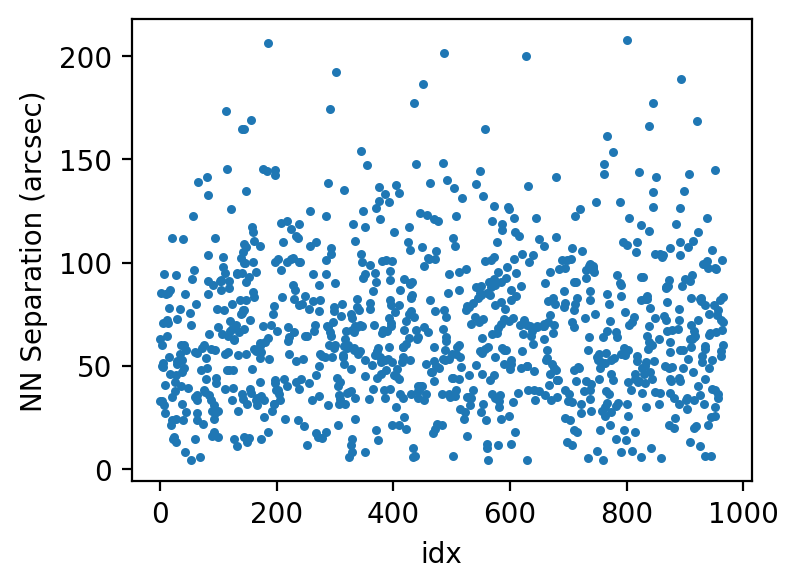

In [19]:
# check nearest neighbors
catalog = SkyCoord(ra=df1.ra*u.degree, dec=df1.dec*u.degree)
idx, d2d, d3d = match_coordinates_sky(catalog, catalog, nthneighbor=2)

plt.figure(figsize=[4,3])
plt.scatter(idx, d2d.arcsec, s=5)
plt.xlabel('idx')
plt.ylabel('NN Separation (arcsec)')

### Contamination Ratio and Single-Source Selection

In [20]:
# s2 is a gaussian model with low-flux sources eliminated and the gradient shift applied
flux_mask = flux_new > 30
df1 = df[flux_mask]
df1['X1'] = df1['X0'] + w[-2]
df1['Y1'] = df1['Y0'] + w[-1]

x_col = 'X0'; y_col = 'Y0'
# x_col = 'X1'; y_col = 'Y1'

s2 = get_gaussian_scene(
    df1, source_flux=np.asarray(df1.flux_fit1), std=std, x_col=x_col, y_col=y_col
    )
ds_x2, ds_y2 = get_gaussian_gradients(
    df1, source_flux=np.asarray(df1.flux_fit1), std=std, x_col=x_col, y_col=y_col
    )

A2 = sparse.hstack([s2, ds_x2, ds_y2], 'csr')
A2.shape

/var/folders/kk/_9cq7r5j5nd8cxryt5p59v2c0000gn/T/ipykernel_77511/3312590181.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['X1'] = df1['X0'] + w[-2]
/var/folders/kk/_9cq7r5j5nd8cxryt5p59v2c0000gn/T/ipykernel_77511/3312590181.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Y1'] = df1['Y0'] + w[-1]


(39800, 1316)

In [27]:
np.log(s2.tocoo().toarray())

/var/folders/kk/_9cq7r5j5nd8cxryt5p59v2c0000gn/T/ipykernel_77511/66211545.py:1: RuntimeWarning: divide by zero encountered in log
  np.log(s2.tocoo().toarray())


array([[-inf, -inf, -inf, ..., -inf, -inf, -inf],
       [-inf, -inf, -inf, ..., -inf, -inf, -inf],
       [-inf, -inf, -inf, ..., -inf, -inf, -inf],
       ...,
       [-inf, -inf, -inf, ..., -inf, -inf, -inf],
       [-inf, -inf, -inf, ..., -inf, -inf, -inf],
       [-inf, -inf, -inf, ..., -inf, -inf, -inf]])

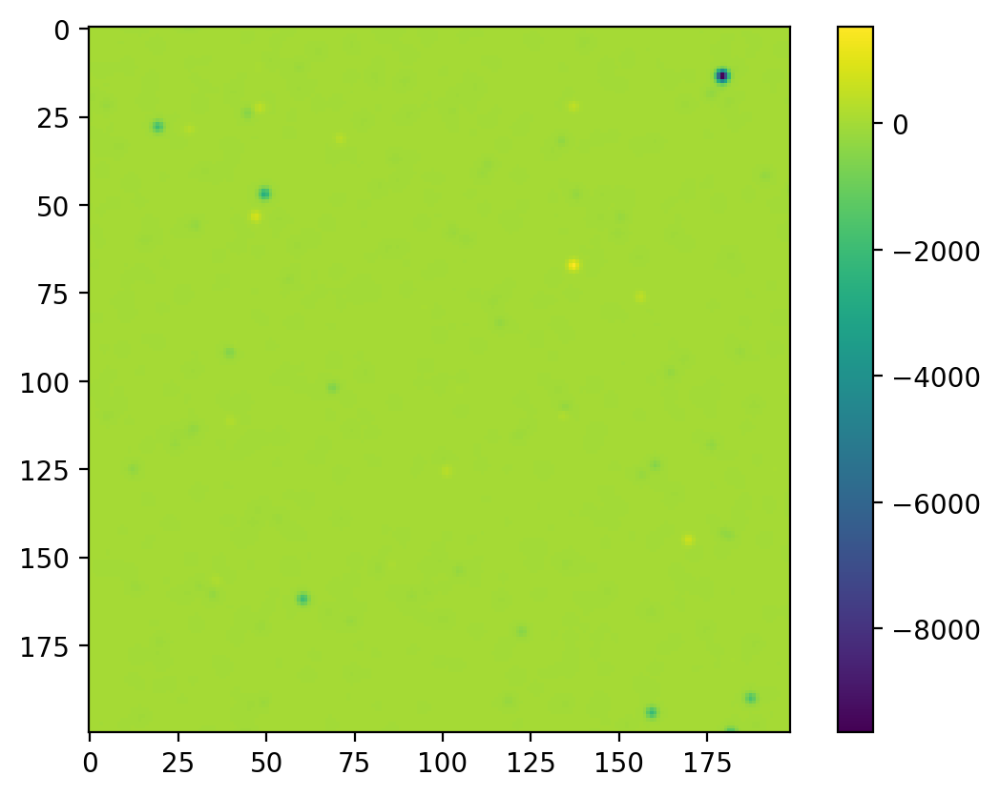

In [21]:
plt.imshow(s1.sum(axis=1).reshape(image_shape) - s2.sum(axis=1).reshape(image_shape) )
# plt.imshow(s.sum(axis=1).reshape(image_shape) - s2.sum(axis=1).reshape(image_shape) )
plt.colorbar()
plt.show()


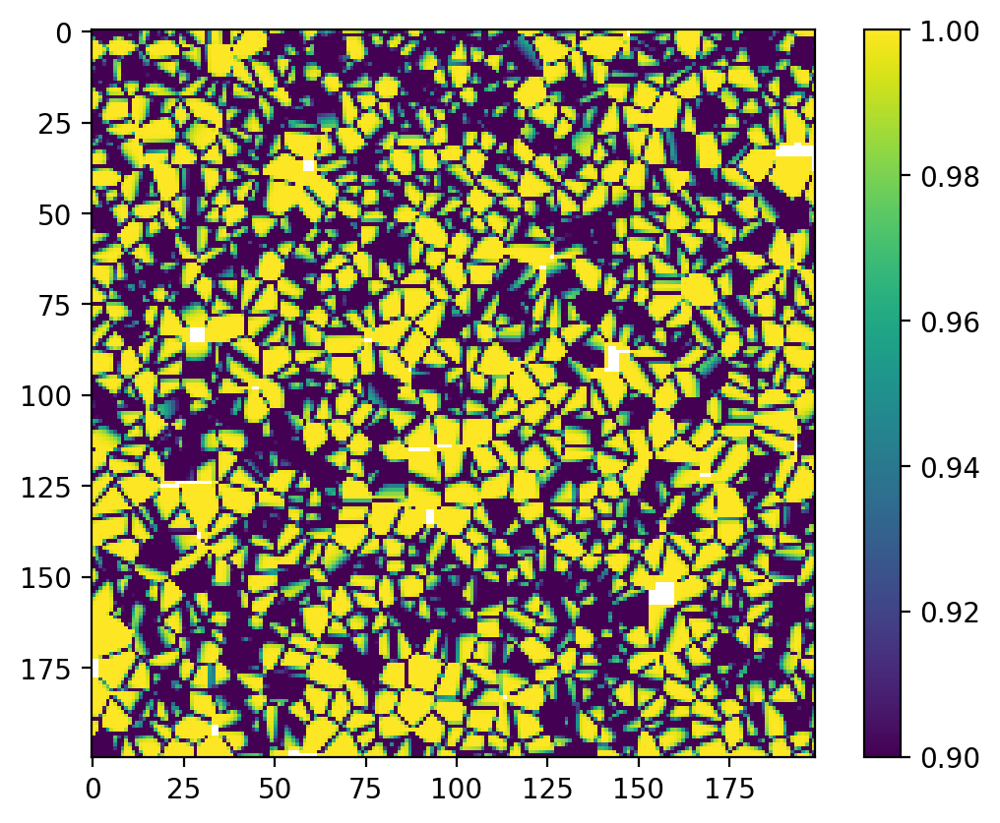

In [80]:
# calculate the contamination ratio
# calculate the cont ratio, the second of which incorporates the gradient shifts
con_ratio = s2.max(axis=1) / s2.sum(axis=1)
# log_cr = np.log(s2.max(axis=1).toarray() + .1) / (np.log(np.asarray(s2.sum(axis=1)) + .1))
# log_cr = np.log(s2.max(axis=1).toarray()) - np.log(np.asarray(s2.sum(axis=1)))
# con_ratio2 = A.max(axis=1) / A.sum(axis=1)

# plt.imshow(con_ratio.reshape(image_shape) - con_ratio2.reshape(image_shape))
plt.imshow(con_ratio.reshape(image_shape), vmin=.9,)
# plt.imshow(log_cr.reshape(image_shape), vmin=0, vmax=2)
plt.colorbar()
plt.show()


In [81]:
# for each pixel, identify the source that is the max contributor and grab its flux
max_contributor_ind = np.asarray(s2.argmax(axis=1))[:,0]
max_contributor_flux = df1.iloc[max_contributor_ind].flux_fit1.to_numpy()

# normalize data by the flux of the max contributor to that pixel
y_norm = y / max_contributor_flux
yerr_norm = yerr / max_contributor_flux  # not sure if this is right? Check later

# plt.imshow(y_norm.reshape(image_shape))
# plt.colorbar()

355 single sources


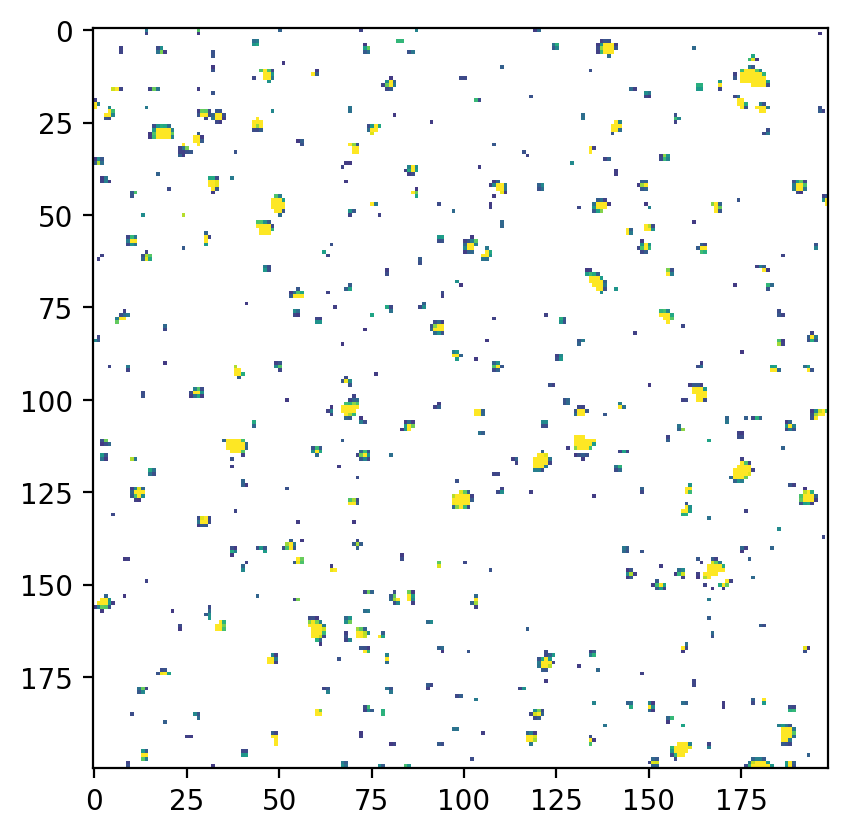

In [82]:
# Now we can select pixels by how bright they are and how "unique" their source contribution is!
m1 = np.array(con_ratio).squeeze() > .99
m2 = y > 50

# masked_array of pixels with only a single source in them
single_source_mask = np.ma.masked_where(~(m1&m2).reshape(image_shape), data)
ss_mask = ~single_source_mask.mask.ravel()

# identify the sources that survive as single source contibutors
single_source_inds = np.unique(max_contributor_ind[~single_source_mask.mask.ravel()])
print(str(len(single_source_inds)) + " single sources")

plt.imshow(single_source_mask, vmin=0, vmax=300)
# plt.colorbar()

In [27]:
df1.columns


Index(['dr2_teff_val', 'propagated_position_vector', 'dec', 'ruwe', 'parallax',
       'dr2_logg', 'j_msigcom', 'phot_g_mean_flux', 'ra', 'ang_sep',
       'phot_rp_mean_flux', 'radial_velocity', 'ph_qual', 'pmra', 'pmdec',
       'j_m', 'source_id', 'logg_gspphot', 'teff_gspphot', 'phot_g_mean_mag',
       'RA_EPOCH', 'DEC_EPOCH', 'X0', 'Y0', 'tess_flux', 'flux_fit1', 'X1',
       'Y1'],
      dtype='object')

### PSF Shape Fitting

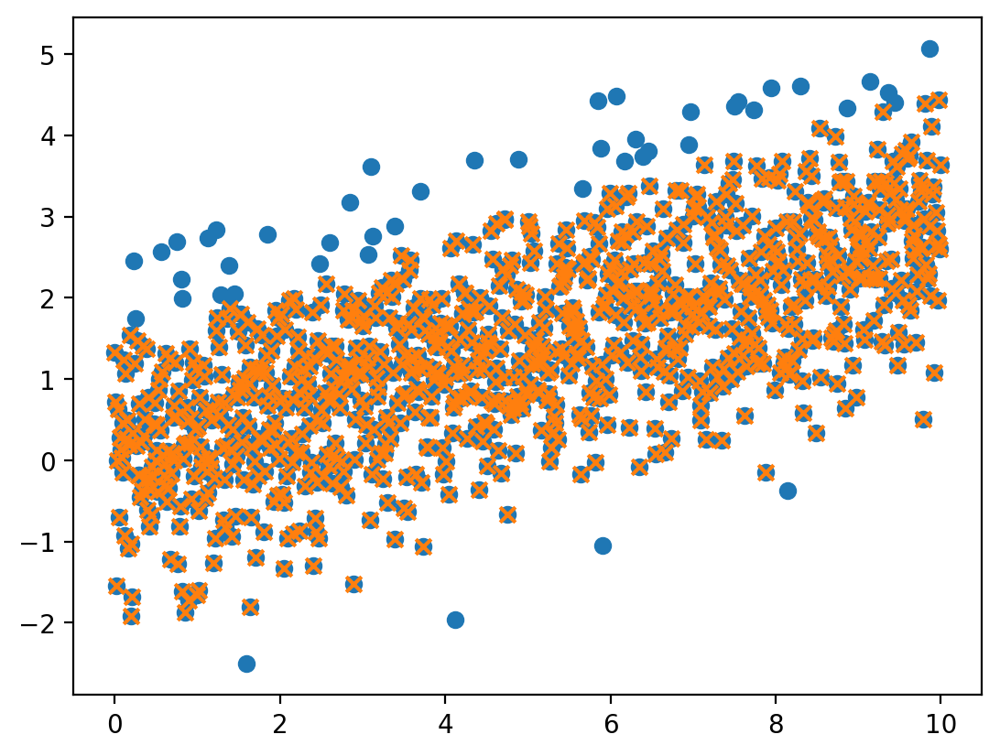

In [83]:
import operator
from scipy.optimize import curve_fit
from astropy.stats import sigma_clip

np.random.seed(10)
xdata = np.linspace(0,10,1000)
ydata = 3*np.linspace(0,1,1000) + np.random.randn(1000)

def select_min_group(xdata, ydata, n_bin=10):
    """Helper function that returns the lowest y-value points for each subgroup of size n within the data."""
    # sort the x and y values
    sorted_data = sorted(zip(xdata,ydata), key=operator.itemgetter(0))
    x_sort, y_sort = zip(*sorted_data)
    x_sort, y_sort = np.array(x_sort), np.array(y_sort)
    min_inds = np.zeros(len(xdata)//n_bin + 1).astype(int)

    # loop and grab the min in each group
    for k in np.arange(len(y_sort)//n_bin + 1) :
    # for k in [0,1] :
        sub_y = y_sort[(k*n_bin):(n_bin*(k+1))]
        if len(sub_y) == 0:
            continue
        min_inds[k] = np.argmin(sub_y)+k*n_bin

    return x_sort[min_inds], y_sort[min_inds]

def select_nth_min_group(xdata, ydata, n_bin=10, k=0):
    """Helper function that returns the kth (indexed from 0!) lowest y-value points for each subgroup of size n within the data."""
    # sort the x and y values
    sorted_data = sorted(zip(xdata,ydata), key=operator.itemgetter(0))
    x_sort, y_sort = zip(*sorted_data)
    x_sort, y_sort = np.array(x_sort), np.array(y_sort)
    min_inds = np.zeros(len(xdata)//n_bin + 1).astype(int)

    # loop and grab the min in each group
    for ind in np.arange(len(y_sort)//n_bin + 1) :
    # for k in [0,1] :
        sub_y = y_sort[(ind*n_bin):(n_bin*(ind+1))]
        if len(sub_y) < (k+1):
            continue
        min_inds[ind] = np.argpartition(sub_y,k)[k]+ind*n_bin

    return x_sort[min_inds], y_sort[min_inds]

def func_line(x, a, b):
    return a * x + b

def iterative_sigma_clip(x, y, maxiters=5, cenfunc=None, sigma_clip_kwargs=None, cenfunc_kwargs=None):
    """Docstring"""
    x_new = x.copy()
    y_new = y.copy()
    indices = np.arange(len(x_new), dtype=int)
    
    for i in range(maxiters):
        # fit line
        center = cenfunc(x_new, y_new, **cenfunc_kwargs)

        # sigma clip the residuals
        resids = y_new - center
        filtered_data = sigma_clip(resids, maxiters=1, **sigma_clip_kwargs)

        # apply the sigma clip
        mask = ~filtered_data.mask
        x_new = x_new[mask]
        y_new = y_new[mask]
        indices = indices[mask]

        if sum(filtered_data.mask) == 0:
            #this means that no points were clipped out, so exit the loop
            # print(i)
            break

    # also create a mask that can be used on the input arrays to recreate the clipped data
    final_mask = np.zeros_like(xdata, dtype=bool)
    final_mask[indices] = True

    return x_new, y_new, final_mask


def custom_fit(xdata, ydata, n_bin=10, k=1):
    # min_x, min_y = select_min_group(xdata, ydata, n_bin)  # maybe change this to select median? or percentile range?
    min_x, min_y = select_nth_min_group(xdata, ydata, n_bin, k=k)
    popt, pcov = curve_fit(func_line, min_x, min_y)
    return func_line(xdata, *popt)

plt.scatter(xdata,ydata)
# plt.scatter(xdata,filtered_data)
# mask = ~filtered_data.mask

temp1 = select_min_group(xdata,ydata, n_bin=10)
temp1 = select_nth_min_group(xdata, ydata, n_bin=10, k=1)
# temp2 = select_min_group(xdata[mask],filtered_data[mask], n_bin=10)
temp3 = iterative_sigma_clip(xdata, ydata, cenfunc=custom_fit, sigma_clip_kwargs={'sigma_upper':2, 'sigma_lower':3}, cenfunc_kwargs={'n_bin':10})
# plt.scatter(temp1[0], temp1[1], marker='x')
# plt.scatter(temp2[0], temp2[1], marker='x')
plt.scatter(temp3[0], temp3[1], marker='x')
# plt.scatter(select_min_group(xdata,filtered_data, 10))


In [84]:
# christina's variables
# y, ye, dx, dy = np.hstack(y), np.hstack(ye), np.hstack(dx), np.hstack(dy)
# ye = 2.5 * ye/y * np.log(10)
# y = np.log10(y)
# k = np.isfinite(y) & np.isfinite(ye)
# y, ye, dx, dy, = y[k], ye[k], dx[k], dy[k] 
# r, phi = np.hypot(dx, dy), np.arctan2(dy, dx)

In [85]:
# y = data.ravel()
# yerr = err.ravel()

# z1 is normalized and in log space
z1 = np.log(np.hstack(data.ravel() / max_contributor_flux))
ze1 = 2.5 * yerr/y * np.log(10)

# get dx, dy, r, and phi
dx = np.hstack(C.ravel() - df1.iloc[max_contributor_ind][x_col].to_numpy())
dy = np.hstack(R.ravel() - df1.iloc[max_contributor_ind][y_col].to_numpy())
z1, ze1, dx, dy, = z1[ss_mask], ze1[ss_mask], dx[ss_mask], dy[ss_mask] 
r, phi = np.hypot(dx, dy), np.arctan2(dy, dx)


# make the small grid cut outs (not sure if needed right now?)
npixel_radii = 8
source_mask = np.ones(len(df1), bool)
gR, gC = np.mgrid[-npixel_radii:npixel_radii+1, -npixel_radii:npixel_radii+1].astype(float)
dR = gR[None, :, :] - np.asarray(df1[x_col][source_mask] % 1)[:, None, None]
dC = gC[None, :, :] - np.asarray(df1[y_col][source_mask] % 1)[:, None, None]

/var/folders/kk/_9cq7r5j5nd8cxryt5p59v2c0000gn/T/ipykernel_77511/634266267.py:5: RuntimeWarning: invalid value encountered in log
  z1 = np.log(np.hstack(data.ravel() / max_contributor_flux))


In [86]:
# plt.scatter(phi, np.log(r), s=3)
# plt.scatter(dx, dy, s=3)
# plt.errorbar(r, z1, ze1, linestyle='')


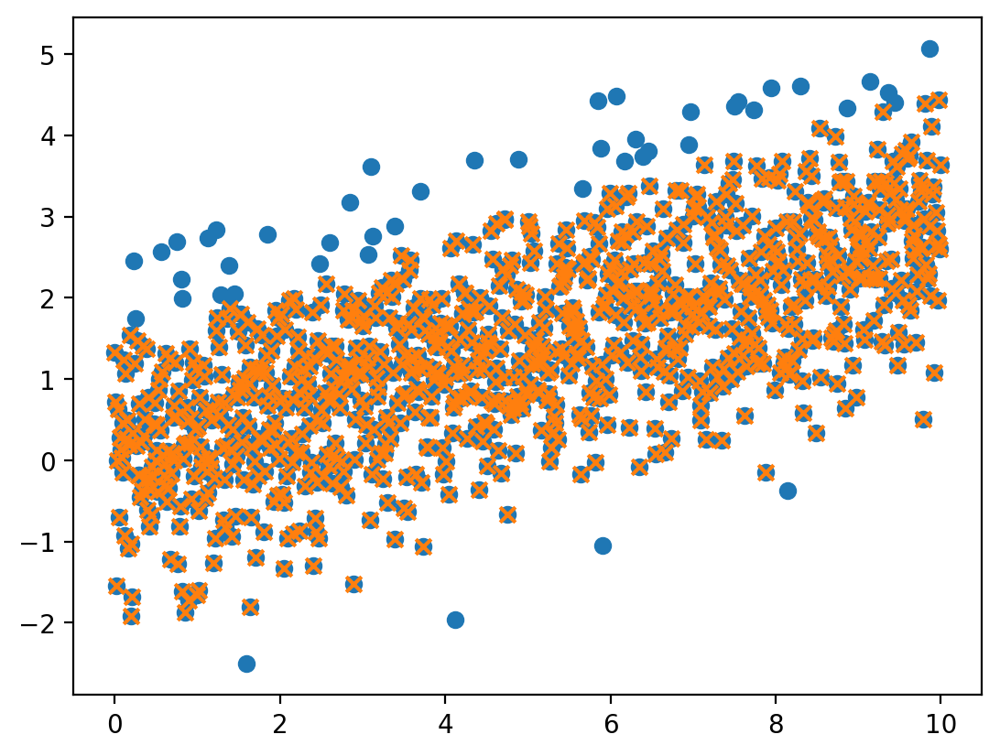

In [87]:
# Sigma clip
plt.scatter(xdata,ydata)

temp1 = select_min_group(xdata,ydata, n_bin=10)
temp2 = select_nth_min_group(xdata, ydata, n_bin=10, k=1)
temp3 = iterative_sigma_clip(xdata, ydata, cenfunc=custom_fit, sigma_clip_kwargs={'sigma_upper':2, 'sigma_lower':3}, cenfunc_kwargs={'n_bin':10})
# plt.scatter(temp1[0], temp1[1], marker='x')
# plt.scatter(temp2[0], temp2[1], marker='x')
plt.scatter(temp3[0], temp3[1], marker='x')

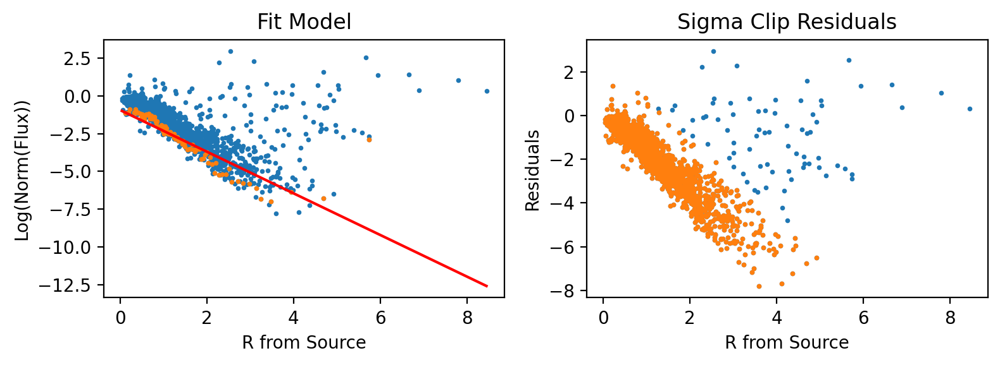

In [88]:
# sigma clip before fitting!
import operator
from scipy.optimize import curve_fit
from astropy.stats import sigma_clip

def select_min_group(xdata, ydata, n_bin=10):
    """Helper function that returns the lowest y-value points for each subgroup of size n within the data."""
    # sort the x and y values
    L = sorted(zip(xdata,ydata), key=operator.itemgetter(0))
    x_sort, y_sort = zip(*L)
    x_sort, y_sort = np.array(x_sort), np.array(y_sort)
    min_inds = np.zeros(len(xdata)//n_bin + 1).astype(int)

    # loop and grab the min in each group
    for k in np.arange(len(y_sort)//n_bin + 1) :
    # for k in [0,1] :
        sub_y = y_sort[(k*n_bin):(n_bin*(k+1))]
        min_inds[k] = np.argmin(sub_y)+k*n_bin

    return x_sort[min_inds], y_sort[min_inds]

def func_line(x, a, b):
    return a * x + b

# take the minimum 20% points
# xdata = np.log(dist_from_ss_mask])
xdata = r
ydata = z1
# min_x, min_y = select_min_group(xdata, ydata, 10)
min_x, min_y = select_nth_min_group(xdata, ydata, n_bin=20, k=1)

xmodel = np.linspace(min(xdata),max(xdata),100)
popt, pcov = curve_fit(func_line, min_x, min_y)


# plot to see how the model fit looks
fig, ax = plt.subplots(1,2, figsize=[8,3])
ax[0].scatter(xdata, ydata, s=3)
ax[0].scatter(min_x, min_y, s=3)
ax[0].plot(xmodel, func_line(xmodel, *popt), c='r')
ax[0].set_title('Fit Model')
ax[0].set_xlabel('R from Source')
ax[0].set_ylabel('Log(Norm(Flux))')
# plt.ylim([0,2])

# subtract model and sigma clip
# resids = ydata - func_line(xdata, *popt)
# filtered_data = sigma_clip(resids, sigma_upper=3, sigma_lower=5, maxiters=5)
clipped = iterative_sigma_clip(xdata, ydata, cenfunc=custom_fit, sigma_clip_kwargs={'sigma_upper':4, 'sigma_lower':5}, cenfunc_kwargs={'n_bin':20, 'k':1})
# ax[1].scatter(xdata, resids, s=3)
# ax[1].scatter(xdata, filtered_data, s=3, c='r')
ax[1].scatter(xdata, ydata, s=3)
ax[1].scatter(clipped[0], clipped[1], s=3)
ax[1].set_title('Sigma Clip Residuals')
ax[1].set_xlabel('R from Source')
ax[1].set_ylabel('Residuals')
fig.tight_layout()
plt.show()

# clip_mask = ~filtered_data.mask
# plt.scatter(xdata, ydata, s=3)
# plt.scatter(xdata[clip_mask], ydata[clip_mask], s=3)

In [89]:
# problem! We need to get back the theta clipped
# need to fix the iterative sigma clip function blarg
mask = clipped[2]
r_clip = r[mask]
phi_clip = phi[mask]
z_clip = z1[mask]
ze_clip = ze1[mask]

# print(len(r_clip), len(z_clip), len(phi_clip))

In [90]:
phi.shape

(1658,)

In [138]:
# set up design matrix
Th = np.asarray([phi_clip**0, np.sin(phi_clip), np.cos(phi_clip)]).T
# Rad = np.vstack([r_clip**idx for idx in range(3)]]).T
Rad = np.vstack([[r_clip**0], [r_clip**idx for idx in range(1,4,2)]]).T
X = np.hstack([Rad * l[:, None] for l in Th.T])
X.shape
Rad.shape

(1584, 3)

In [139]:
for i in range(1,4,2):
    print(i)

1
3


In [142]:
# make a model grid too
thetas = np.linspace(0,2.01*np.pi,100)
radii = np.linspace(0,10,100)
# tr,rr = np.meshgrid(thetas,radii)

Th_model = np.asarray([thetas**0, np.sin(thetas), np.cos(thetas)]).T
# Rad_model = np.vstack([radii**idx for idx in range(3)]).T
Rad_model = np.vstack([[radii**0], [radii**idx for idx in range(1,4,2)]]).T
X_model = np.hstack([Rad_model * l[:, None] for l in Th_model.T])
X_model.shape

(100, 9)

In [143]:
X.shape

(1584, 9)

In [144]:
# # define priors on the flux weights
# prior_mu = np.ones(A.shape[1])
# prior_sigma = (np.ones(A.shape[1]) * .02)

# regression with priors
sigma_w_inv = X.T.dot(X) 
# sigma_w_inv = X.T.dot(X).toarray()
# sigma_w_inv += np.diag(prior_mu / (prior_sigma ** 2))
B = X.T.dot(z_clip)
# B = X.T.dot(y/yerr**2) + prior_mu / (prior_sigma ** 2) 
w = np.linalg.solve(sigma_w_inv, B)
# werrs = np.linalg.inv(sigma_w_inv).diagonal() ** 0.5

print(w)



[ 1.42280158e-01 -1.72086065e+00 -8.85784252e-04  1.30947948e-01
 -9.66284931e-02  5.82876104e-03  1.30757945e-01 -4.92626211e-02
 -2.31411687e-02]


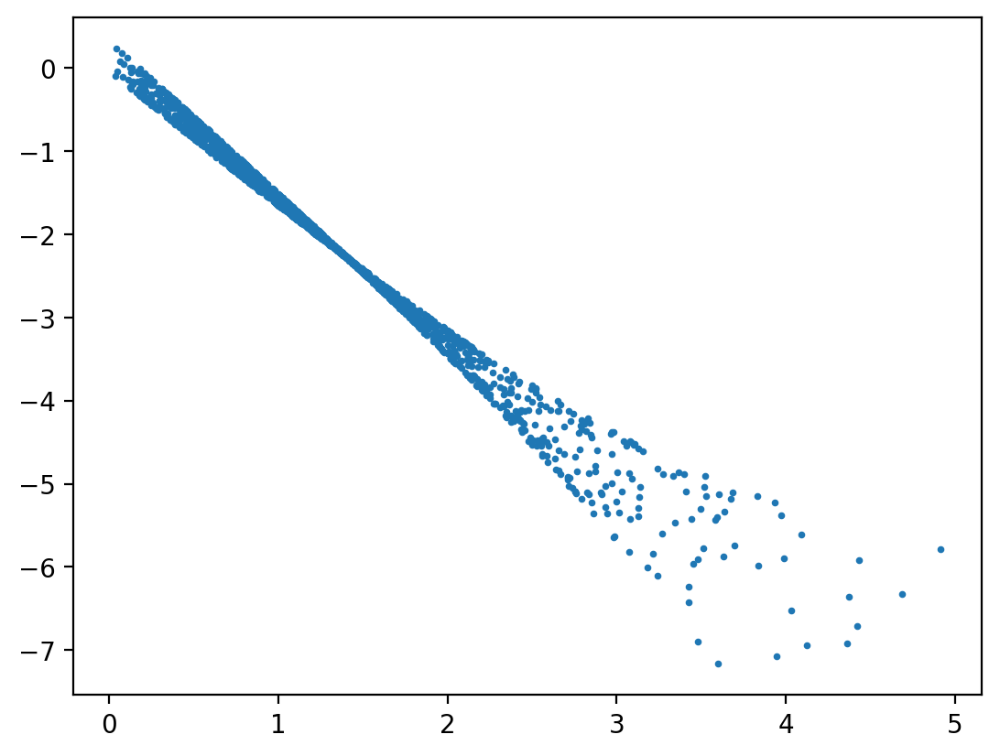

In [145]:
# model_image = s1.sum(axis=1).reshape(image_shape) / data
out_image = X.dot(w)

plt.scatter(r_clip, out_image, s=3)
# plt.scatter(r_clip, out_image, s=3)
plt.show()

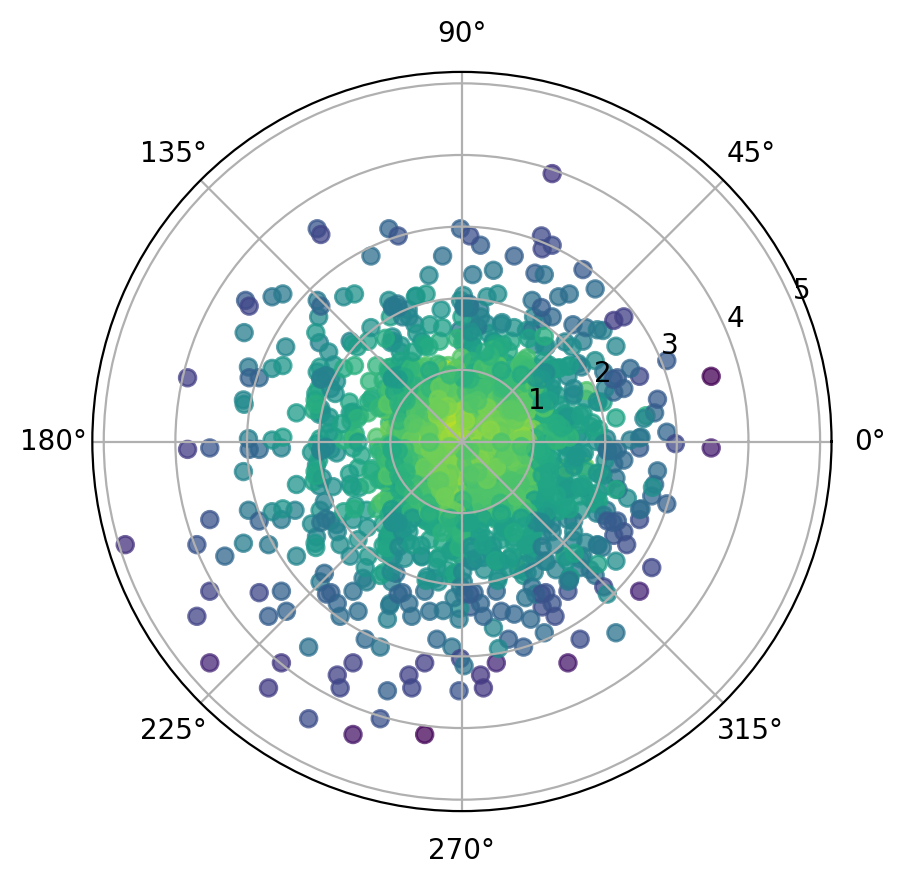

In [146]:
fig = plt.figure()
ax = fig.add_subplot(projection='polar')
c = ax.scatter(phi_clip, r_clip, c=z_clip, alpha=.75)


/var/folders/kk/_9cq7r5j5nd8cxryt5p59v2c0000gn/T/ipykernel_77511/3388377713.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(tr.reshape(model_shape),rr.reshape(model_shape),out_model.reshape(model_shape),edgecolors='face')#, vmin=-8, vmax=1)


<Figure size 640x480 with 0 Axes>

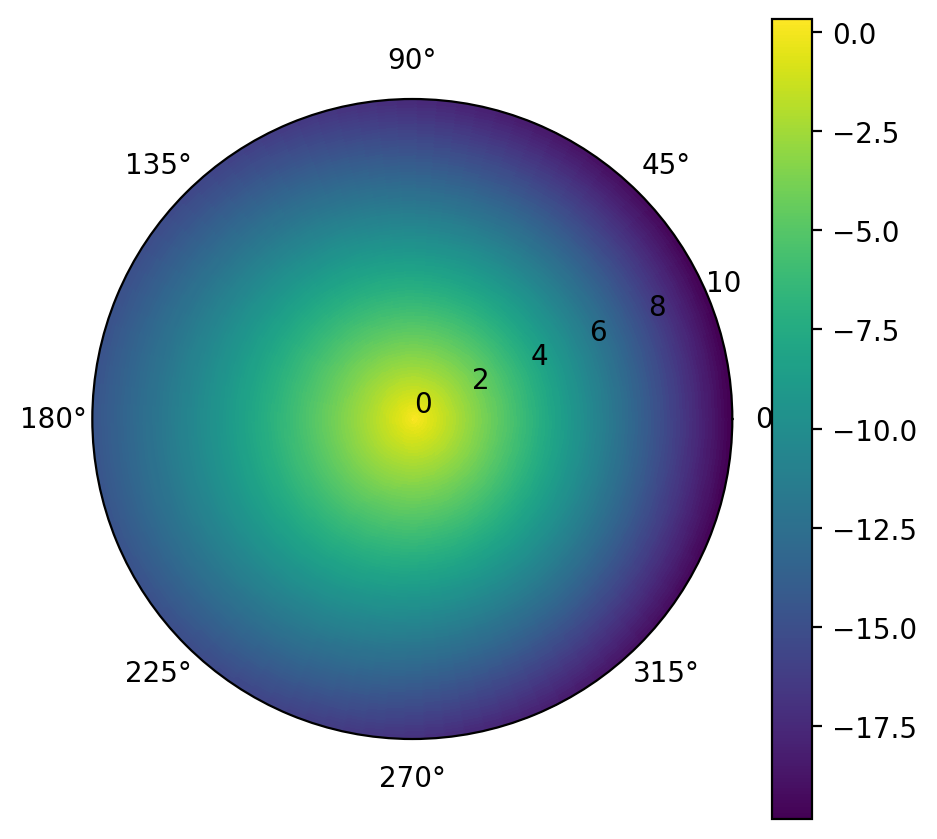

In [148]:
# make a model grid too
thetas = np.linspace(0,2.01*np.pi,100)
radii = np.linspace(0,10,100)
tr,rr = np.meshgrid(thetas,radii)
model_shape = tr.shape
tr = tr.ravel()
rr = rr.ravel()

Th_model = np.asarray([tr**0, np.sin(tr), np.cos(tr)]).T
Rad_model = np.vstack([rr**idx for idx in range(3)]).T
X_model = np.hstack([Rad_model * l[:, None] for l in Th_model.T])
X_model.shape

out_model = X_model.dot(w)

# plt.scatter()
out_model.shape
tr.shape

plt.clf()
fig = plt.figure(figsize=[5,5])
ax = fig.add_axes([0.1,0.1,0.8,0.8],polar=True)
pc = ax.pcolormesh(tr.reshape(model_shape),rr.reshape(model_shape),out_model.reshape(model_shape),edgecolors='face')#, vmin=-8, vmax=1)
ax.grid(False)
fig.colorbar(pc)
plt.show()


In [ ]:

plt.scatter((mc_X - C.ravel())[ss_mask][clip_mask], (mc_Y - R.ravel())[ss_mask][clip_mask], c=np.log(y_norm1)[ss_mask][clip_mask], s=3)
plt.xlim([-6,6])
plt.ylim([-6,6])
plt.colorbar()
plt.show()

In [ ]:
# for each pixel, calculate its distance from the position of its max contributor
r_dist = np.zeros_like(y_norm)
max_contributor_ind.shape

mc_X = df1.iloc[max_contributor_ind][x_col].to_numpy()
mc_Y = df1.iloc[max_contributor_ind][y_col].to_numpy()

# Distance of pixels from their max contributors
dist_from_mc = np.hypot(mc_X - C.ravel(), mc_Y - R.ravel())
angle_from_mc = np.arctan2(mc_Y - R.ravel(), mc_X - C.ravel())

# normalized flux from max contributor in each pixel
real_norm = data.ravel() / max_contributor_flux
# model_norm = np.asarray(s2_norm.sum(axis=1)).flatten()

# index of the source
# ind = 0
# x_col='X0'; y_col='Y0'
source_mask = np.ones(len(df1), bool)

# for each source, take the slice from s2, then normalize and convert to radial, then add up and apply single_source_mask

npixel_radii = 8
gR, gC = np.mgrid[-npixel_radii:npixel_radii+1, -npixel_radii:npixel_radii+1].astype(float)
dR = gR[None, :, :] - np.asarray(df1[x_col][source_mask] % 1)[:, None, None]
dC = gC[None, :, :] - np.asarray(df1[y_col][source_mask] % 1)[:, None, None]

    
rad, phi = np.hypot(dR, dC), np.arctan2(dC, dR)

In [147]:
xdata.shape

(1000,)

In [ ]:
plt.scatter(xdata,ydata)

temp1 = select_min_group(xdata,ydata, n_bin=10)
temp2 = select_nth_min_group(xdata, ydata, n_bin=10, k=1)
temp3 = iterative_sigma_clip(xdata, ydata, cenfunc=custom_fit, sigma_clip_kwargs={'sigma_upper':2, 'sigma_lower':3}, cenfunc_kwargs={'n_bin':10})
# plt.scatter(temp1[0], temp1[1], marker='x')
# plt.scatter(temp2[0], temp2[1], marker='x')
plt.scatter(temp3[0], temp3[1], marker='x')

In [ ]:
L = np.asarray([phi**0, np.sin(phi), np.cos(phi)]).T
R = np.vstack([r**idx for idx in range(4)]).T
X = np.hstack([R * l[:, None] for l in L.T])

In [ ]:
w = np.linalg.solve(X.T.dot(X/ye[:, None]**2), X.T.dot(y/ye**2))

(39800, 1314)

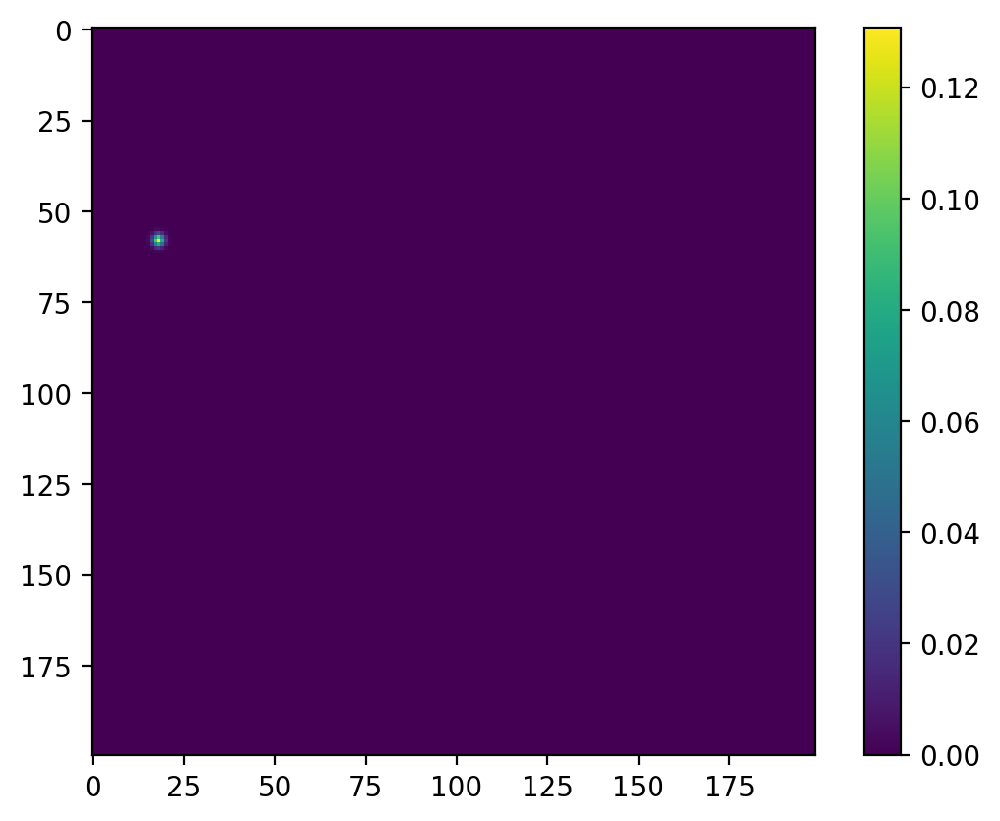

In [334]:
# s2_norm = s2
# plt.imshow(s2[:,1700].tocoo().toarray().reshape(image_shape))
# plt.colorbar()
s2_norm = s2 / np.asarray(df1.flux_fit1)[None,:]

plt.imshow(s2_norm[:,1100].reshape(image_shape))
plt.colorbar()

s2_norm.shape

In [511]:
# normalize single_source_mask
# plot the normalized flux as a function of radius from the center, check that it makes a smooth psf plot
# make sure to use the spase3Dmatrix when calculating separation

# index of the source
ind = 0
# x_col='X0'; y_col='Y0'
source_mask = np.ones(len(df1), bool)
# source_mask = flux_mask

# for each source, take the slice from s2, then normalize and convert to radial, then add up and apply single_source_mask

npixel_radii = 8
gR, gC = np.mgrid[-npixel_radii:npixel_radii+1, -npixel_radii:npixel_radii+1].astype(float)
dR = gR[None, :, :] - np.asarray(df1[x_col][source_mask] % 1)[:, None, None]
dC = gC[None, :, :] - np.asarray(df1[y_col][source_mask] % 1)[:, None, None]

    
rad, phi = np.hypot(dR, dC), np.arctan2(dC, dR)

p0 = SparseWarp3D(
        rad.transpose([1, 2, 0])**(2), # basically r^2
        gR[:, :, None] + np.asarray(np.floor(df1[x_col][source_mask] - R[0, 0])).astype(int),
        gC[:, :, None] + np.asarray(np.floor(df1[y_col][source_mask] - C[0, 0])).astype(int),
        image_shape,
    )#.sum(axis=1)

# plt.imshow(rad[0,:,:])
# plt.colorbar()
p0.shape

(39800, 1314)

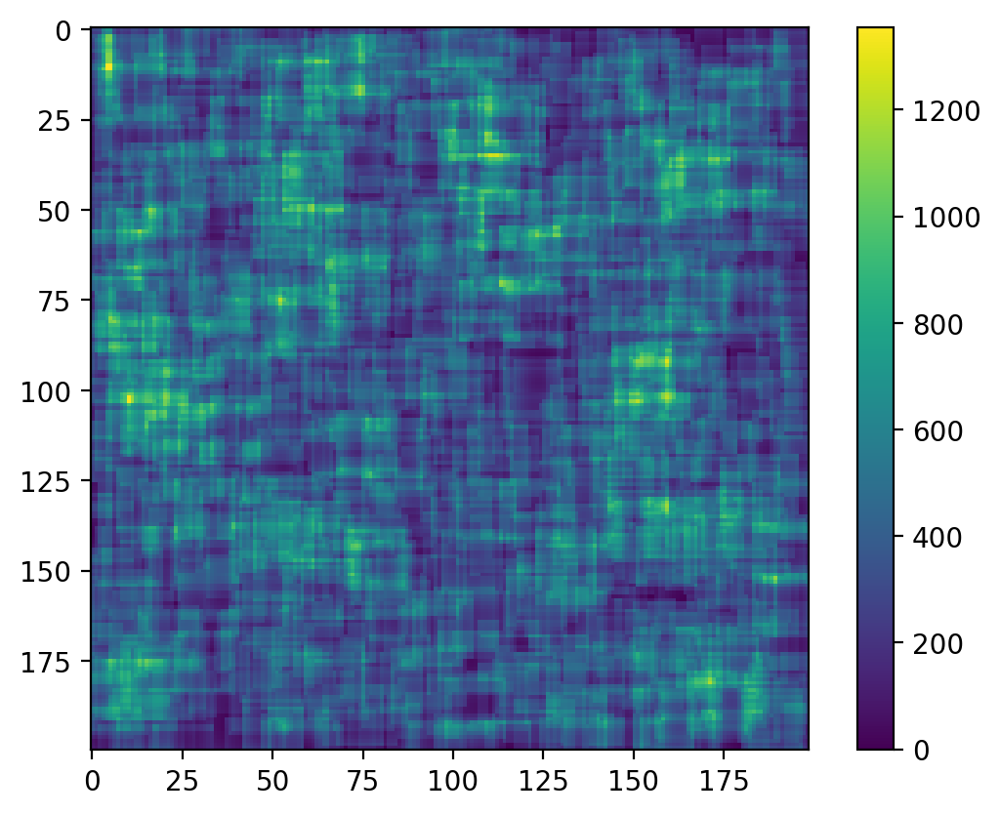

In [517]:
# temp = np.ma.masked_where(~ss_mask.reshape(image_shape), p0.sum(axis=1).reshape(image_shape))
# plt.imshow(temp)#, vmin=0, vmax=300)

plt.imshow(p0.sum(axis=1).reshape(image_shape))#, vmin=0, vmax=20)
plt.colorbar()

In [152]:
# for each pixel, calculate its distance from the position of its max contributor
r_dist = np.zeros_like(y_norm)
max_contributor_ind.shape

x_col = 'X0'; y_col = 'Y0'

mc_X = df1.iloc[max_contributor_ind][x_col].to_numpy()
mc_Y = df1.iloc[max_contributor_ind][y_col].to_numpy()

# Distance of pixels from their max contributors
dist_from_mc = np.hypot(mc_X - C.ravel(), mc_Y - R.ravel())
angle_from_mc = np.arctan2(mc_Y - R.ravel(), mc_X - C.ravel())

# rename
r = dist_from_mc
phi = angle_from_mc


# # normalized flux from max contributor in each pixel
# real_norm = data.ravel() / max_contributor_flux
# model_norm = np.asarray(s2_norm.sum(axis=1)).flatten()

# p0.shape

In [157]:
len(y)

39800

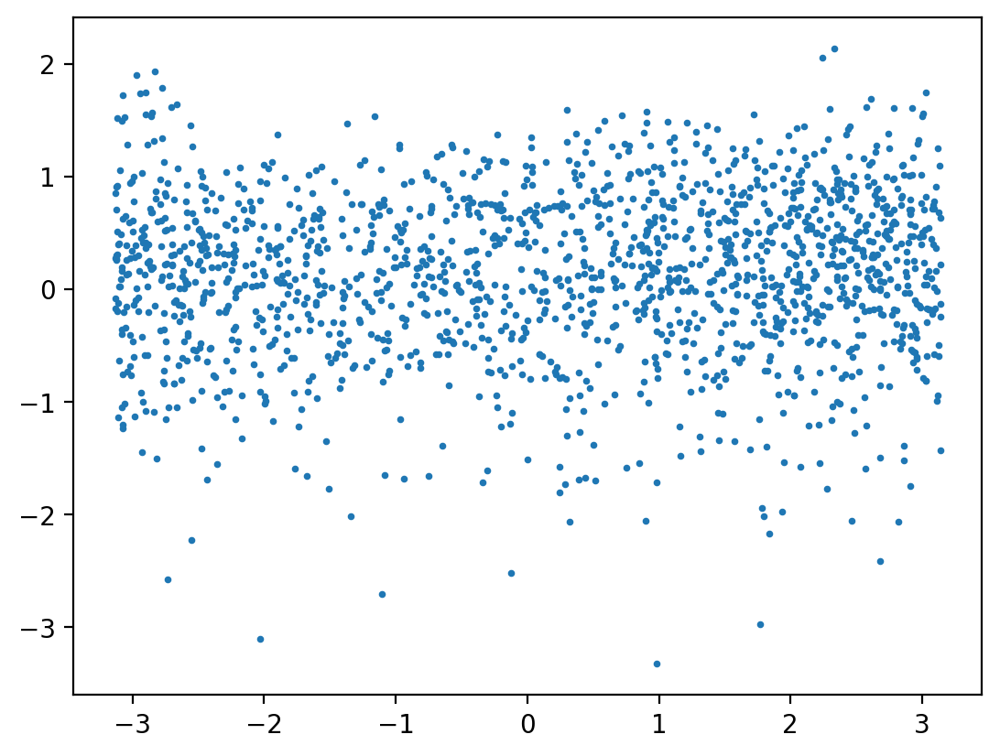

In [156]:
plt.scatter(phi[ss_mask], np.log(r[ss_mask]), s=3)

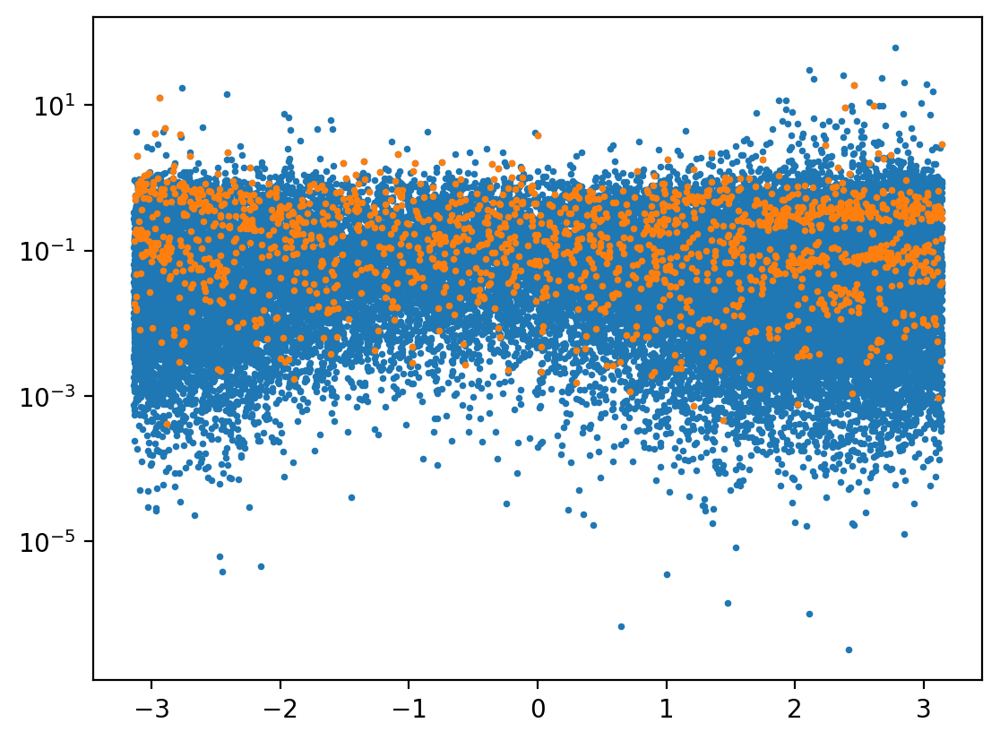

In [686]:
plt.scatter(angle_from_mc, real_norm, s=3)
plt.scatter(angle_from_mc[ss_mask], real_norm[ss_mask], s=3)
plt.yscale('log')

In [689]:
print(angle_from_mc.shape,dist_from_mc.shape,real_norm.shape)

(39800,) (39800,) (39800,)


In [716]:
(df.phot_rp_mean_flux / flux_coeff).shape
real_norm.shape
max_contributor_flux.shape

# for each pixel, identify the source that is the max contributor and grab its flux
max_contributor_ind = np.asarray(s2.argmax(axis=1))[:,0]
max_contributor_flux1 = ((df1.iloc[max_contributor_ind].phot_rp_mean_flux)/flux_coeff).to_numpy()

# normalize data by the flux of the max contributor to that pixel
y_norm1 = y / max_contributor_flux1

y_norm1.shape


# # normalized flux from max contributor in each pixel
# real_norm = data.ravel() / max_contributor_flux

(39800,)

/var/folders/kk/_9cq7r5j5nd8cxryt5p59v2c0000gn/T/ipykernel_1323/4291891714.py:3: RuntimeWarning: invalid value encountered in log
  plt.scatter((mc_X - C.ravel())[ss_mask][clip_mask], (mc_Y - R.ravel())[ss_mask][clip_mask], c=np.log(y_norm1)[ss_mask][clip_mask], s=3)


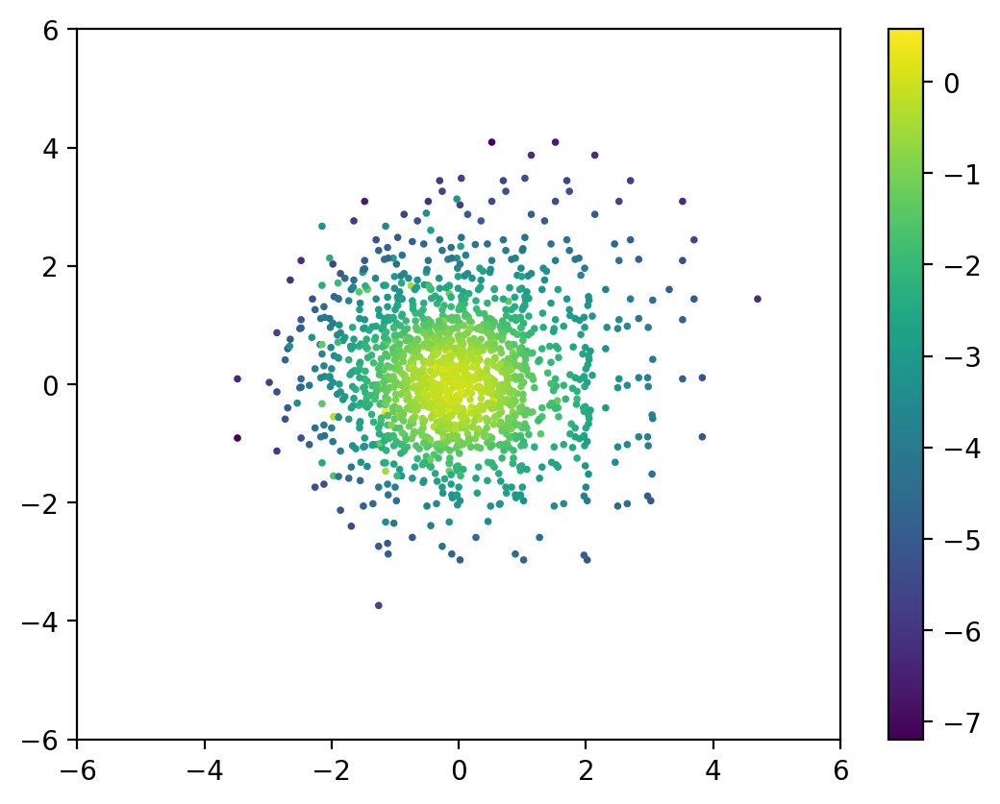

In [717]:
# df.phot_rp_mean_flux / flux_coeff


# normalize data by the flux of the max contributor to that pixel
max_contributor_flux1 = ((df1.iloc[max_contributor_ind].phot_rp_mean_flux)/flux_coeff).to_numpy()
y_norm1 = y / max_contributor_flux1

plt.scatter((mc_X - C.ravel())[ss_mask][clip_mask], (mc_Y - R.ravel())[ss_mask][clip_mask], c=np.log(y_norm1)[ss_mask][clip_mask], s=3)
plt.xlim([-6,6])
plt.ylim([-6,6])
plt.colorbar()
plt.show()

/var/folders/kk/_9cq7r5j5nd8cxryt5p59v2c0000gn/T/ipykernel_1323/3447298857.py:1: RuntimeWarning: invalid value encountered in log
  plt.scatter((mc_X - C.ravel())[ss_mask][clip_mask], (mc_Y - R.ravel())[ss_mask][clip_mask], c=np.log(real_norm)[ss_mask][clip_mask], s=3)


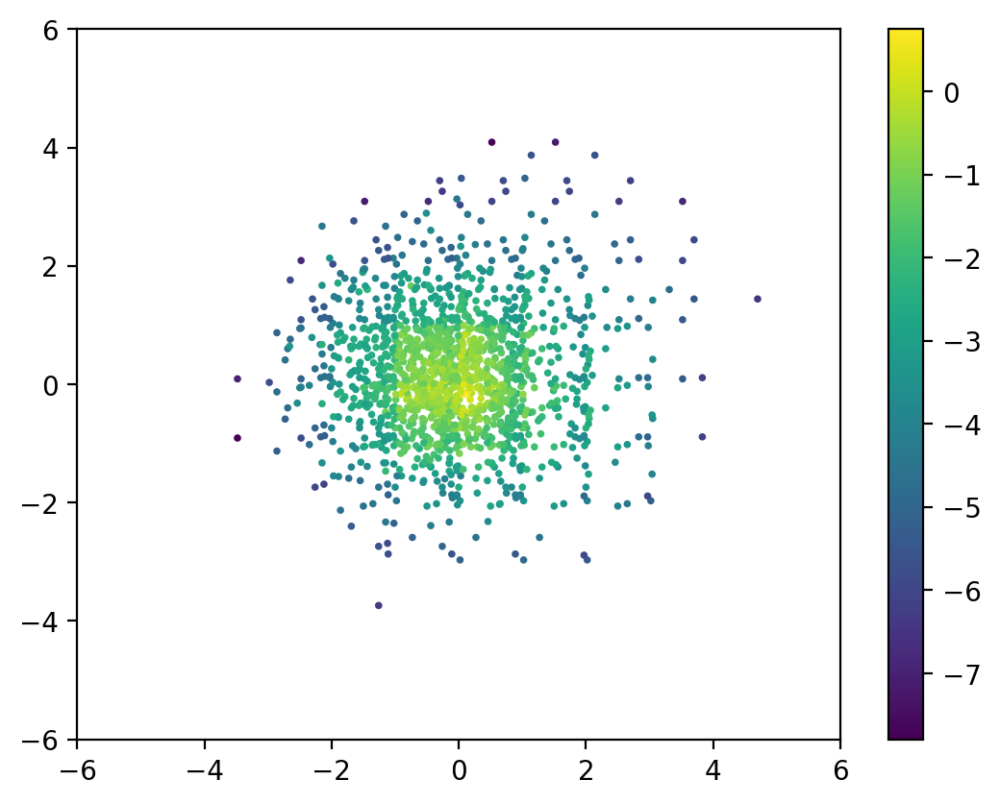

In [710]:
plt.scatter((mc_X - C.ravel())[ss_mask][clip_mask], (mc_Y - R.ravel())[ss_mask][clip_mask], c=np.log(real_norm)[ss_mask][clip_mask], s=3)
plt.xlim([-6,6])
plt.ylim([-6,6])
plt.colorbar()
plt.show()


In [693]:
def make_r_theta_vals():
    thetas_radians = np.arange(0,2.01*np.pi,np.pi/100.)
    radii = np.arange(0,101,1)
    #meshgrid these to make a fuller array
    tr,rr = np.meshgrid(thetas_radians,radii)
    #generate fake z values
    z_vals = (75. * rr**(1./2.2)\
        + 50.*np.random.normal()*np.sin(tr) \
        + 20. * np.cos(tr) * np.sqrt(rr) \
        + np.cos(rr * np.pi / 100.) * np.sin(rr * np.pi/50.) * 6.)\
        * (np.sin(rr * np.pi/ 100.)**3. + 0.85)
    return thetas_radians, radii, z_vals

thetas, radii, z = make_r_theta_vals()
print(z.shape)

(101, 201)


In [338]:
print(len(real_norm), len(model_norm), len(dist_from_mc))
np.asarray(s2_norm.sum(axis=1)).flatten().shape

39800 39800 39800


(39800,)

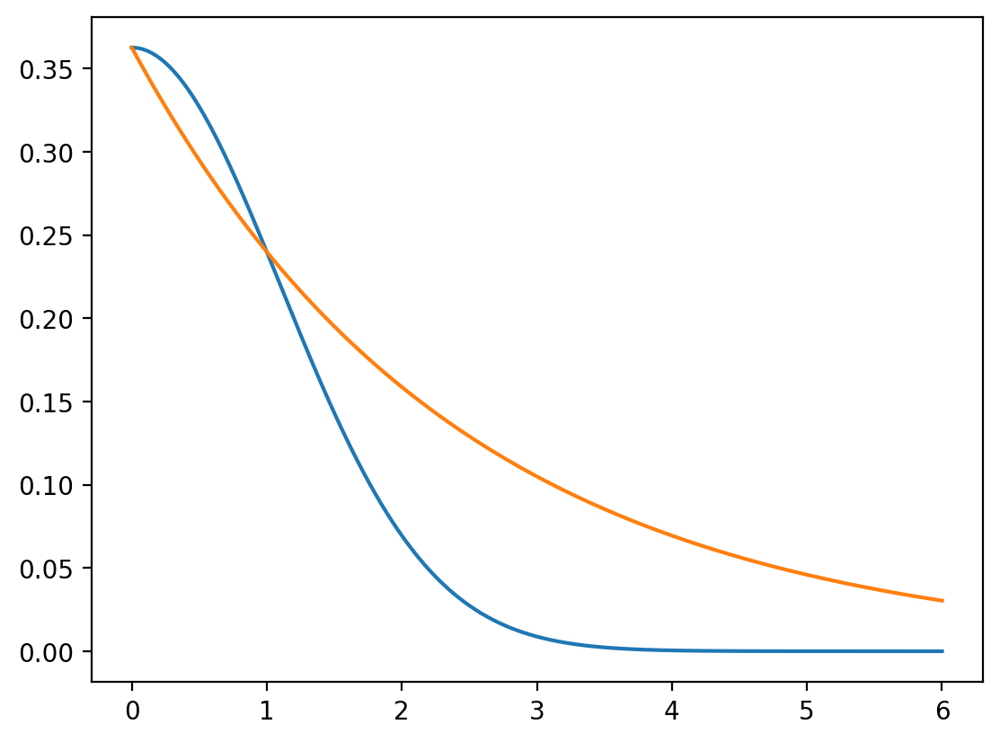

In [662]:
def gaussian(x, mu, sig):
    return (
        1.0 / (np.sqrt(2.0 * np.pi) * sig) * np.exp(-np.power((x - mu) / sig, 2.0) / 2)
    )

def gaussian_but_not_really(x, mu, sig):
    return (
        1.0 / (np.sqrt(2.0 * np.pi) * sig) * np.exp(-np.power((x - mu), 1.0) / (2 * (sig**2)))
    ) 
window_x = np.linspace(0, 6, len(window))
window = gaussian(window_x, 0, std)
window1 = gaussian_but_not_really(window_x, 0, std)

plt.plot(window_x, window)
plt.plot(window_x, window1)


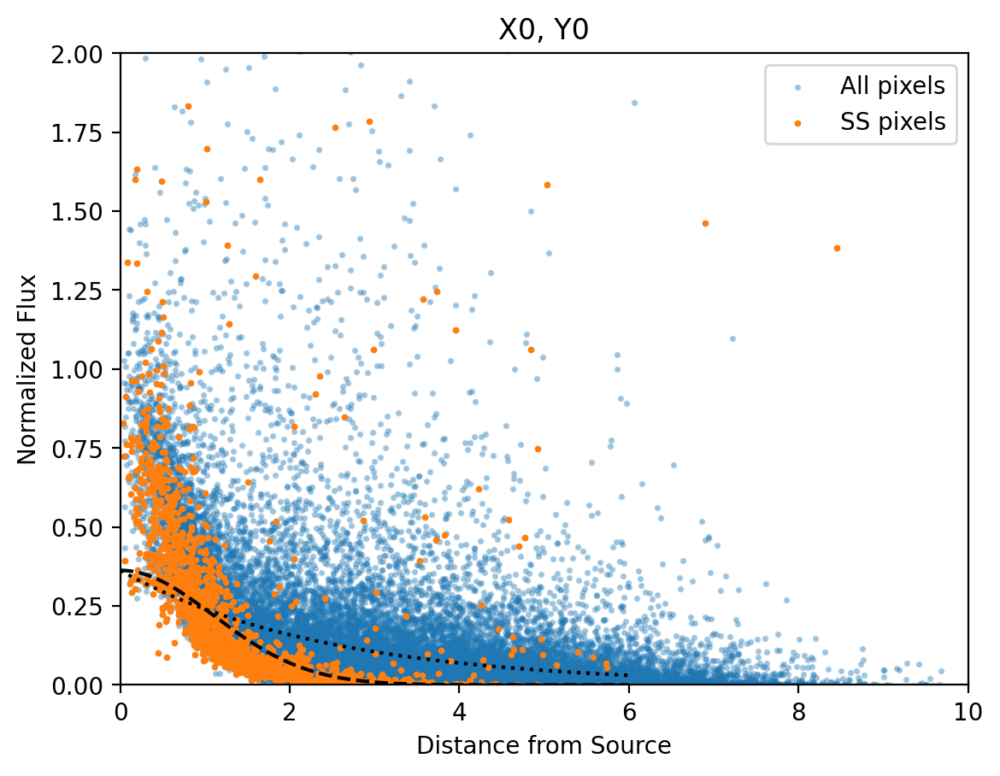

In [663]:
plt.scatter(dist_from_mc, real_norm, s=3, alpha=.3, label='All pixels')
plt.scatter(dist_from_mc[ss_mask], real_norm[ss_mask], s=3, label='SS pixels')#, alpha=.5)
plt.ylim([0,2])

# plt.scatter(dist_from_mc, model_norm, s=3, alpha=.1)
# plt.scatter(dist_from_mc[ss_mask], model_norm[ss_mask], s=3, alpha=.5)

plt.plot(window_x, window, linestyle='--', c='black')
plt.plot(window_x, window1, linestyle='dotted', c='black')
plt.xlim([0,10])
plt.xlabel('Distance from Source')
plt.ylabel('Normalized Flux')
plt.title(str(x_col) + ', ' + str(y_col))
plt.legend()
plt.show()


Notes 2/15
- outlier cutting will be important
- Fitting in logspace

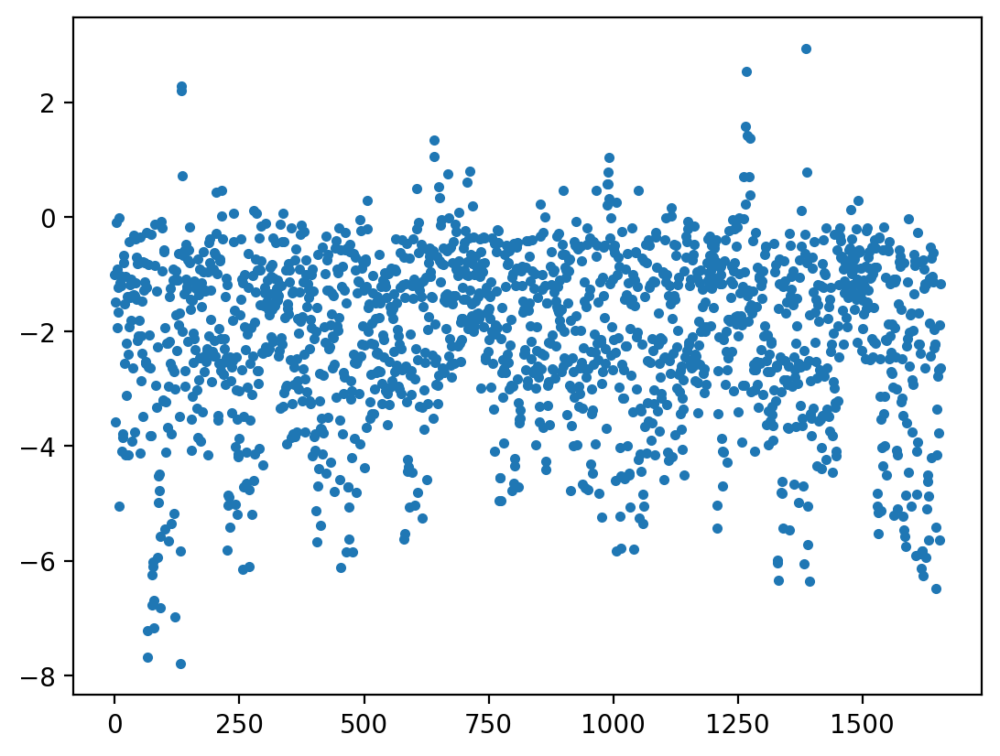

In [407]:
# dist_from_mc.shape
plt.plot(np.log(real_norm[ss_mask]), linestyle='', marker='.')

In [410]:
# plt.imshow(s1.tocoo().toarray()[:,2].reshape(image_shape))
# plt.imshow(dist_from_mc.reshape(image_shape))
# plt.colorbar()

In [414]:
dist_from_mc
yerr.shape
np.log((y/max_contributor_flux)[ss_mask])

array([-1.00629197, -3.57398219, -1.47861661, ..., -1.89330165,
       -1.16968354, -2.63492177])

In [ ]:
# Question: how to do the errors for this? When you move to log space?

In [423]:
sparse.vstack([sparse.csr_matrix(dist_from_mc[ss_mask]**2), np.ones_like(real_norm[ss_mask])], 'csr').shape
# yarr.shape

(2, 1658)

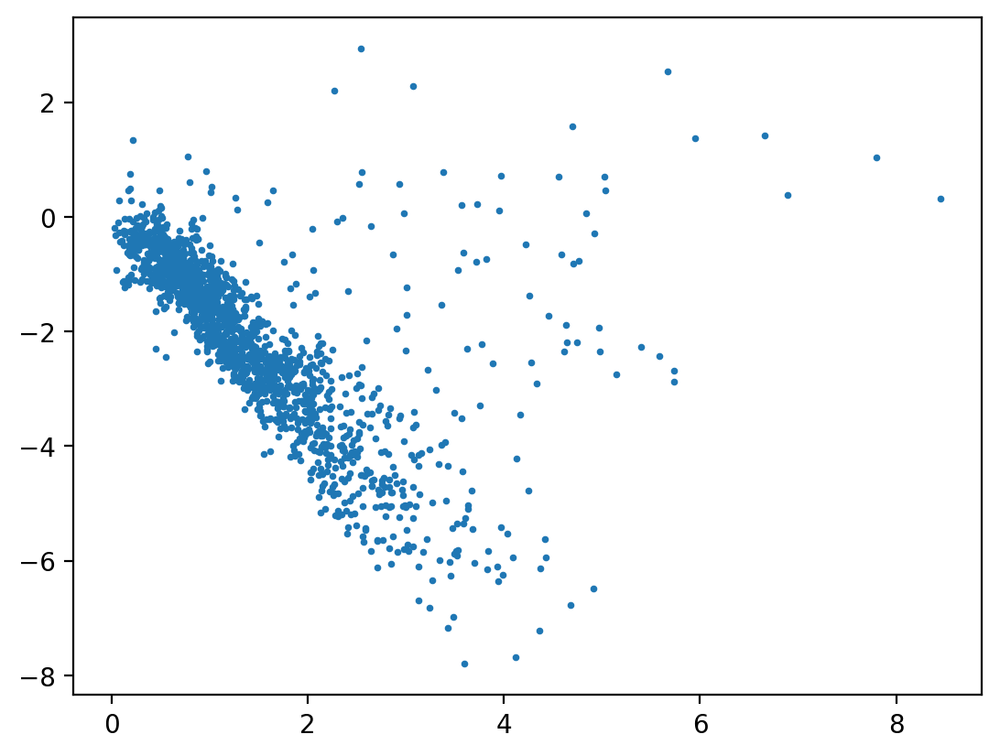

In [524]:
plt.scatter(dist_from_mc[ss_mask], np.log(real_norm[ss_mask]), s=3)
# plt.ylim([0,2])

In [476]:
# # from above
# print(A.shape, type(A))
# print(B.shape, type(B))
# print(sigma_w_inv.shape, type(sigma_w_inv))
# print(w.shape, type(w))
# print(y.shape, type(y))


(39800, 1701) <class 'scipy.sparse._csr.csr_matrix'>
(1701,) <class 'numpy.ndarray'>
(1701, 1701) <class 'numpy.matrix'>
(1701,) <class 'numpy.ndarray'>
(39800,) <class 'numpy.ndarray'>


In [479]:
print(A.shape, type(A))
print(B.shape, type(B))
print(sigma_w_inv.shape, type(sigma_w_inv))
print(w.shape, type(w))
print(yarr.shape, type(yarr))

(1658, 2) <class 'scipy.sparse._csr.csr_matrix'>
(2,) <class 'numpy.ndarray'>
(2, 2) <class 'scipy.sparse._csc.csc_matrix'>
(1701,) <class 'numpy.ndarray'>
(1658,) <class 'numpy.ndarray'>


In [583]:
print(A.shape, type(A))
print(B.shape, type(B))
print(sigma_w_inv.shape, type(sigma_w_inv))
print(w.shape, type(w))
print(yarr.shape, type(yarr))

(2, 1658) <class 'numpy.ndarray'>
(2,) <class 'numpy.ndarray'>
(1658, 1658) <class 'numpy.ndarray'>
(2,) <class 'numpy.ndarray'>
(1658,) <class 'numpy.ndarray'>


In [482]:
# # s1.T.dot(y)
# temp = get_polar_psfs_new(df, x_col='X0', y_col='Y0')[ss_mask,:]
# # temp.shape
# sigma_w_inv = A.T.dot(A)
# sigma_w_inv.shape
# B = A.T.dot(yarr)
# B.shape
np.linalg.solve(sigma_w_inv.toarray(), B)

array([-9.77587206e-04, -2.09051462e+00])

In [447]:
# s1.shape
# A.T.dot(yarr)
# yarr.shape
# A.dot(yarr)
type(s1)
# type(A)

__main__.SparseWarp3D

$$ f(x) = a_i e^{-\frac{(x - b_i)^2}{2c_i^2}} $$
$$ \log(f(x)) = \log\left(a_i e^{-\frac{(x - b_i)^2}{2c_i^2}}\right) = \log a_i + -\frac{(x - b_i)^2}{2c_i^2}$$

In [489]:
def get_polar_psfs_new(df, x_col='X0', y_col='Y0', source_mask=None, npixel_radii=8):
    if source_mask is None:
        source_mask = np.ones(len(df), bool)
    gR, gC = np.mgrid[-npixel_radii:npixel_radii+1, -npixel_radii:npixel_radii+1].astype(float)
    dR = gR[None, :, :] - np.asarray(df[x_col][source_mask] % 1)[:, None, None]
    dC = gC[None, :, :] - np.asarray(df[y_col][source_mask] % 1)[:, None, None]
    
    rad, phi = np.hypot(dR, dC), np.arctan2(dC, dR)
    s0 = SparseWarp3D(
            rad.transpose([1, 2, 0])**(2),
            gR[:, :, None] + np.asarray(np.floor(df[x_col][source_mask] - R[0, 0])).astype(int),
            gC[:, :, None] + np.asarray(np.floor(df[y_col][source_mask] - C[0, 0])).astype(int),
            image_shape,
        ).sum(axis=1)
    return sparse.csr_matrix(np.asarray([s0, np.ones_like(s0)])[:, :, 0].T)



In [558]:
np.arange(0,20,1)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

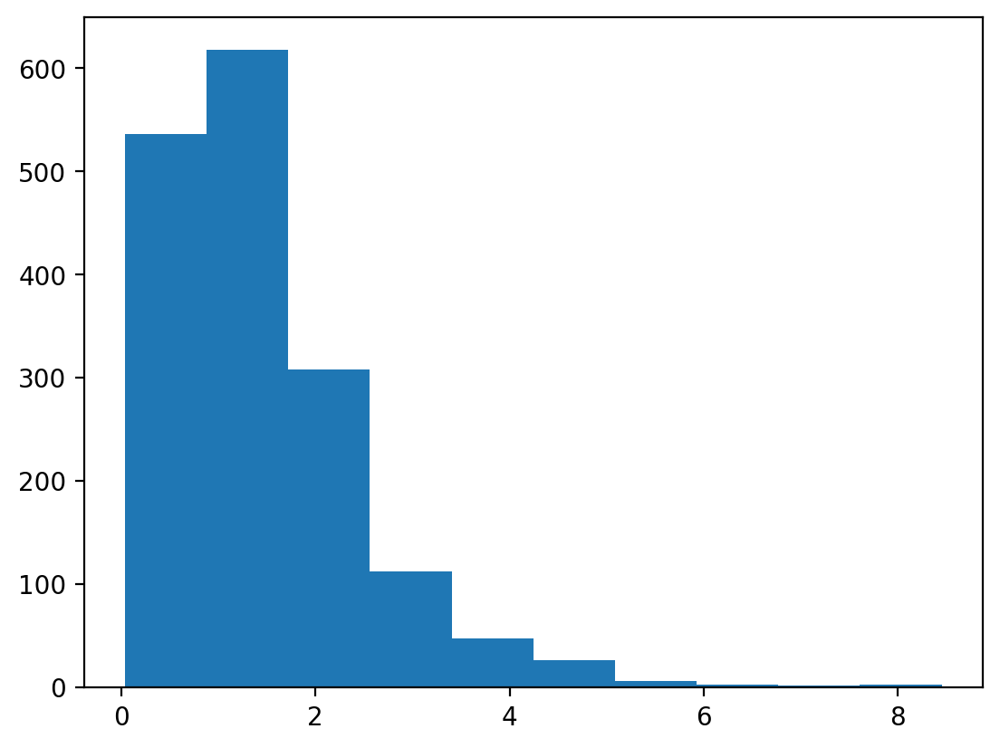

In [561]:
# what we need to do is instead of summing the s0 in get_polar_psfs_new, we need to select the value from the designated slice that is the sole contributor in that pixel
plt.hist(dist_from_mc[ss_mask])#, bins=np.arange(0,20,1))
plt.show()
# plt.colorbar()

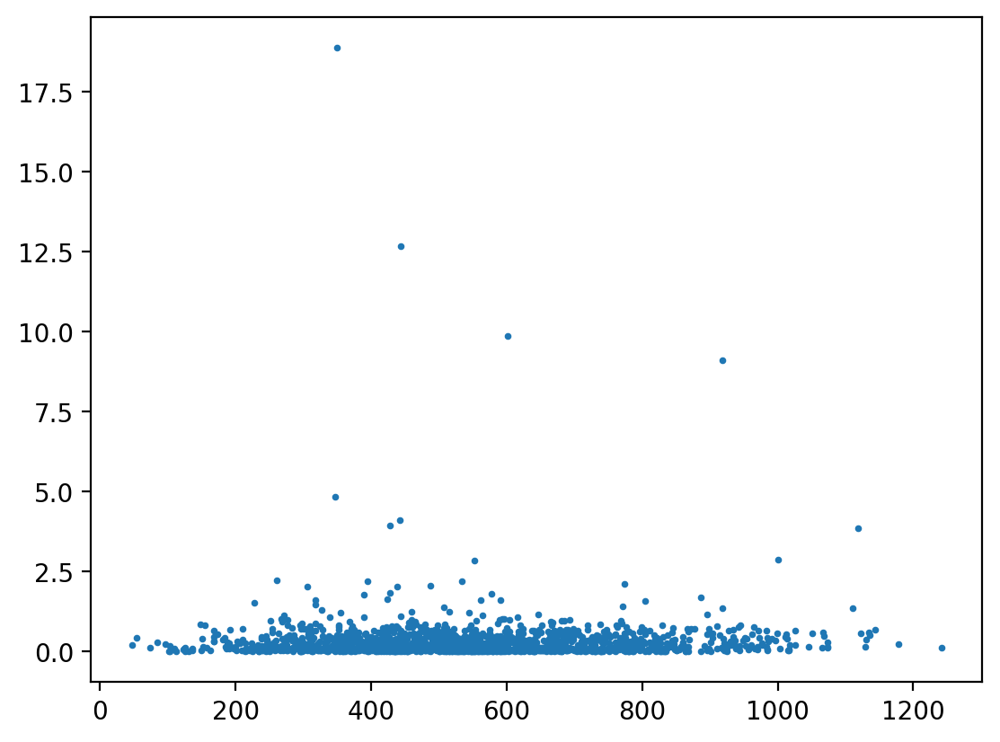

In [540]:
rad, phi = np.hypot(dR, dC), np.arctan2(dC, dR)
# plt.imshow(rad[0,:,:])
# plt.colorbar()
# get_polar_psfs_new(df, x_col='X0', y_col='Y0')[ss_mask,:].shape
A.shape
# plt.scatter(A[:,0].toarray().flatten(), real_norm[ss_mask], s=3)
plt.scatter(A[:,0].toarray().flatten(), real_norm[ss_mask], s=3)


In [585]:
A = np.vstack([dist_from_mc[ss_mask]**2, np.ones_like(real_norm[ss_mask])]).T
sigma_w_inv = A.T.dot(A) # not a sparse matrix
B = A.T.dot(yarr)
B.shape
w = np.linalg.solve(sigma_w_inv, B)
# print(sigma_w_inv.shape, B.shape)
w


array([-0.10670575, -1.75881832])

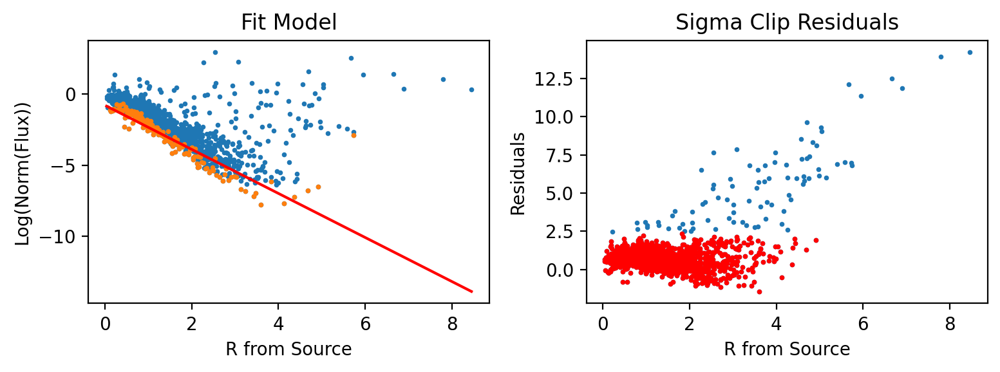

In [645]:
# sigma clip before fitting!
import operator
from scipy.optimize import curve_fit
from astropy.stats import sigma_clip

def select_min_group(xdata, ydata, n_bin=10):
    """Helper function that returns the lowest y-value points for each subgroup of size n within the data."""
    # sort the x and y values
    L = sorted(zip(xdata,ydata), key=operator.itemgetter(0))
    x_sort, y_sort = zip(*L)
    x_sort, y_sort = np.array(x_sort), np.array(y_sort)
    min_inds = np.zeros(len(xdata)//n_bin + 1).astype(int)

    # loop and grab the min in each group
    for k in np.arange(len(y_sort)//n_bin + 1) :
    # for k in [0,1] :
        sub_y = y_sort[(k*n_bin):(n_bin*(k+1))]
        min_inds[k] = np.argmin(sub_y)+k*n_bin

    return x_sort[min_inds], y_sort[min_inds]

def func_line(x, a, b):
    return a * x + b

# take the minimum 20% points
# xdata = np.log(dist_from_ss_mask])
xdata = (dist_from_mc[ss_mask])
ydata = np.log(real_norm[ss_mask])
min_x, min_y = select_min_group(xdata, ydata, 10)

xmodel = np.linspace(min(xdata),max(xdata),100)
popt, pcov = curve_fit(func_line, min_x, min_y)


    
    # ax[0].plot(stds,rmse)
    # ax[0].set_title('RMSE')
    # ax[0].axvline(std, c='r', linestyle='--')
    # ax[0].set_xlabel('STD')

    # ax[1].plot(stds,flux_coeffs)
    # ax[1].set_title('Flux coefficient')
    # ax[1].axvline(std, c='r', linestyle='--')
    # ax[1].set_xlabel('STD')
    # fig.tight_layout()
# plot to see how the model fit looks
fig, ax = plt.subplots(1,2, figsize=[8,3])
ax[0].scatter(xdata, ydata, s=3)
ax[0].scatter(min_x, min_y, s=3)
ax[0].plot(xmodel, func_line(xmodel, *popt), c='r')
ax[0].set_title('Fit Model')
ax[0].set_xlabel('R from Source')
ax[0].set_ylabel('Log(Norm(Flux))')
# plt.ylim([0,2])

# subtract model and sigma clip
resids = ydata - func_line(xdata, *popt)
filtered_data = sigma_clip(resids, sigma_upper=3, sigma_lower=5, maxiters=5)
ax[1].scatter(xdata, resids, s=3)
ax[1].scatter(xdata, filtered_data, s=3, c='r')
ax[1].set_title('Sigma Clip Residuals')
ax[1].set_xlabel('R from Source')
ax[1].set_ylabel('Residuals')
fig.tight_layout()
# plt.show()


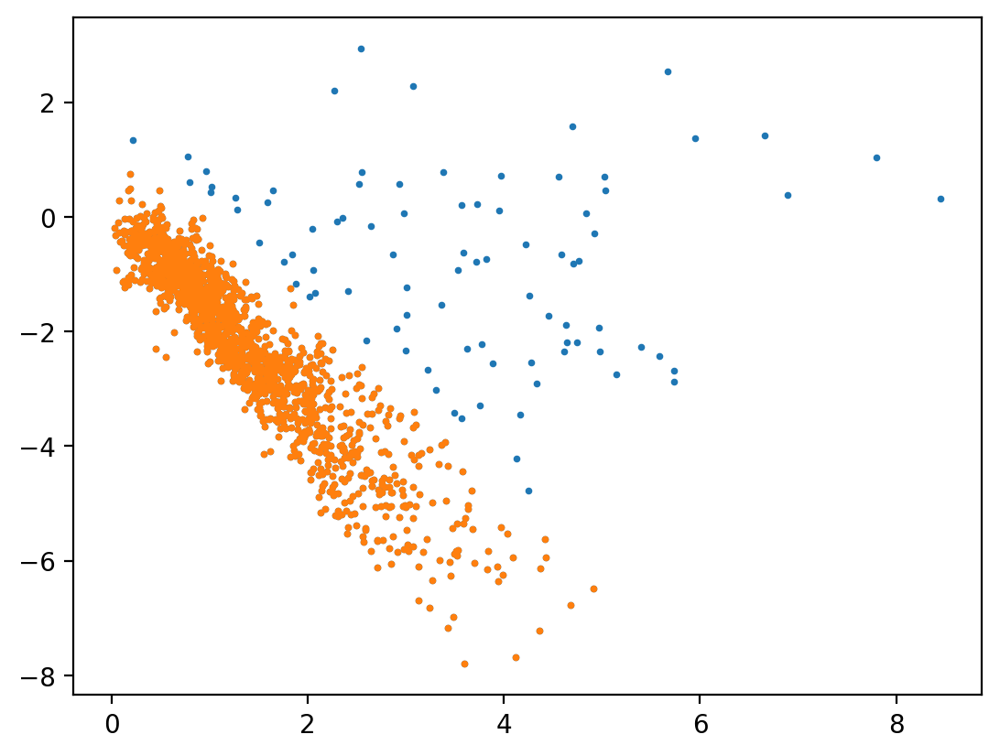

In [647]:
clip_mask = ~filtered_data.mask
plt.scatter(xdata, ydata, s=3)
plt.scatter(xdata[clip_mask], ydata[clip_mask], s=3)

In [720]:
len(filtered_data)
len(xdata)

1658

In [648]:
# time to set up the design matrix and do algebra

# s1 = get_gaussian_scene(df, source_flux=np.asarray(df.phot_rp_mean_flux) / flux_coeff, std=std)
# ds_x1, ds_y1 = get_gaussian_gradients(df, source_flux=np.asarray(df.phot_rp_mean_flux) / flux_coeff, std=std)

real_norm = data.ravel() / max_contributor_flux
# yarr = np.log(real_norm[ss_mask])
# yarr_err = np.log((y/max_contributor_flux)[ss_mask])

xdata1 = (dist_from_mc[ss_mask])[clip_mask]
ydata1 = np.log(real_norm[ss_mask])[clip_mask]

# stack themem together
# A = sparse.vstack([sparse.csr_matrix(dist_from_mc[ss_mask]**2), np.ones_like(real_norm[ss_mask])], 'csr')
# A = get_polar_psfs_new(df, x_col='X0', y_col='Y0')[ss_mask,:] 
# A = np.vstack([dist_from_mc[ss_mask]**1, np.ones_like(real_norm[ss_mask])]).T # not a sparse matrix
A = np.vstack([xdata1**1, np.ones_like(xdata1)]).T # not a sparse matrix

# # define priors on the flux weights
# prior_mu = np.ones(A.shape[1])
# prior_sigma = (np.ones(A.shape[1]) * .02)

# regression with priors
sigma_w_inv = A.T.dot(A) 
# sigma_w_inv = A.T.dot(A).toarray()
# sigma_w_inv += np.diag(prior_mu / (prior_sigma ** 2))
B = A.T.dot(ydata1)
# B = A.T.dot(y/yerr**2) + prior_mu / (prior_sigma ** 2) 
w = np.linalg.solve(sigma_w_inv, B)
# werrs = np.linalg.inv(sigma_w_inv).diagonal() ** 0.5

print(w)

# model_image = s1.sum(axis=1).reshape(image_shape) / data
# out_image = A.dot(w).reshape(image_shape)


[-1.66805076  0.06525565]


In [654]:
dist_from_mc[ss_mask].shape
xdata1.shape

(1571,)

0.5474952686264855
-0.42391202735376915
1.0674318775299039


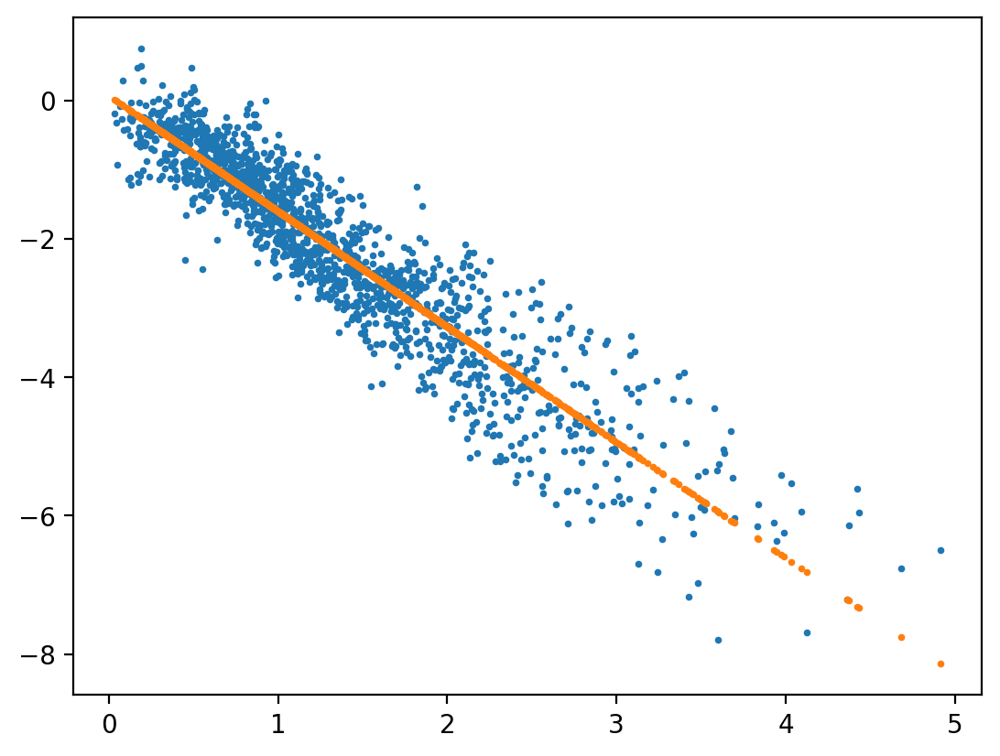

In [653]:
output = A.dot(w)

print(1/np.sqrt(-2*w[0]))
print(1/(np.sqrt(2)*w[0]))
print(np.exp(w[1]))

# plt.scatter(dist_from_mc[ss_mask], yarr, s=3)#, alpha=.5)
# plt.scatter(dist_from_mc[ss_mask], output, s=3)#, alpha=.5)
plt.scatter(xdata1, ydata1, s=3)#, alpha=.5)
plt.scatter(xdata1, output, s=3)#, alpha=.5)


In [667]:
print(w[0], np.e**w[1])
print(1/np.sqrt(-2*w[0]))
print(1/(np.sqrt(2)*w[0]))


-1.6680507642130251 1.0674318775299039
0.5474952686264855
-0.42391202735376915


0.5474952686264855
-0.42391202735376915


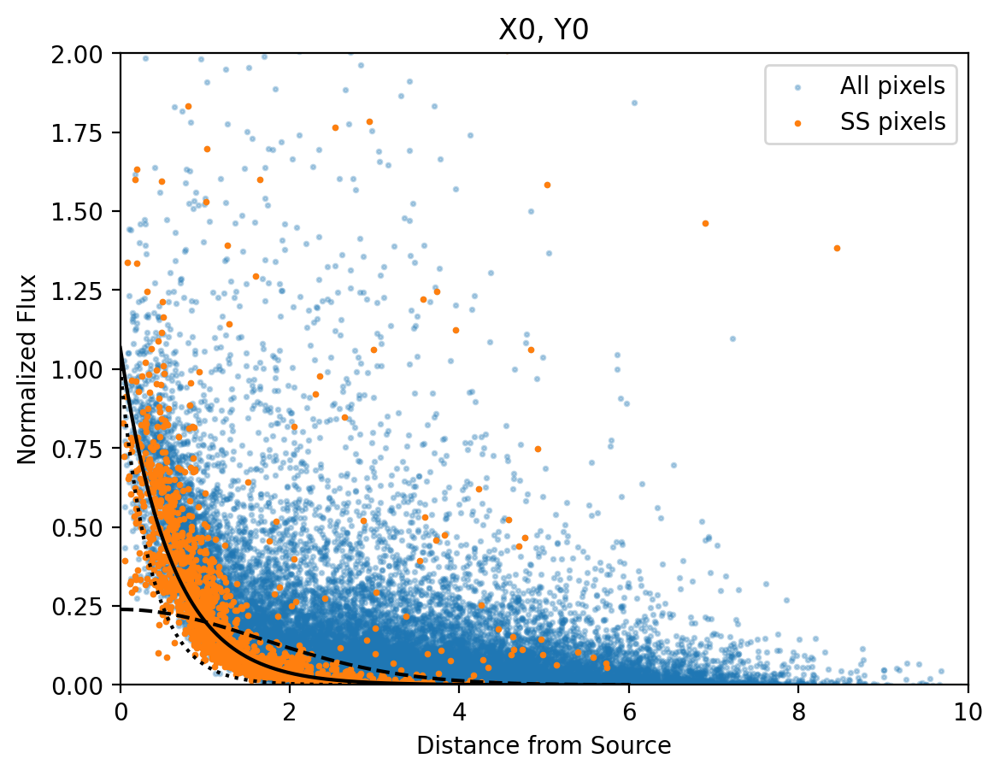

In [678]:
print(1/np.sqrt(-2*w[0]))
print(1/(np.sqrt(2)*w[0]))

window_x = np.linspace(0, 6, len(window))
window = gaussian(window_x, 0, -w[0])
window1 = gaussian_but_not_really(window_x, 0, -1/(np.sqrt(2)*w[0])) * (np.e ** w[1])
window2 = (np.e**w[1]) * np.exp(window_x * w[0])


plt.scatter(dist_from_mc, real_norm, s=3, alpha=.3, label='All pixels')
plt.scatter(dist_from_mc[ss_mask], real_norm[ss_mask], s=3, label='SS pixels')#, alpha=.5)
plt.ylim([0,2])

# plt.scatter(dist_from_mc, model_norm, s=3, alpha=.1)
# plt.scatter(dist_from_mc[ss_mask], model_norm[ss_mask], s=3, alpha=.5)

plt.plot(window_x, window, linestyle='--', c='black')
plt.plot(window_x, window1, linestyle='dotted', c='black')
plt.plot(window_x, window2, linestyle='solid', c='black')
plt.xlim([0,10])
plt.xlabel('Distance from Source')
plt.ylabel('Normalized Flux')
plt.title(str(x_col) + ', ' + str(y_col))
plt.legend()
plt.show()


In [679]:
angle_from_mc

NameError: name 'angle_from_mc' is not defined

36.31161274235978
0.10064204329188084


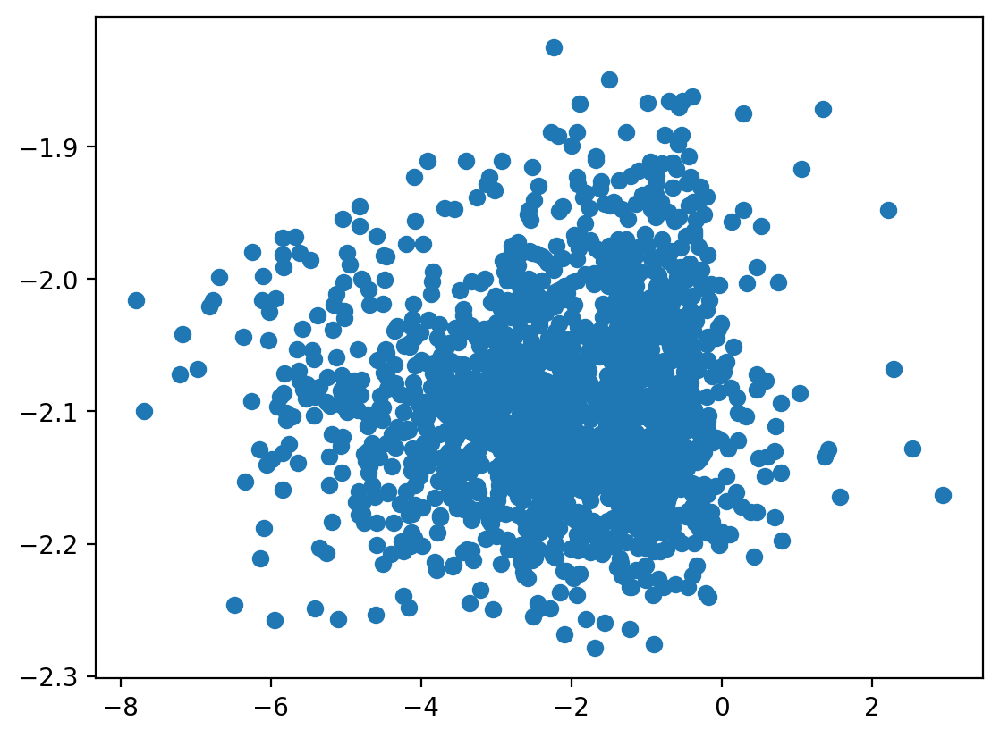

In [493]:


plt.scatter(yarr, output)

In [356]:
popt

array([0.98191429, 2.35422767, 0.18090058])

In [640]:
filtered_data.shape

(1658,)

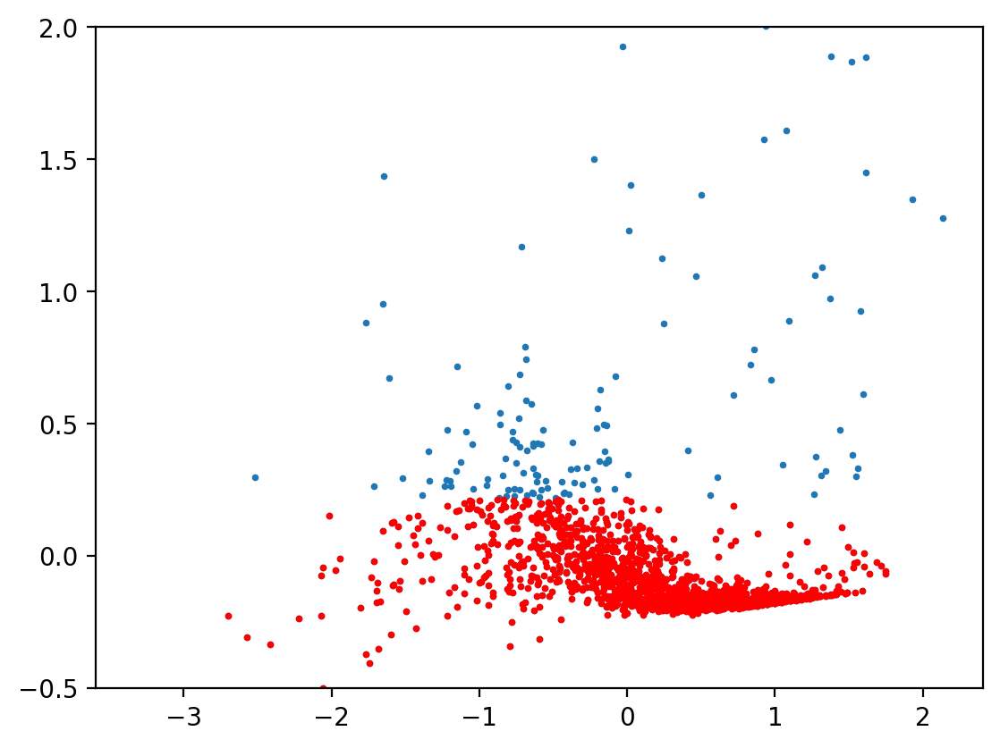

In [591]:
# outlier clipping (unfinished, eventually move it before the linalg step)

# first need to cut outliers
# fit something simple and then clip outliers around it
from scipy.optimize import curve_fit
from astropy.stats import sigma_clip

def func1(x, a, b):
    return a * np.exp(-b * x)

def func2(x, a, b):
    return a * 1 / (x + b)

def func3(x, a, b, c):
    return a / x**2 + b/x + c

xdata = np.log(dist_from_mc[ss_mask])
ydata = real_norm[ss_mask]
xmodel = np.linspace(0,8,100)
popt, pcov = curve_fit(func1, xdata, ydata)

# plt.scatter(xdata, ydata, s=3)
# plt.plot(xmodel, func1(xmodel, *popt), 'r--',)
# plt.ylim([0,2])
# plt.show()

# subtract model and sigma clip
resids = ydata - func1(xdata, *popt)
filtered_data = sigma_clip(resids, sigma_upper=3, sigma_lower=5, maxiters=5)

plt.scatter(xdata, resids, s=3)
plt.scatter(xdata, filtered_data, s=3, c='r')
# plt.plot(xmodel, func1(xmodel, *popt), 'r--',)
plt.ylim([-.5,2])
plt.show()


In [381]:
# maybe try a rolling sigma clip
dx = 1

# sort
inds_sort = xdata.argsort()
xsort = xdata[inds_sort]
ysort = ydata[inds_sort]

# 30min flicks - we want the bottom .5 percentile, so take the min 
min_inds30 = np.array([])

binsize = 50
k=34
sub_y = ysort[(k*binsize):(binsize*(k+1))]

# for k in np.arange(len(ysort)/binsize + 1).astype(int) :
# # for k in [0,1] :
#     print(k)
#     sub_y = ysort[(k*binsize):(binsize*(k+1))]
#     min_inds30 = np.append(min_inds30, np.argmin(sub_y)+k*binsize)
    
# #     print sub_flicks
# #     print np.argmin(sub_flicks)
# #     print sub_flicks[np.argmin(sub_flicks)]
    
# min_inds30 = min_inds30.astype(int)

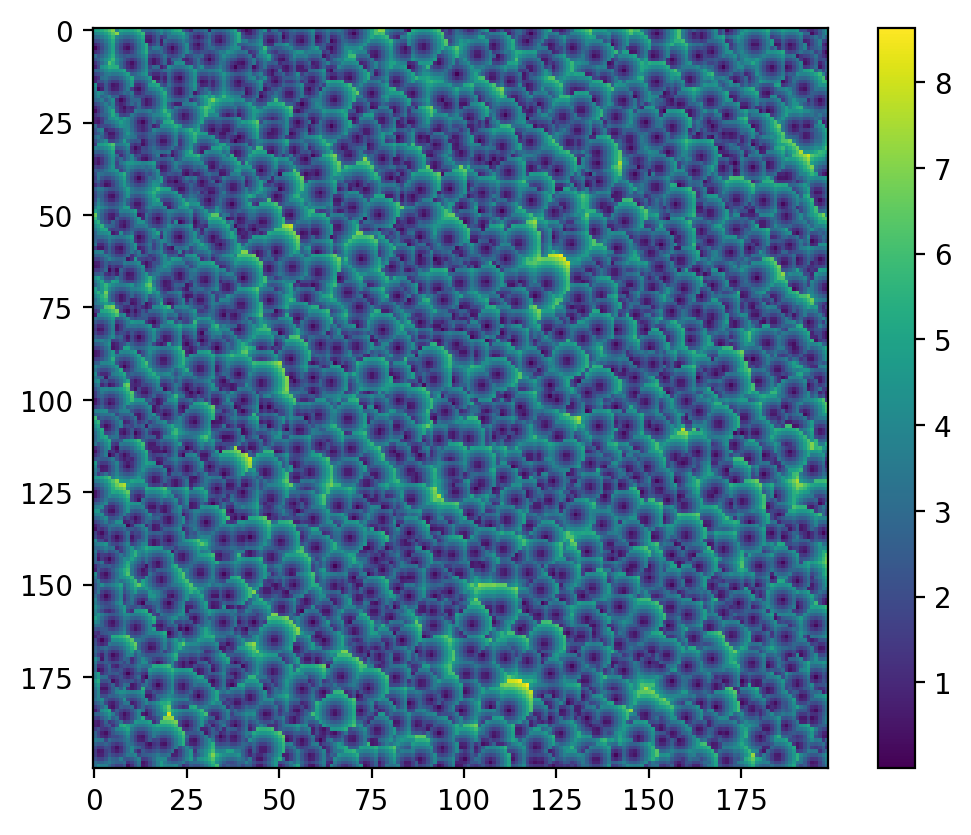

In [175]:
# # rad.shape
plt.imshow(dist_from_mc.reshape(image_shape))#, vmin=0, vmax=200)
plt.colorbar()

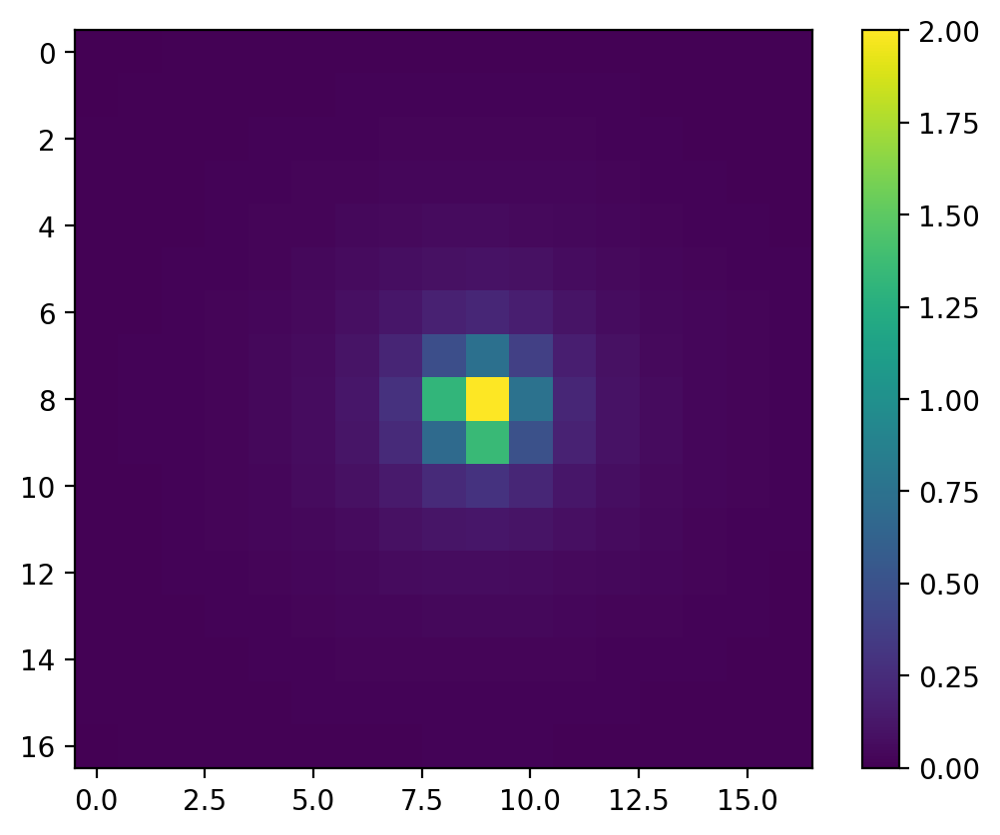

In [118]:
# plt.imshow(rad[1750,:,:])
# plt.colorbar()
# (rad.transpose([1, 2, 0])**(-2)).shape

plt.imshow(rad[1750,:,:]**(-2), vmin=0, vmax=2)
plt.colorbar()

In [119]:
single_source_mask.mask.shape

(200, 199)

In [120]:
s0.shape

(39800, 2684)

39800


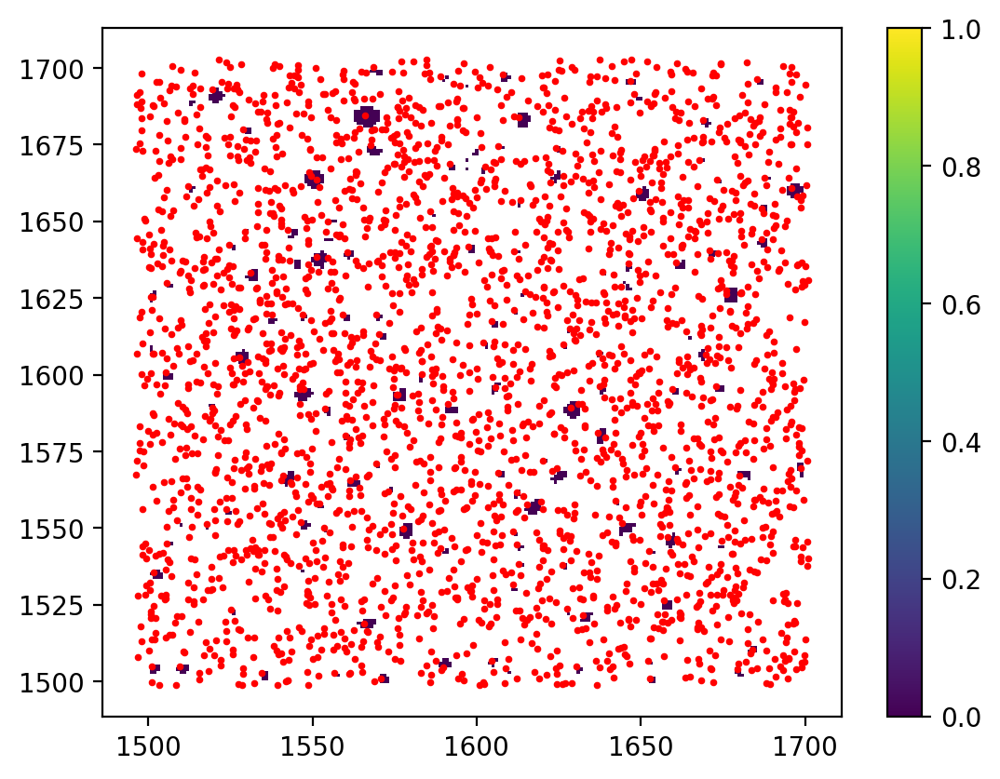

In [127]:
# rad[flux_mask,:,:].shape
print(len(max_contributor_ind))
s0.shape

# plt.imshow(s0.sum(axis=1).reshape(image_shape))
temp = np.ma.masked_where(single_source_mask.mask, s0.tocoo().toarray()[:,2679].reshape(image_shape))
# plt.imshow(temp)
plt.pcolormesh(C, R, temp, vmin=0, vmax=200)
# plt.scatter(df1[x_col], df1[y_col], s=3, c='r')
plt.colorbar()



In [339]:
(single_source_mask.mask.flatten())

39800

(0.0, 15.0)

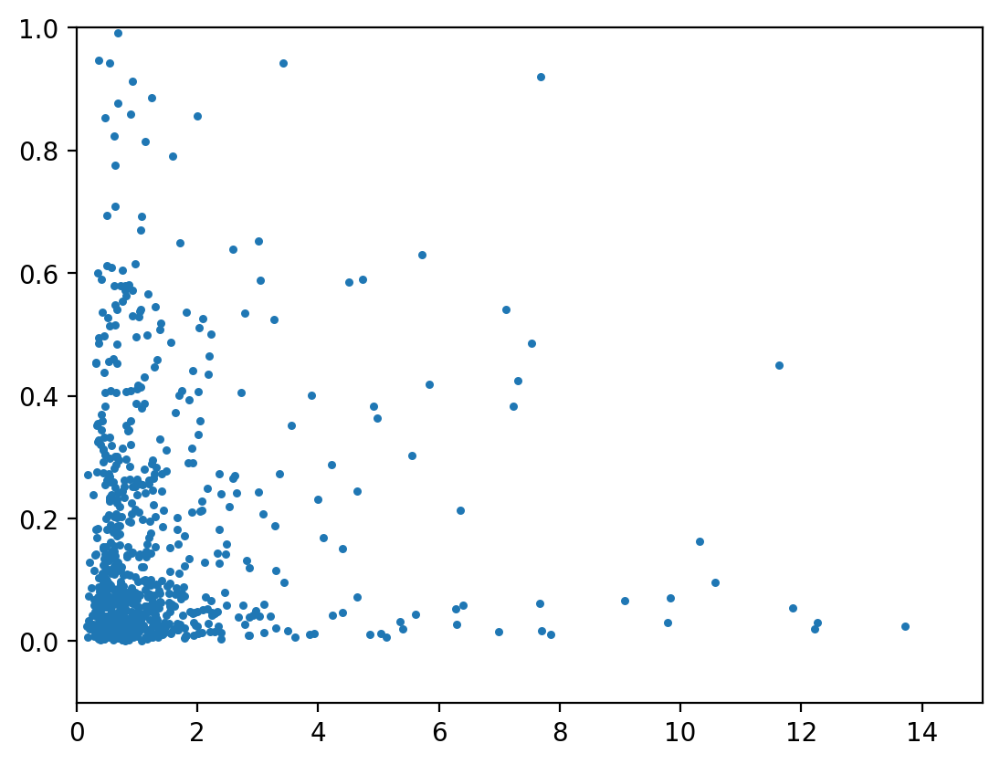

In [115]:
plt.scatter(np.asarray(s0.sum(axis=1))[~single_source_mask.mask.flatten()], y_norm[~single_source_mask.mask.flatten()], s=5)
plt.ylim([-0.1,1])
plt.xlim([0,15])
# plt.yscale('log')


In [ ]:
# Let's back up a step. For each source, let's make a graph of brightness vs. distance for EVERY pixel around it. Ignore the mask



In [449]:
def get_polar_psfs_new(df, x_col='X0', y_col='Y0', source_mask=None):
    if source_mask is None:
        source_mask = np.ones(len(df), bool)
    npixel_radii = 8
    gR, gC = np.mgrid[-npixel_radii:npixel_radii+1, -npixel_radii:npixel_radii+1].astype(float)
    dR = gR[None, :, :] - np.asarray(df[x_col][source_mask] % 1)[:, None, None]
    dC = gC[None, :, :] - np.asarray(df[y_col][source_mask] % 1)[:, None, None]
    
    rad, phi = np.hypot(dR, dC), np.arctan2(dC, dR)
    s0 = SparseWarp3D(
            rad.transpose([1, 2, 0])**(-2),
            gR[:, :, None] + np.asarray(np.floor(df[x_col][source_mask] - R[0, 0])).astype(int),
            gC[:, :, None] + np.asarray(np.floor(df[y_col][source_mask] - C[0, 0])).astype(int),
            image_shape,
        ).sum(axis=1)
    return sparse.csr_matrix(np.asarray([s0, np.ones_like(s0)])[:, :, 0].T)



In [194]:
# plt.imshow(ps[:,0].reshape(image_shape).tocoo().toarray())
np.asarray(df['X0'] % 1)

array([0.4 , 0.43, 0.94, ..., 0.32, 0.74, 0.68])

In [185]:
get_polar_psfs_new(df1, x_col='X1', y_col='Y1')

<39800x2 sparse matrix of type '<class 'numpy.float64'>'
	with 79600 stored elements in Compressed Sparse Row format>

In [130]:
w/flux_coeff

array([ 7.19802749e-03,  7.36876240e-03,  7.43876586e-03, ...,
        8.04442617e-03, -4.17663380e-05,  3.93122586e-05])

In [83]:
# bc the gradient is negative in some places, this might be a smidge of a problem... but I think it's small enough to ignore for now?
max(con_ratio2)

matrix([[1.00001478]])

In [127]:
# grad true flux of source * delta_x
# w[-2:] is in units of pixels
# grad is d_flux/d_pix
w[-2:]

array([-0.00594562,  0.00559627])

### Work on understanding psf fitting

In [104]:
single_source_mask.shape


(200, 199)

In [124]:
def get_polar_psfs(df, source_flux, source_mask=None, npixel_radii=8):
    if source_mask is None:
        source_mask = np.ones(len(df), bool)
    gR, gC = np.mgrid[-npixel_radii:npixel_radii+1, -npixel_radii:npixel_radii+1].astype(float)
    dR = gR[None, :, :] - np.asarray(df['X0'][source_mask] % 1)[:, None, None]
    dC = gC[None, :, :] - np.asarray(df['Y0'][source_mask] % 1)[:, None, None]
    
    rad, phi = np.hypot(dR, dC), np.arctan2(dC, dR)
    s0 = SparseWarp3D(
            rad.transpose([1, 2, 0])**(-2),
            gR[:, :, None] + np.asarray(np.floor(df['X0'][source_mask] - R[0, 0])).astype(int),
            gC[:, :, None] + np.asarray(np.floor(df['Y0'][source_mask] - C[0, 0])).astype(int),
            image_shape,
        ).sum(axis=1)
    
    # s1 = SparseWarp3D(
    #         (rad * np.asarray(source_flux)[:, None, None][source_mask]).transpose([1, 2, 0])**(-2),
    #         gR[:, :, None] + np.asarray(np.floor(df['X0'][source_mask] - R[0, 0])).astype(int),
    #         gC[:, :, None] + np.asarray(np.floor(df['Y0'][source_mask] - C[0, 0])).astype(int),
    #         image_shape,
    #     ).sum(axis=1)
    
    # s2 = SparseWarp3D(
    #         (rad * np.asarray(source_flux)[:, None, None][source_mask]**2).transpose([1, 2, 0])**(-2),
    #         gR[:, :, None] + np.asarray(np.floor(df['X0'][source_mask] - R[0, 0])).astype(int),
    #         gC[:, :, None] + np.asarray(np.floor(df['Y0'][source_mask] - C[0, 0])).astype(int),
    #         image_shape,
    #     ).sum(axis=1)
    # return sparse.csr_matrix(np.asarray([s0, s1, s2, np.ones_like(s0)])[:, :, 0].T)
    return sparse.csr_matrix(np.asarray([s0, np.ones_like(s0)])[:, :, 0].T)

In [125]:
ps = get_polar_psfs(df1, source_flux=df1.flux_fit1)

In [126]:
ps.shape

(39800, 2)

For shape fitting, put in all the single-source pixels data normalized by flux, take the log, then fit. Start with log of a gaussian. 



## cont

### Estimate Gaussian STD and Flux Coefficients (OLD)

This version uses the function get_gaussian_psfs, which rolls in the gradients along with the gaussian scene

Min STD: 1.4
Flux Coeff: 142.35439122568536


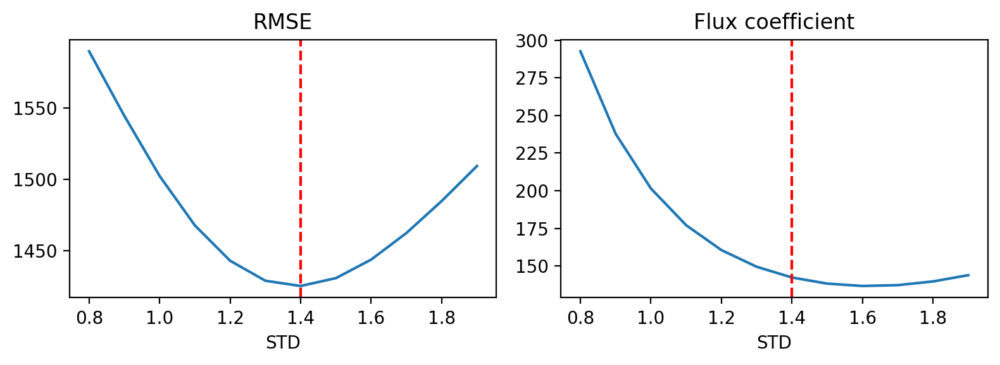

In [ ]:
# as a first step, do a fit for a linear position shift and a constant flux coefficient across the entire image

stds = np.arange(0.8,2., 0.1)
flux_coeffs = np.zeros_like(stds)
rmse = np.zeros_like(stds)
w0s = np.zeros([len(stds),3])

y = data.ravel()
yerr = err.ravel()
# Finite pixel mask and positive pixel mask
k = np.isfinite(y)
j = y > 0

for ind, std in enumerate(stds):
    s = get_gaussian_psfs(df, source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
    s1 = sparse.hstack([s[:,:-2].sum(axis=1), s[:,-2], s[:,-1]], 'csr')

    # weight the pixels by their flux errors
    sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
    w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))    
    
    # # no errors
    # sigma_w_inv = s1.T.dot(s1)
    # w = np.linalg.solve(sigma_w_inv.toarray(), s1.T.dot(y))

    flux_coeffs[ind] = 1/w[0]
    w0s[ind] = w
    # out_image = s1.dot(w).reshape(image_shape)
    # output[ind] = np.sum(np.abs(data - s1.dot(w).reshape(image_shape)))

    # this is the RMSE
    rmse[ind] = np.sqrt(np.mean((data - s1.dot(w).reshape(image_shape))**2))

# take the STD and the flux_coeff that minimizes the resids
# Note: need to fix the resids function later
ind = np.argmin(rmse)
std = stds[ind]
flux_coeff = flux_coeffs[ind]
w0 = w0s[ind]
print('Min STD: ' + str(std))
print('Flux Coeff: ' + str(flux_coeff))

# plot
if True:
    fig, ax = plt.subplots(1,2, figsize=[8,3])
    ax[0].plot(stds,rmse)
    ax[0].set_title('RMSE')
    ax[0].axvline(std, c='r', linestyle='--')
    ax[0].set_xlabel('STD')

    ax[1].plot(stds,flux_coeffs)
    ax[1].set_title('Flux coefficient')
    ax[1].axvline(std, c='r', linestyle='--')
    ax[1].set_xlabel('STD')
    fig.tight_layout()


In [ ]:
model_image = s1[:,:-2].sum(axis=1).reshape(image_shape) / data
# model_image = s.sum(axis=1).reshape(image_shape) / data

print(w[-2:])

# plots
if False:
    plt.imshow(s1.dot(w).reshape(image_shape)-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    plt.imshow(s1[:,:-2].dot(w[:-2]).reshape(image_shape)-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

[-0.00843651  0.00712701]


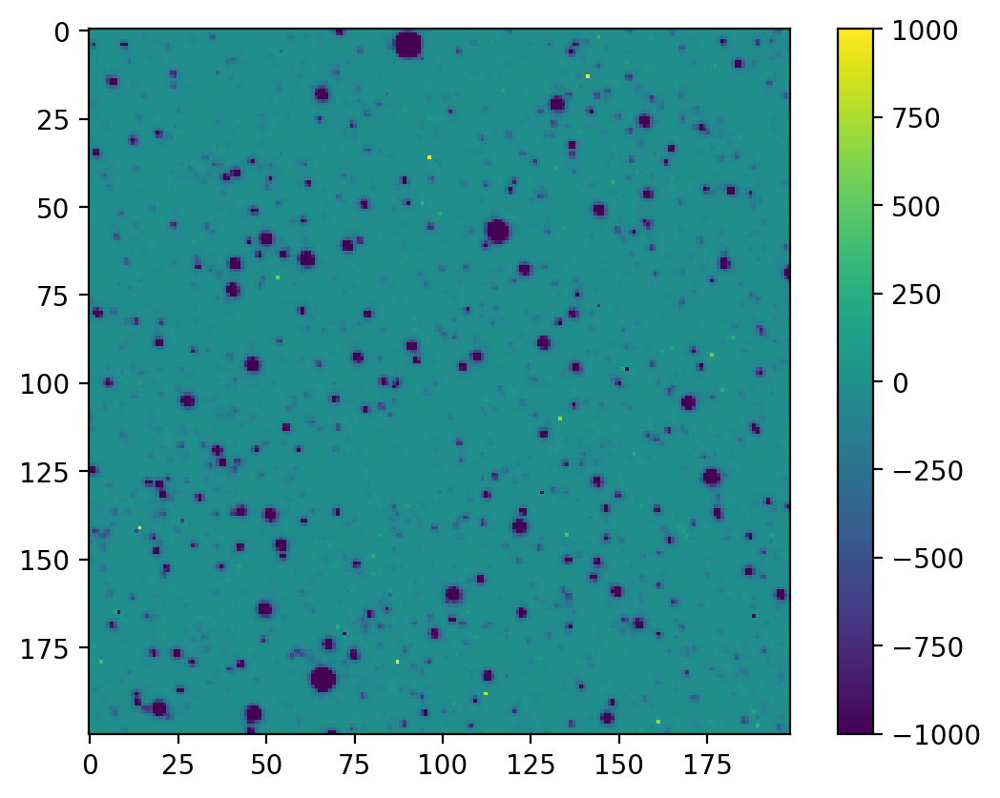

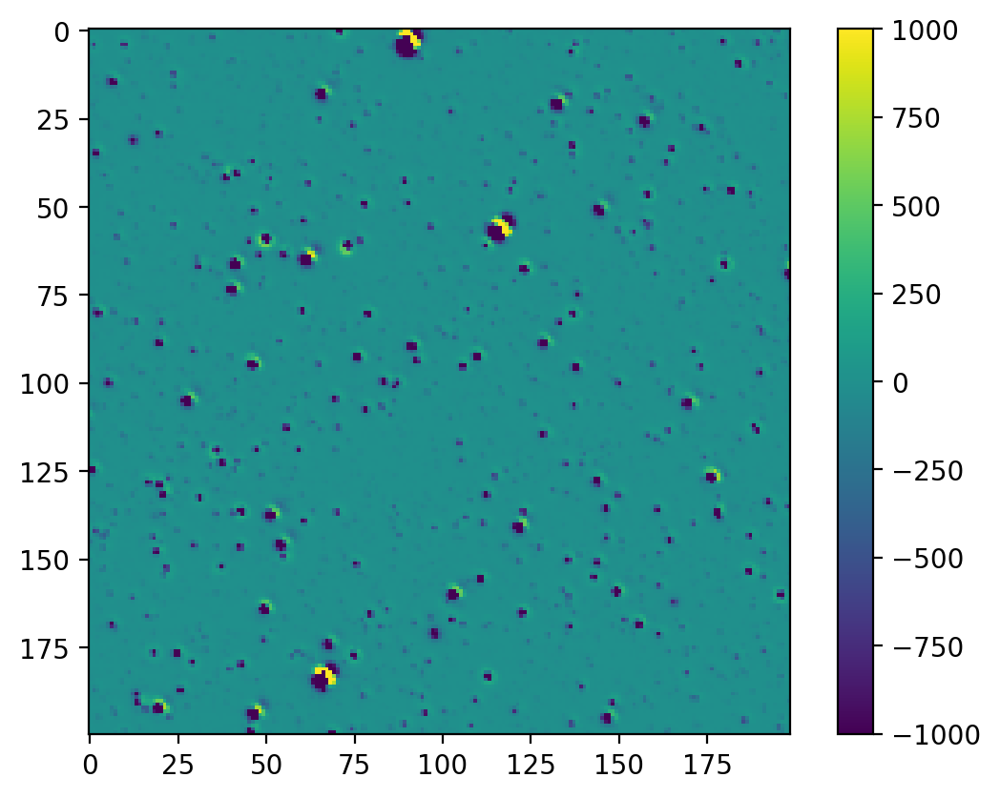

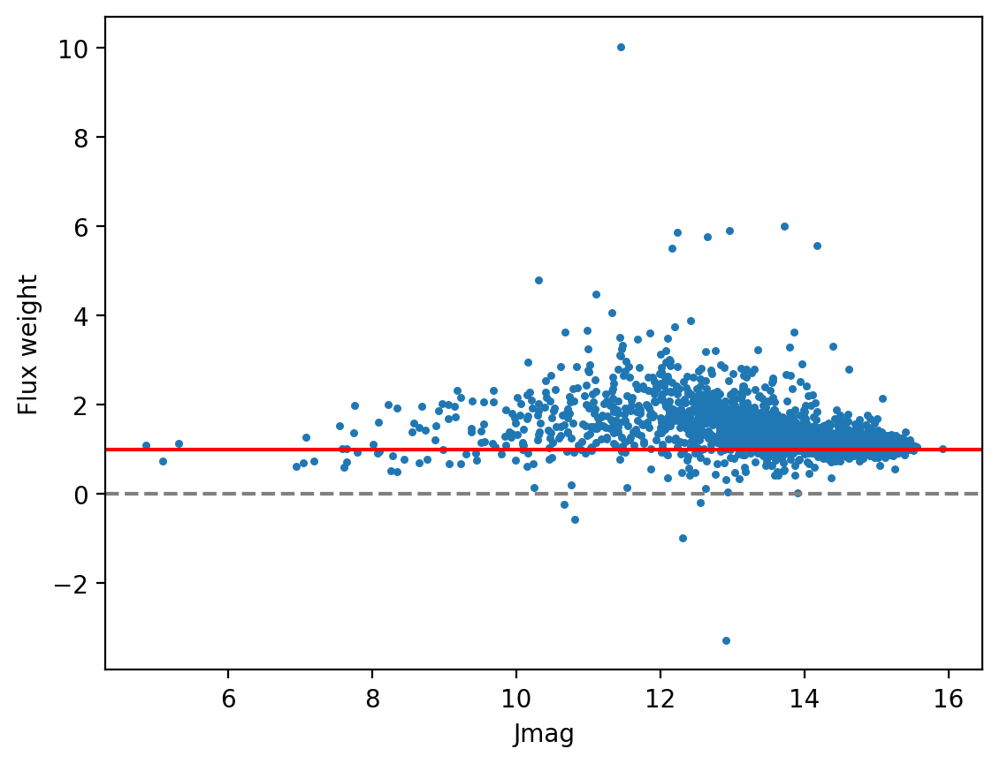

In [ ]:
# Now fit individually for fluxes, using a tight gaussian prior

# impose a flux cutoff (currently disabled)
# flux_mask = df.j_m < 14
flux_mask = df.j_m < 100

# note that we have divided by the flux coeff
# s = get_gaussian_psfs(df, source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
# s = s[:, np.hstack([flux_mask, True, True])]
# s1 = sparse.hstack([s[:,:-2] / flux_coeff, s[:,-2], s[:,-1]], 'csr')

s1 = get_gaussian_psfs(df, source_flux=np.asarray(df.phot_rp_mean_flux) / flux_coeff, std=std)

model_image = s1[:,:-2].sum(axis=1).reshape(image_shape) / data
# model_image = s.sum(axis=1).reshape(image_shape) / data

# define priors on the flux weights
prior_mu = np.ones_like(df.phot_rp_mean_flux)
prior_sigma = (np.ones(s1.shape[1]) * .02)

# regression with priors
sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
sigma_w_inv += np.diag(1 / (prior_sigma ** 2))
B = s1.T.dot(y/yerr**2)
B = s1.T.dot(y/yerr**2) + 1 / (prior_sigma ** 2) # 1 is prior_mu
w = np.linalg.solve(sigma_w_inv, B)
# werrs = np.linalg.inv(sigma_w_inv).diagonal() ** 0.5

out_image = s1.dot(w).reshape(image_shape)

# plots
if True:
    plt.imshow(model_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    plt.imshow(out_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    # check the distribution of weights
    plt.scatter(df[flux_mask].j_m, w[:-2], s=5)
    # plt.ylim([-30,30])
    # plt.ylim([-5,5])
    # plt.xscale('log')
    plt.axhline(1, c='r')
    plt.axhline(0, c='grey', linestyle='--')
    plt.xlabel('Jmag')
    plt.ylabel('Flux weight')
    plt.show()


In [ ]:
w[-2:]

array([-0.84633384,  0.79664617])

7


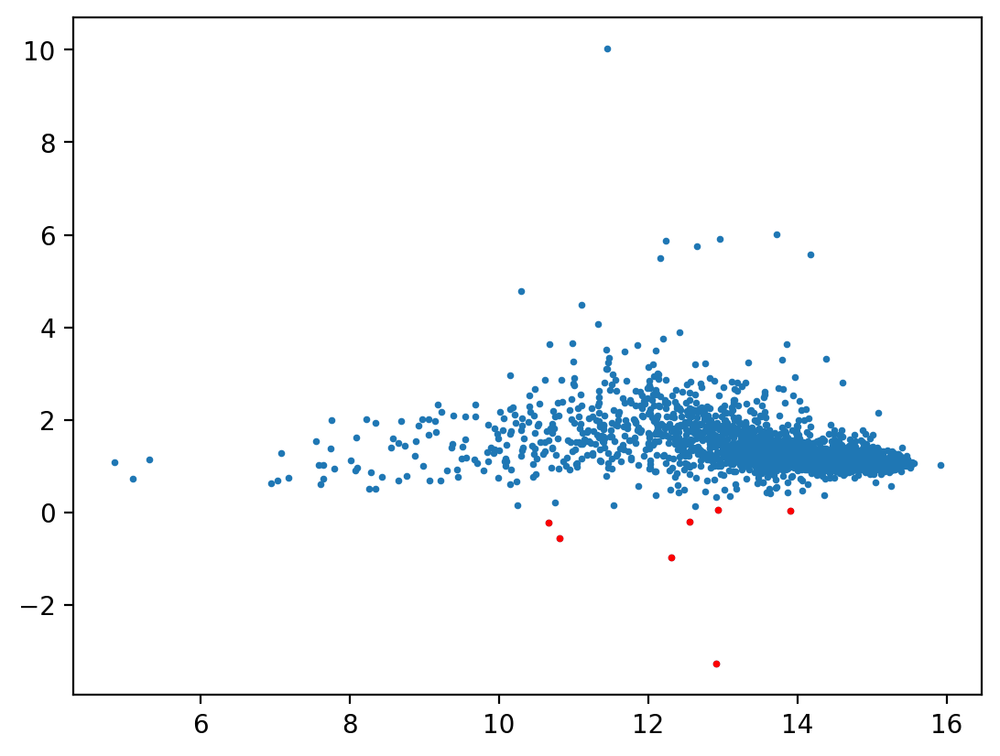

In [ ]:
temp = w[:-2] < .1
print(sum(temp))

plt.scatter(df.j_m, w[:-2], s=3)
plt.scatter(df[temp].j_m, w[:-2][temp], s=3,c='r')


7
0


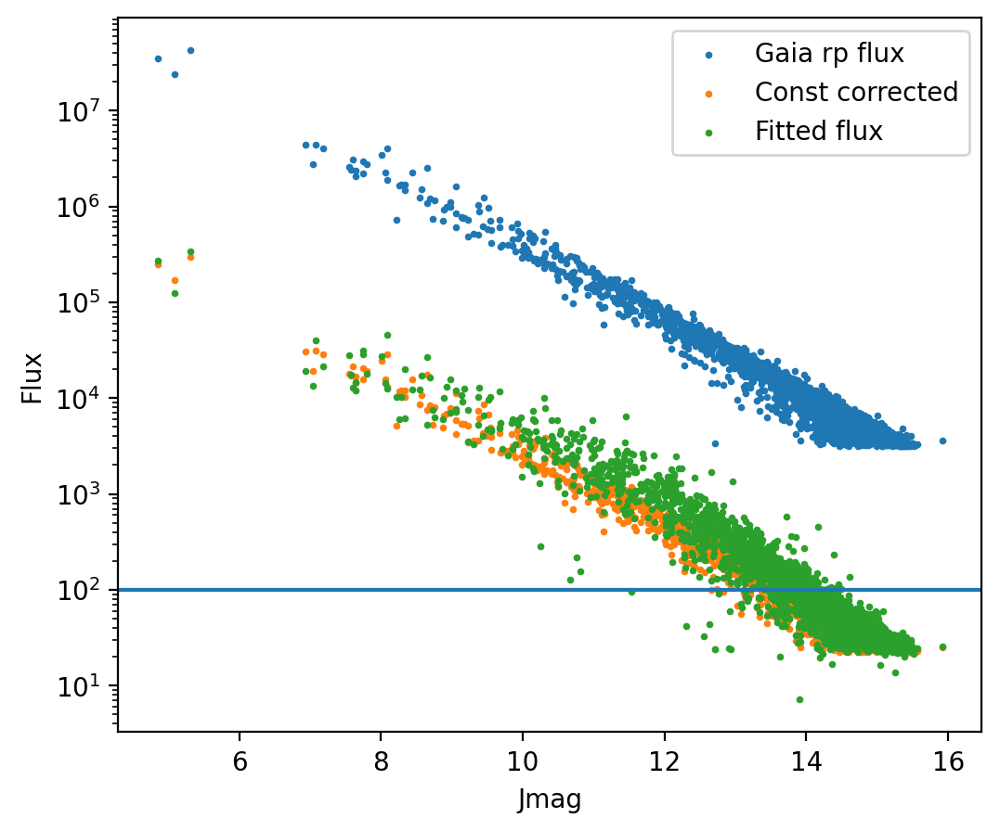

In [ ]:
# Caculate the new flux array guess
# Reset weights that are below 0.1 get reset to 0.1
w_cut = np.hstack(((w[:-2] < .1), [False, False]))
print(sum(w_cut))

w_m = w.copy()
w_m[w_cut] = 0.1
flux_new = df.phot_rp_mean_flux / flux_coeff * w_m[:-2]

# print(sum(flux_new < 0))

# plot
if True:
    plt.figure(figsize=[6,5])
    plt.scatter(df.j_m, df.phot_rp_mean_flux, s=3, label='Gaia rp flux')
    plt.scatter(df.j_m, df.phot_rp_mean_flux / flux_coeff, s=3, label='Const corrected')
    plt.scatter(df.j_m, flux_new, s=3, label='Fitted flux')
    plt.axhline(100)
    plt.yscale('log')
    plt.xlabel('Jmag')
    plt.ylabel('Flux')
    plt.legend()
    plt.show()


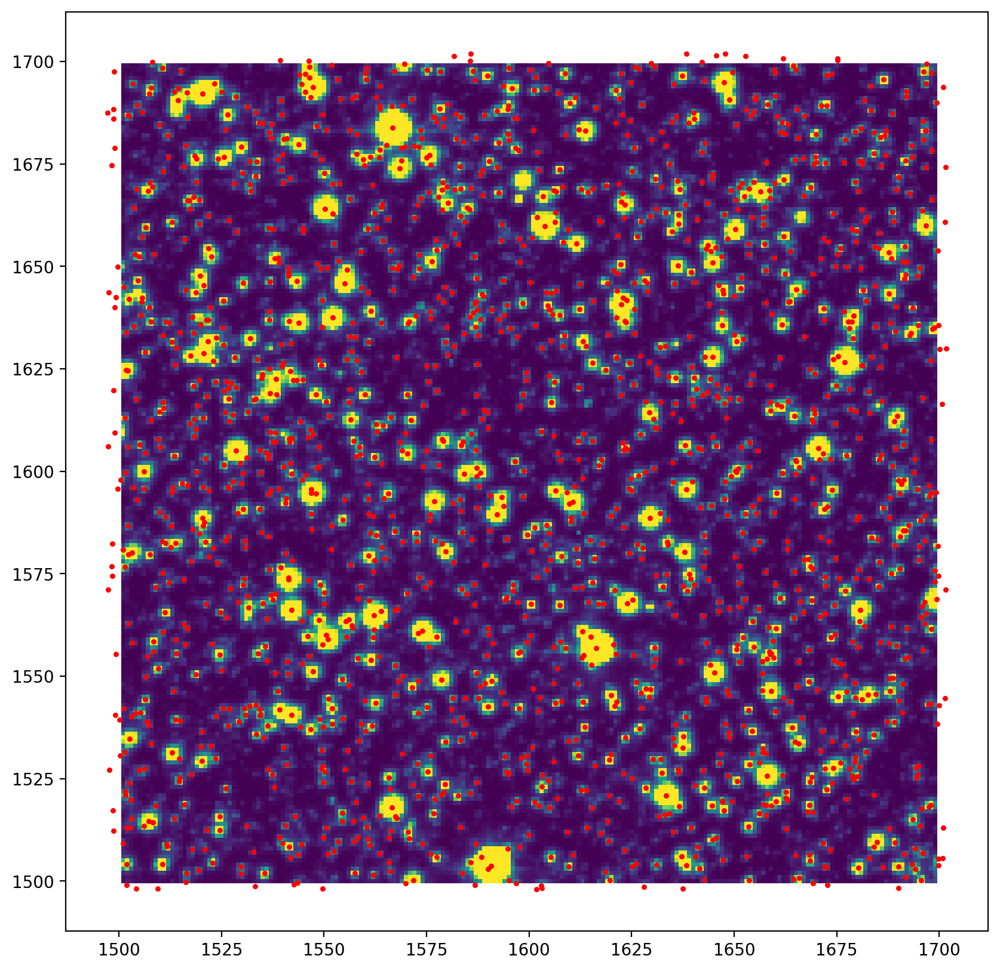

In [ ]:
# downselect only to sources above a certain flux
flux_mask = flux_new > 50
df['flux_fit1'] = flux_new
df1 = df[flux_mask]


plt.figure(figsize=(10, 10))
plt.pcolormesh(C, R, data, vmin=0, vmax=200)
bright_sources = df.phot_rp_mean_flux > 1e5
plt.scatter(df1["X0"], df1["Y0"], s=5, c="r")
plt.gca().set_aspect("equal")

Text(0, 0.5, 'NN Separation (arcsec)')

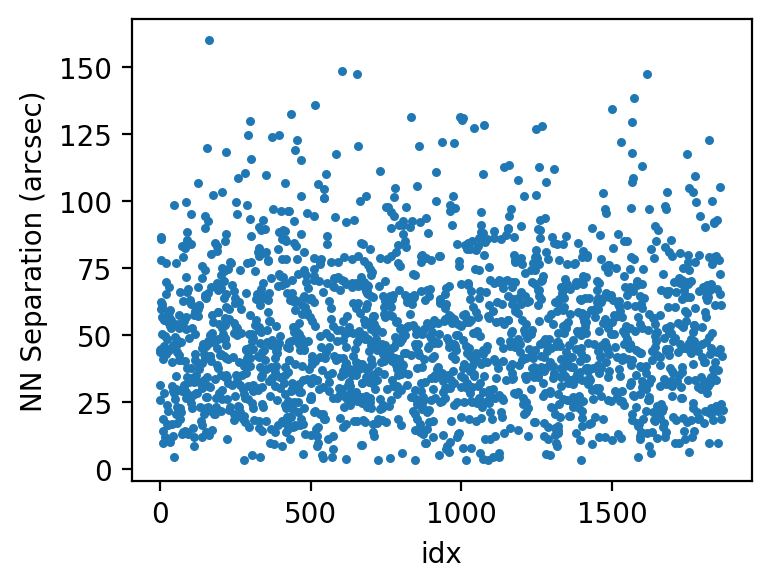

In [ ]:
# check nearest neighbors
catalog = SkyCoord(ra=df1.ra*u.degree, dec=df1.dec*u.degree)
idx, d2d, d3d = match_coordinates_sky(catalog, catalog, nthneighbor=2)

plt.figure(figsize=[4,3])
plt.scatter(idx, d2d.arcsec, s=5)
plt.xlabel('idx')
plt.ylabel('NN Separation (arcsec)')

In [ ]:
s1.shape
len(df1)

665

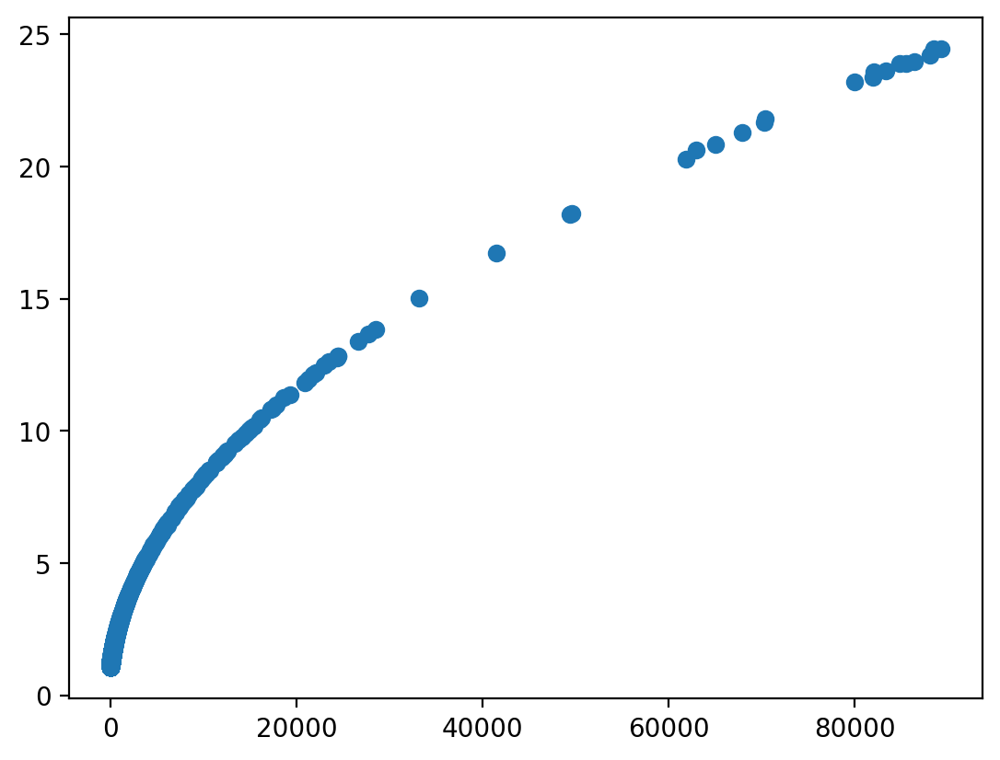

In [324]:
# errors
plt.scatter(data.ravel(),err.ravel())

In [265]:
# our first challenge is to get a good estimate of which pixels have contributions from only one source
# I'm going to start by writing some code that, given a gaussian of a particular width, calculates the the percentage of the flux that comes from the dominant pixel
# df is jmag < 15
# k - finite pixel mask

# returns a sparse matrix
s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=1.5)
# s.shape


y = data.ravel()
yerr = err.ravel()

# Finite pixel mask
k = np.isfinite(y)

flux_mask = np.zeros(s.shape[1], bool)
flux_mask[:len(df)] = True

# weight the pixels by their flux errors
sigma_w_inv = s[k].T.dot(s[k]/yerr[k, None]**2)
w = np.linalg.solve(sigma_w_inv, s[k].T.dot(y[k]/yerr[k]**2))



In [266]:
print(len(df.phot_rp_mean_flux))
s.shape

3143


(39800, 3145)

3143


ValueError: Item wrong length 39800 instead of 3143.

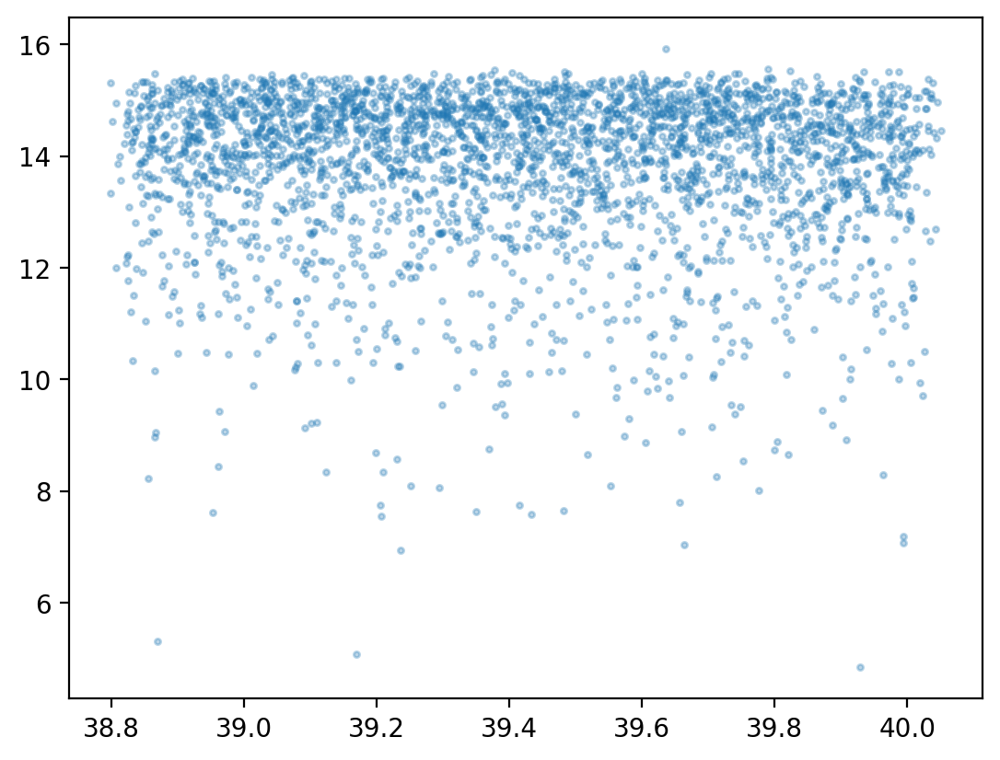

In [267]:
print(len(df))
# df.phot_rp_mean_flux
# plt.scatter(df.dec, df.phot_rp_mean_flux, s=5, alpha=0.3)
# plt.yscale('log')

plt.scatter(df.dec, df.j_m, s=5, alpha=0.3)
plt.scatter(df[k].dec, df[k].j_m, s=5, alpha=0.3)
# plt.yscale('log')
plt.show()

In [ ]:
## Think about how to incorporate errors as weights

# (low priority) look into scipy.minimize for this also

# what happens if the sources are slightly offset? Assume that I am within one pixel

# (later) think about adding in azimuthal dependence

Dealing with negative fluxes
- Enforce a rule about how close sources can be together before you lump them together into a single source
    - astropy coordinates nearest_neighbor to check 
    - https://docs.astropy.org/en/stable/api/astropy.coordinates.match_coordinates_3d.html
    - separation in position space, and also separation in flux/mag space (contrast)
    - test this with a few different cutouts
- apply priors to the fluxes
    - have to be gaussian!
    - ideally, flux weights should be centered on 1

In [ ]:
# note that Pandora will have far fewer sources in it than in a TESS image
# but this work can give us a feel of what kind of commissioning data we need in order to well-measure the psf
# also it's nice to be generic!

In [73]:
s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=1.2)
s1 = sparse.hstack([s[:,:-2] / flux_coeff, s[:,-2], s[:,-1]], 'csr')



In [366]:
s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=1.4)
s1 = sparse.hstack([s[:,:-2].sum(axis=1), s[:,-2], s[:,-1]], 'csr')

# weight the pixels by their flux errors
sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))

print(1/w[0])
# out_image = s1.dot(w).reshape(image_shape)
print(np.sum(np.abs(data - s1.dot(w).reshape(image_shape))))

142.35439122568536
3915122.6577871586


Min STD: 1.4
Flux Coeff: 142.35439122568536


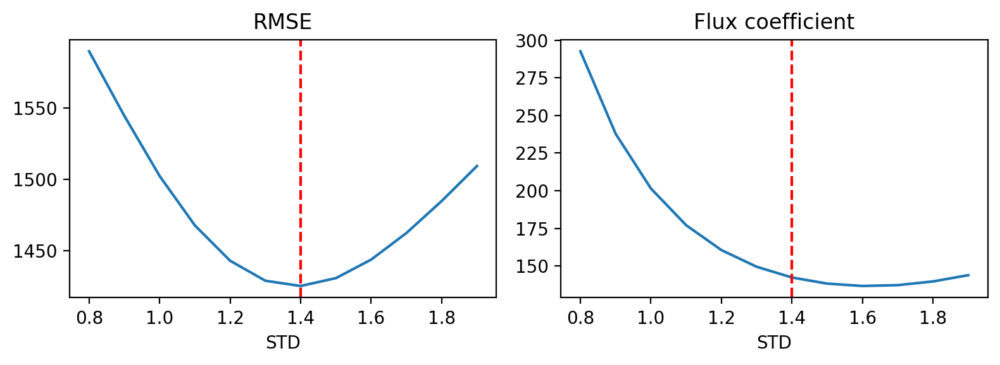

In [326]:
# as a first step, do a fit for a linear position shift and a constant flux coefficient across the entire image

stds = np.arange(0.8,2., 0.1)
flux_coeffs = np.zeros_like(stds)
rmse = np.zeros_like(stds)
w0s = np.zeros([len(stds),3])

# Finite pixel mask and positive pixel mask
k = np.isfinite(y)
j = y > 0

for ind, std in enumerate(stds):
    s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
    s1 = sparse.hstack([s[:,:-2].sum(axis=1), s[:,-2], s[:,-1]], 'csr')

    # weight the pixels by their flux errors
    sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
    w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))    
    
    # # no errors
    # sigma_w_inv = s1.T.dot(s1)
    # w = np.linalg.solve(sigma_w_inv.toarray(), s1.T.dot(y))

    flux_coeffs[ind] = 1/w[0]
    w0s[ind] = w
    # out_image = s1.dot(w).reshape(image_shape)
    # output[ind] = np.sum(np.abs(data - s1.dot(w).reshape(image_shape)))

    # this is the RMSE
    rmse[ind] = np.sqrt(np.mean((data - s1.dot(w).reshape(image_shape))**2))

# take the STD and the flux_coeff that minimizes the resids
# Note: need to fix the resids function later
ind = np.argmin(rmse)
std = stds[ind]
flux_coeff = flux_coeffs[ind]
w0 = w0s[ind]
print('Min STD: ' + str(std))
print('Flux Coeff: ' + str(flux_coeff))

# plot
if True:
    fig, ax = plt.subplots(1,2, figsize=[8,3])
    ax[0].plot(stds,rmse)
    ax[0].set_title('RMSE')
    ax[0].axvline(std, c='r', linestyle='--')
    ax[0].set_xlabel('STD')

    ax[1].plot(stds,flux_coeffs)
    ax[1].set_title('Flux coefficient')
    ax[1].axvline(std, c='r', linestyle='--')
    ax[1].set_xlabel('STD')
    fig.tight_layout()


In [376]:
s1.dot([1/fc, w[1], w[2]]).reshape(image_shape)
w0

array([ 0.00702472, -0.00598148,  0.00569582])

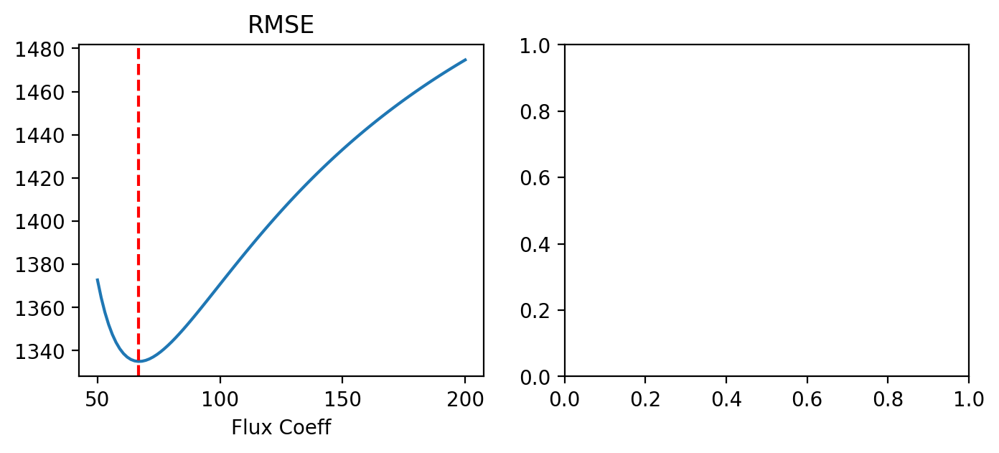

In [356]:
# iterate over different flux coeffs to see if we can really do any better
# as a first step, do a fit for a linear position shift and a constant flux coefficient across the entire image

s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
s1 = sparse.hstack([s[:,:-2].sum(axis=1), s[:,-2], s[:,-1]], 'csr')

fcs = np.linspace(50, 200, 100)
rmse1 = np.zeros_like(fcs)

# # Finite pixel mask and positive pixel mask
# k = np.isfinite(y)
# j = y > 0

for ind, fc in enumerate(fcs):
    out_image = s1.dot([1/fc, w[1], w[2]]).reshape(image_shape)
    # output[ind] = np.sum(np.abs(data - s1.dot(w).reshape(image_shape)))

    # this is the RMSE
    rmse1[ind] = np.sqrt(np.mean((data - out_image)**2))

# take the STD and the flux_coeff that minimizes the resids
# Note: need to fix the resids function later
ind1 = np.argmin(rmse1)
# std = stds[ind]
# flux_coeff = flux_coeffs[ind]
# w0 = w0s[ind]
# print('Min STD: ' + str(std))
# print('Flux Coeff: ' + str(flux_coeff))

# plot
if True:
    fig, ax = plt.subplots(1,2, figsize=[8,3])
    ax[0].plot(fcs,rmse1)
    ax[0].set_title('RMSE')
    ax[0].axvline(fcs[ind1], c='r', linestyle='--')
    ax[0].set_xlabel('Flux Coeff')

    # ax[1].plot(fcs,flux_coeffs)
    # ax[1].set_title('Flux coefficient')
    # ax[1].axvline(std, c='r', linestyle='--')
    # ax[1].set_xlabel('STD')
    # fig.tight_layout()


In [363]:
fcs[ind1]
1/w

array([ 142.35439123, -167.182635  ,  175.56737845])

In [365]:
w

array([ 0.00702472, -0.00598148,  0.00569582])

1.4 142.35439122568536
[ 0.00702472 -0.00598148  0.00569582]
142.35439122568536


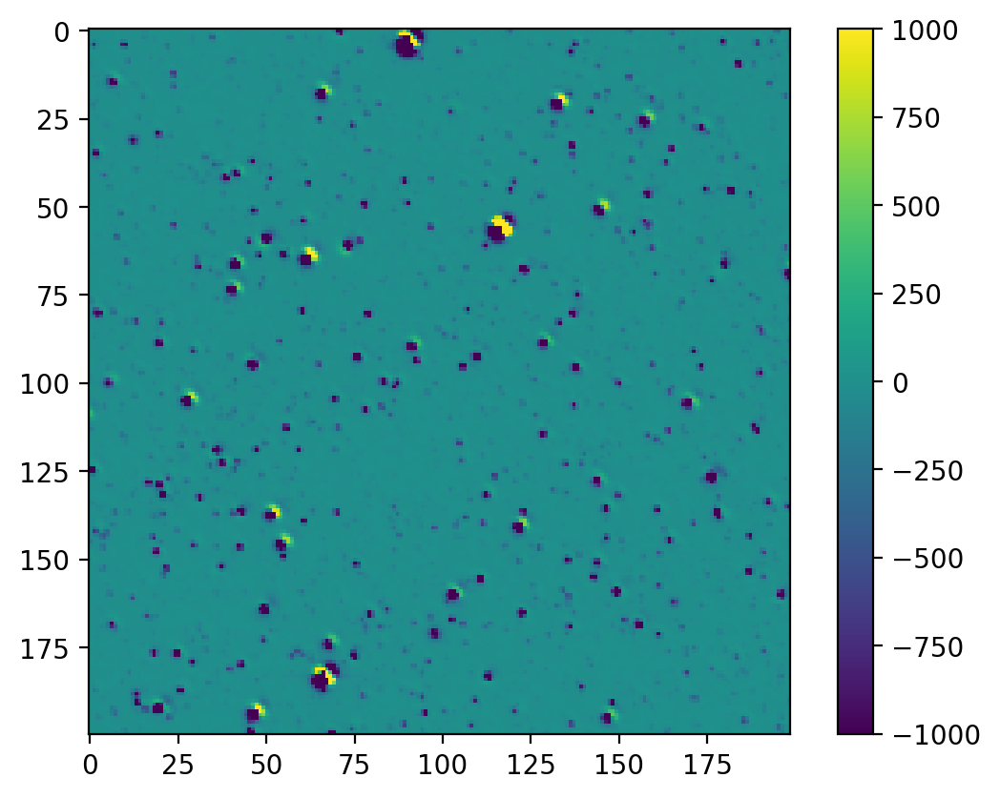

In [385]:
# slightly different first step, do a fitting for the position shift and a CONSTANT flux coefficient across the image

print(std, flux_coeff)

s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
s1 = sparse.hstack([s[:,:-2].sum(axis=1), s[:,-2], s[:,-1]], 'csr')

# weight the pixels by their flux errors
sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))


# sigma_w_inv = s1.T.dot(s1/yerr[:, None]**3)
# w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**3))

# # no errors
# sigma_w_inv = s1.T.dot(s1)
# w = np.linalg.solve(sigma_w_inv.toarray(), s1.T.dot(y))


out_image = s1.dot(w).reshape(image_shape)
# out_image = s1.dot([1/fcs[ind1], w[1], w[2]]).reshape(image_shape)
# out_image = s1.dot([1/200, w0[1], w0[2]]).reshape(image_shape)
# np.sum(np.abs(data - s1.dot(w).reshape(image_shape)))

print(w0)
print(1/w[0])

plt.imshow(out_image-data,vmin=-1000,vmax=1000)
plt.colorbar()
plt.show()


In [176]:
flux_coeff

142.35439122568536

1.4 142.35439122568536


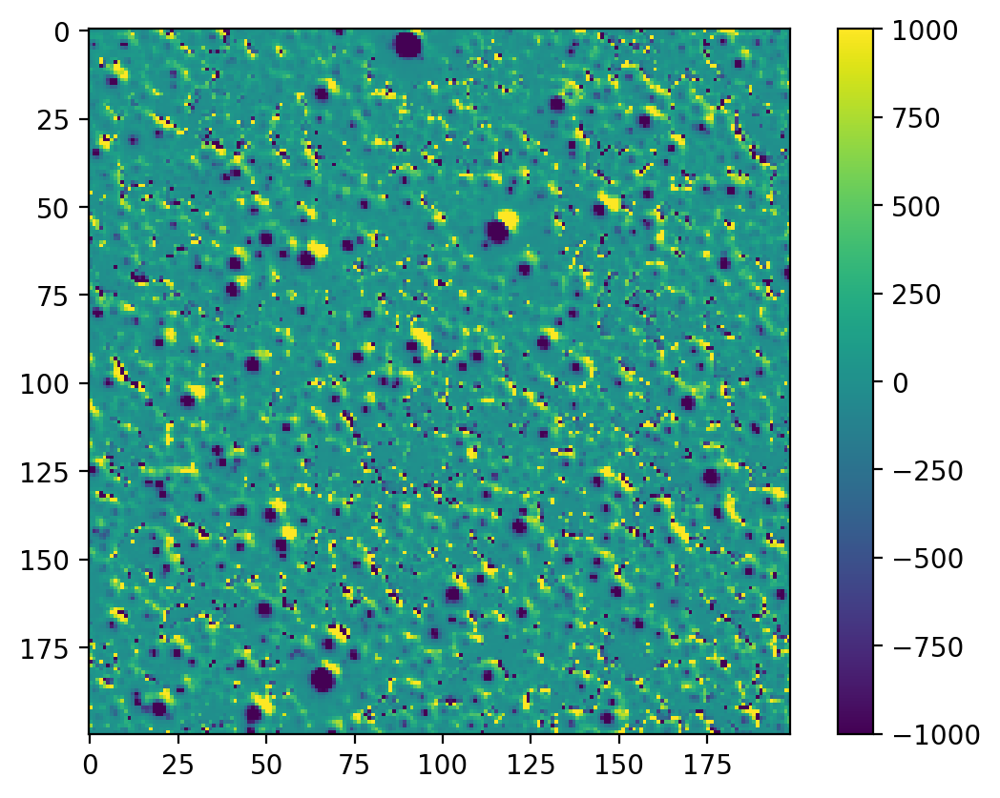

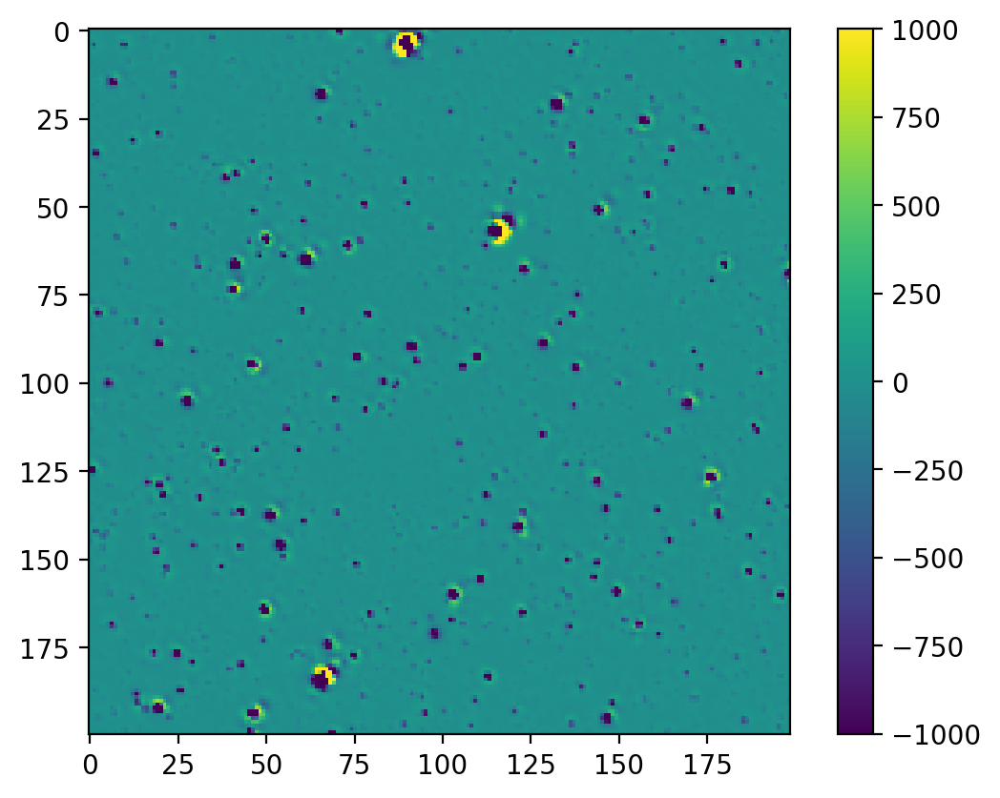

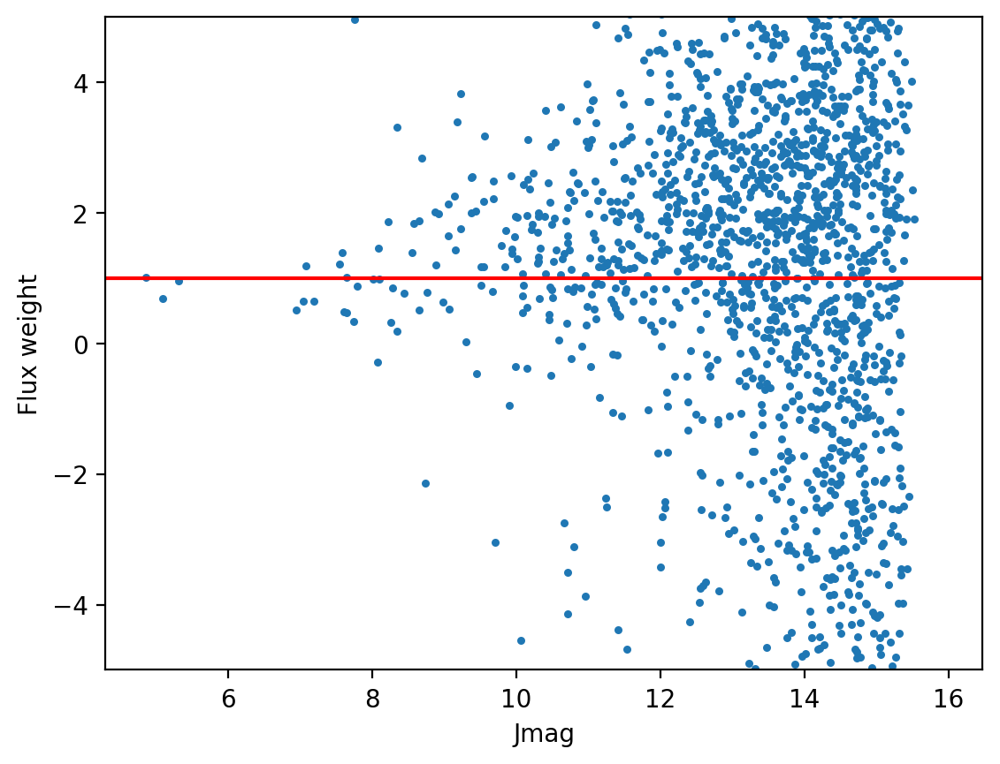

In [392]:
# now fit for ALL source fluxes separately

# impose a flux cutoff
# flux_mask = df.j_m < 14
flux_mask = df.j_m < 100
s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
s = s[:, np.hstack([flux_mask, True, True])]

model_image = s[:,:-2].sum(axis=1).reshape(image_shape) / data
# model_image = s.sum(axis=1).reshape(image_shape) / data

# note that we have divided by the flux coeff
s1 = sparse.hstack([s[:,:-2] / flux_coeff, s[:,-2], s[:,-1]], 'csr')

print(std, flux_coeff)

# weight the pixels by their flux errors
sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))

# sigma_w_inv = s1.T.dot(s1.multiply(1/yerr[k&j, None]**2)).toarray() 
# source_flux = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))

out_image = s1.dot(w).reshape(image_shape)
# np.sum(np.abs(data - s1.dot(w).reshape(image_shape)))

# plots
if True:
    plt.imshow(model_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    plt.imshow(out_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    # check the distribution of weights
    plt.scatter(df[flux_mask].j_m, w[:-2], s=5)
    # plt.ylim([-30,30])
    plt.ylim([-5,5])
    # plt.xscale('log')
    plt.axhline(1, c='r')
    plt.xlabel('Jmag')
    plt.ylabel('Flux weight')
    plt.show()

In [414]:
# prior_mu = np.ones_like(df.phot_rp_mean_flux)
# prior_sigma = (
#     np.ones(self.mean_model.shape[0]) * 10 * self.source_flux_estimates
# )

# # f and fe are flux and flux_err of each pixel

# X = self.mean_model.copy()
# X = X.T

# sigma_w_inv = X.T.dot(X.multiply(1 / fe[:, None] ** 2)).toarray()
# # this term adds in the prior!
# sigma_w_inv += np.diag(1 / (prior_sigma ** 2))
# B = X.T.dot((f / fe ** 2))
# B += prior_mu / (prior_sigma ** 2)
# ws = np.linalg.solve(sigma_w_inv, B)
# werrs = np.linalg.inv(sigma_w_inv).diagonal() ** 0.5


prior_mu = np.ones_like(df.phot_rp_mean_flux)
prior_sigma = (np.ones_like(data) * 0.1)

prior_sigma.shape

# # compare
# sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
# sigma_w_inv += np.diag(1 / (prior_sigma ** 2))
# w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))
# werrs = np.linalg.inv(sigma_w_inv).diagonal() ** 0.5

(200, 199)

In [421]:
s1.shape

(39800, 3145)

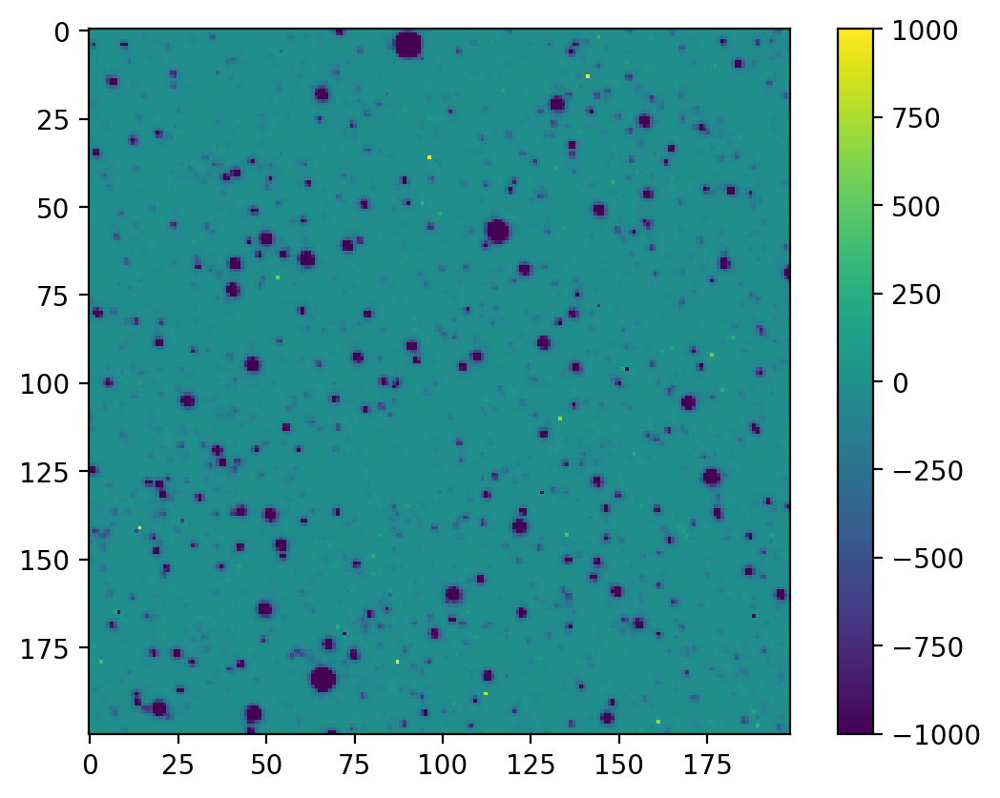

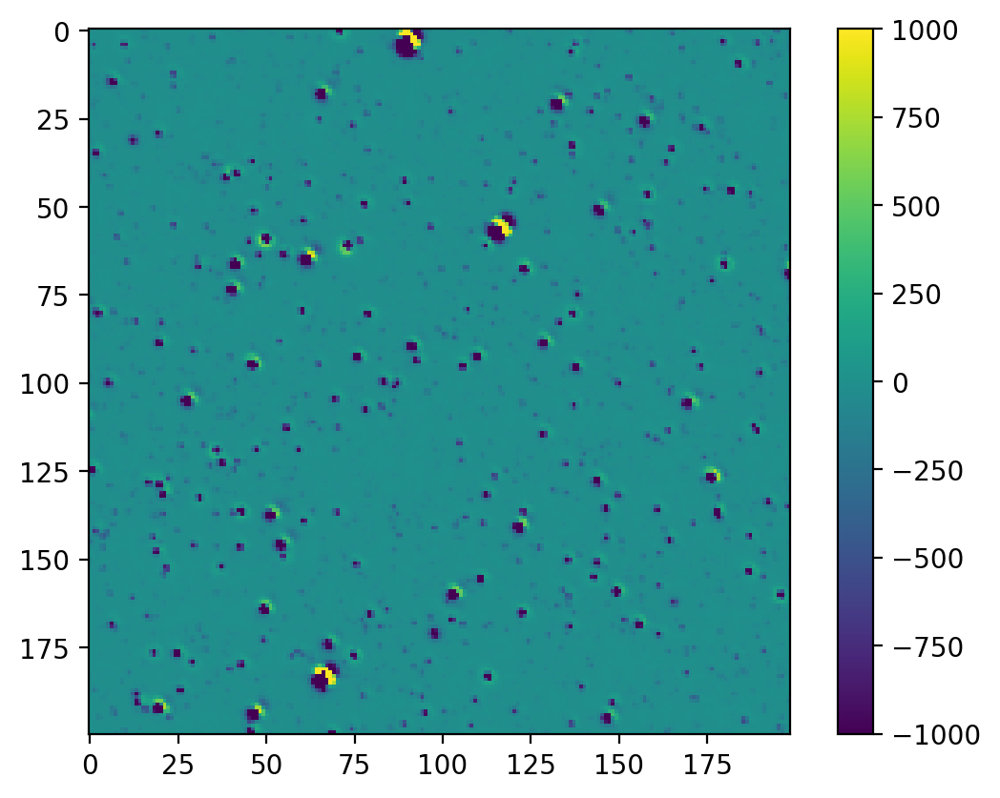

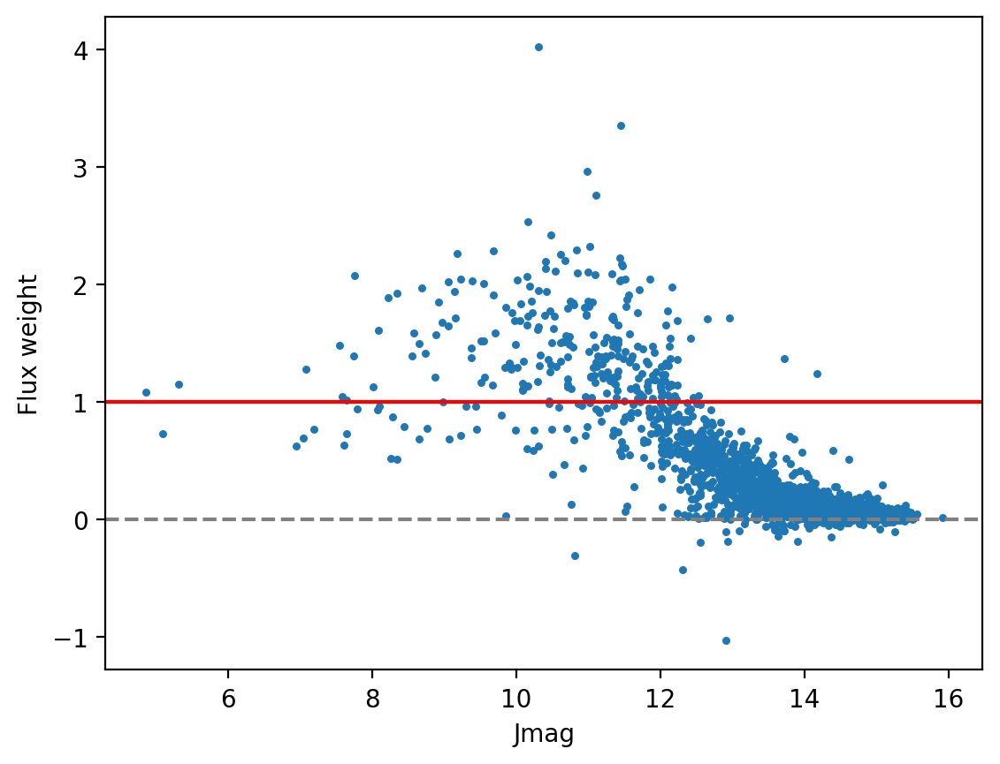

In [444]:
# sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)

# impose a flux cutoff (currently disabled)
# flux_mask = df.j_m < 14
flux_mask = df.j_m < 100

# note that we have divided by the flux coeff
s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
s = s[:, np.hstack([flux_mask, True, True])]
s1 = sparse.hstack([s[:,:-2] / flux_coeff, s[:,-2], s[:,-1]], 'csr')

model_image = s1[:,:-2].sum(axis=1).reshape(image_shape) / data
# model_image = s.sum(axis=1).reshape(image_shape) / data

# define priors on the flux weights
prior_mu = np.ones_like(df.phot_rp_mean_flux)
prior_sigma = (np.ones(s1.shape[1]) * .01)

# regression with priors
sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
sigma_w_inv += np.diag(1 / (prior_sigma ** 2))
w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))
# werrs = np.linalg.inv(sigma_w_inv).diagonal() ** 0.5

out_image = s1.dot(w).reshape(image_shape)

# plots
if True:
    plt.imshow(model_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    plt.imshow(out_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    # check the distribution of weights
    plt.scatter(df[flux_mask].j_m, w[:-2], s=5)
    # plt.ylim([-30,30])
    # plt.ylim([-5,5])
    # plt.xscale('log')
    plt.axhline(1, c='r')
    plt.axhline(0, c='grey', linestyle='--')
    plt.xlabel('Jmag')
    plt.ylabel('Flux weight')
    plt.show()


85


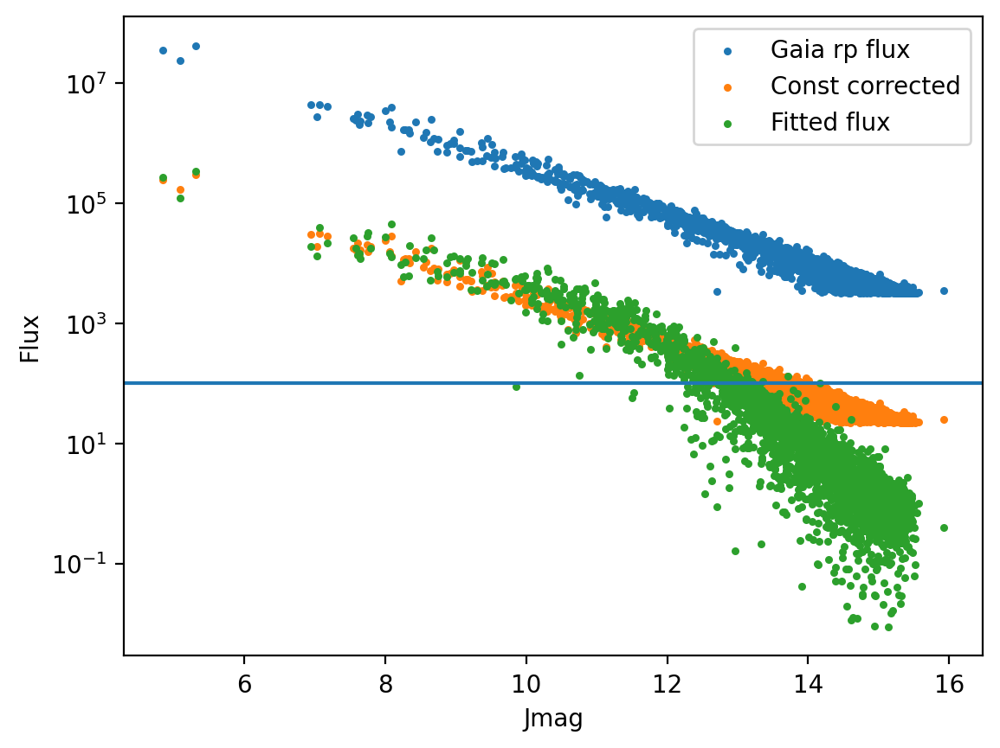

In [445]:
# Caculate the new flux array guess
flux_new = df.phot_rp_mean_flux / flux_coeff * w[:-2]

print(sum(flux_new < 0))

plt.scatter(df.j_m, df.phot_rp_mean_flux, s=5, label='Gaia rp flux')
plt.scatter(df.j_m, df.phot_rp_mean_flux / flux_coeff, s=5, label='Const corrected')
plt.scatter(df.j_m, flux_new, s=5, label='Fitted flux')
plt.axhline(100)
plt.yscale('log')
plt.xlabel('Jmag')
plt.ylabel('Flux')
plt.legend()
plt.show()



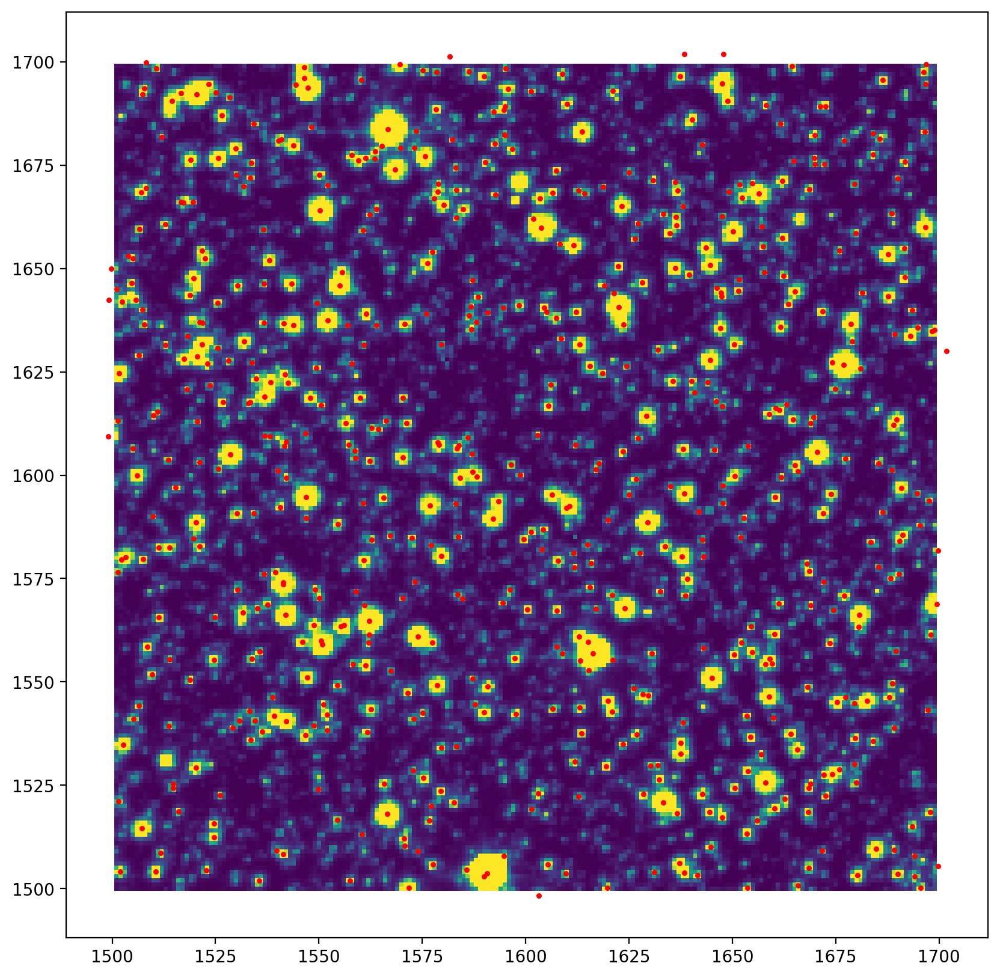

In [451]:
# downselect only to sources above a certain flux
flux_mask = flux_new > 50
df1 = df[flux_mask]


plt.figure(figsize=(10, 10))
plt.pcolormesh(C, R, data, vmin=0, vmax=200)
bright_sources = df.phot_rp_mean_flux > 1e5
plt.scatter(df1["X0"], df1["Y0"], s=5, c="r")
plt.gca().set_aspect("equal")

Text(0, 0.5, 'NN Separation (arcsec)')

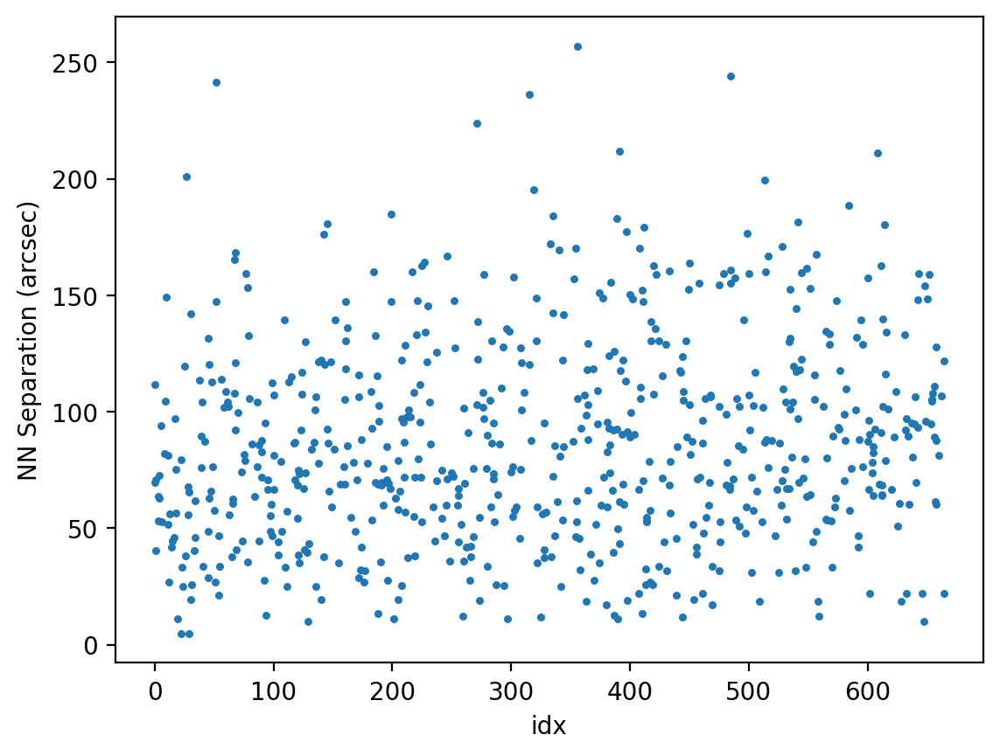

In [456]:
# check nearest neighbors
catalog = SkyCoord(ra=df1.ra*u.degree, dec=df1.dec*u.degree)
idx, d2d, d3d = match_coordinates_sky(catalog, catalog, nthneighbor=2)

plt.scatter(idx, d2d.arcsec, s=5)
plt.xlabel('idx')
plt.ylabel('NN Separation (arcsec)')

In [ ]:
# (DEFUNCT) now fit for ALL source fluxes separately
# same as above, but we're going to try and incorporate "gaussian priors"

prior_mu = np.ones_like(df.phot_rp_mean_flux)
prior_sigma = (
    np.ones(data) * 10 * self.source_flux_estimates
)

# now fit for ALL source fluxes separately

# impose a flux cutoff
# flux_mask = df.j_m < 14
flux_mask = df.j_m < 100
s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
s = s[:, np.hstack([flux_mask, True, True])]

model_image = s[:,:-2].sum(axis=1).reshape(image_shape) / data
# model_image = s.sum(axis=1).reshape(image_shape) / data

# note that we have divided by the flux coeff
s1 = sparse.hstack([s[:,:-2] / flux_coeff, s[:,-2], s[:,-1]], 'csr')

print(std, flux_coeff)

# weight the pixels by their flux errors
sigma_w_inv = s1.T.dot(s1/yerr[:, None]**2)
w = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))

# sigma_w_inv = s1.T.dot(s1.multiply(1/yerr[k&j, None]**2)).toarray() 
# source_flux = np.linalg.solve(sigma_w_inv, s1.T.dot(y/yerr**2))

out_image = s1.dot(w).reshape(image_shape)
# np.sum(np.abs(data - s1.dot(w).reshape(image_shape)))

# plots
if True:
    plt.imshow(model_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    plt.imshow(out_image-data,vmin=-1000,vmax=1000)
    plt.colorbar()
    plt.show()

    # check the distribution of weights
    plt.scatter(df[flux_mask].j_m, w[:-2], s=5)
    # plt.ylim([-30,30])
    plt.ylim([-5,5])
    # plt.xscale('log')
    plt.axhline(1, c='r')
    plt.xlabel('Jmag')
    plt.ylabel('Flux weight')
    plt.show()

In [178]:
flux_coeff

142.35439122568536

In [179]:
len(df[flux_mask].phot_rp_mean_flux)
len(w)
w[-2:]

array([-0.00532033,  0.00556479])

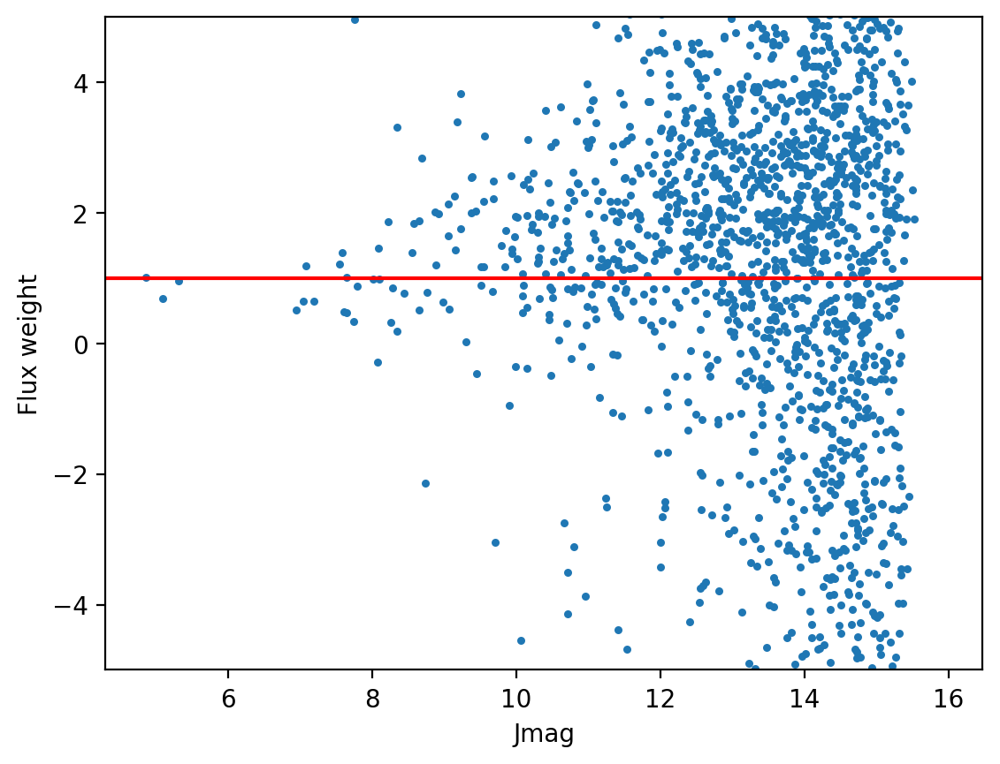

In [387]:
# check the distribution of weights
plt.scatter(df[flux_mask].j_m, w[:-2], s=5)
# plt.ylim([-30,30])
plt.ylim([-5,5])
# plt.xscale('log')
plt.axhline(1, c='r')
plt.xlabel('Jmag')
plt.ylabel('Flux weight')
plt.show()

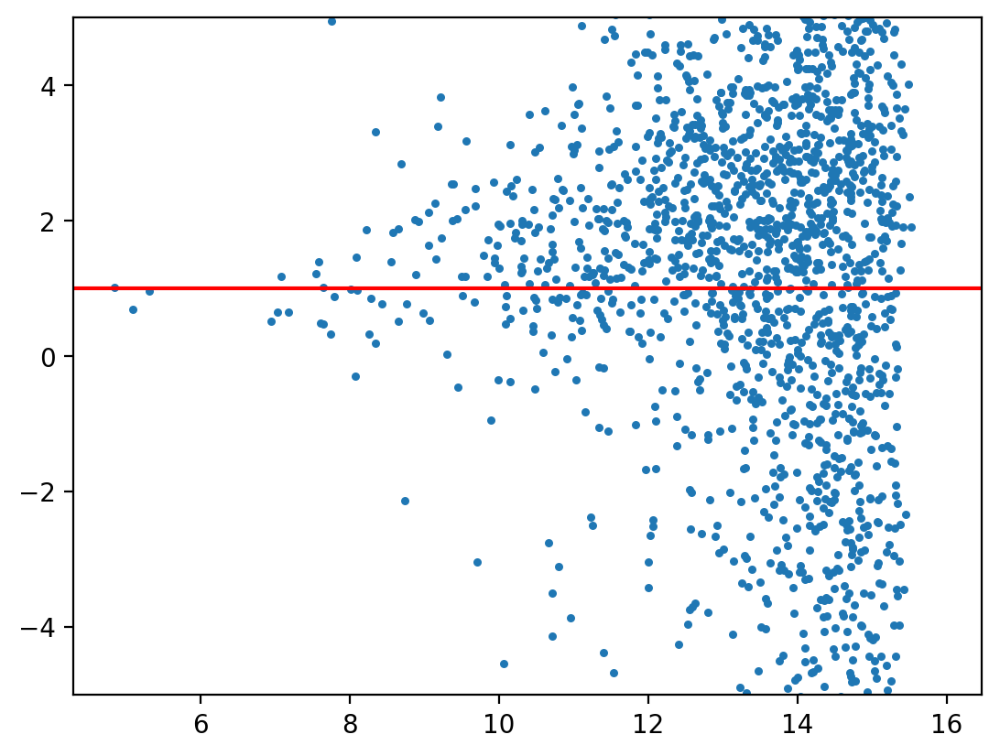

How many negative sources?
1000
Total negative flux contribution?
1000


In [180]:
# check the distribution of weights
plt.scatter(df[flux_mask].j_m, w[:-2], s=5)
# plt.ylim([-30,30])
plt.ylim([-5,5])
# plt.xscale('log')
plt.axhline(1, c='r')
plt.show()

# check the distribution of weighted fluxes
print('How many negative sources?')
neg_mask = df[flux_mask].phot_rp_mean_flux*w[:-2] < 0
print(sum(neg_mask))
print('Total negative flux contribution?')
print(sum(df[flux_mask].phot_rp_mean_flux*w[:-2] < 0))

# plt.scatter(df[flux_mask].j_m, df[flux_mask].phot_rp_mean_flux*w[:-2], s=5)
# # plt.yscale('log')
# plt.show()



In [ ]:
stds = np.arange(0.8,2., 0.1)
flux_coeffs = np.zeros_like(stds)
output = np.zeros_like(stds)

# Finite pixel mask and positive pixel mask
k = np.isfinite(y)
j = y > 0

for ind, std in enumerate(stds):
    s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
    # s = get_gaussian_psfs(source_flux=np.asarray(df.tess_flux), std=std)

    # calculate the flux conversion coefficient, which is the median of the model / data
    model_image = s[:,:-2].sum(axis=1).reshape(image_shape) / data
    flux_coeff = np.median(model_image, axis=[0,1])[0,0]
    flux_coeffs[ind] = flux_coeff
    
    flux_mask = np.zeros(s.shape[1], bool)
    flux_mask[:len(df)] = True

    # # weight the pixels by their flux errors
    # sigma_w_inv = s[k&j].T.dot(s[k&j]/yerr[k&j, None]**2)
    # w = np.linalg.solve(sigma_w_inv, s[k&j].T.dot(y[k&j]/yerr[k&j]**2))

    # sigma_w_inv = s[k&j].T.dot(s[k&j].multiply(1/yerr[k&j, None]**2)).toarray() 
    # source_flux = np.linalg.solve(sigma_w_inv, s[k&j].T.dot(y[k&j]/yerr[k&j]**2))

    output[ind] = np.sum(np.abs(data - s.dot(source_flux).reshape(image_shape)))

plt.plot(stds,output)
plt.show()

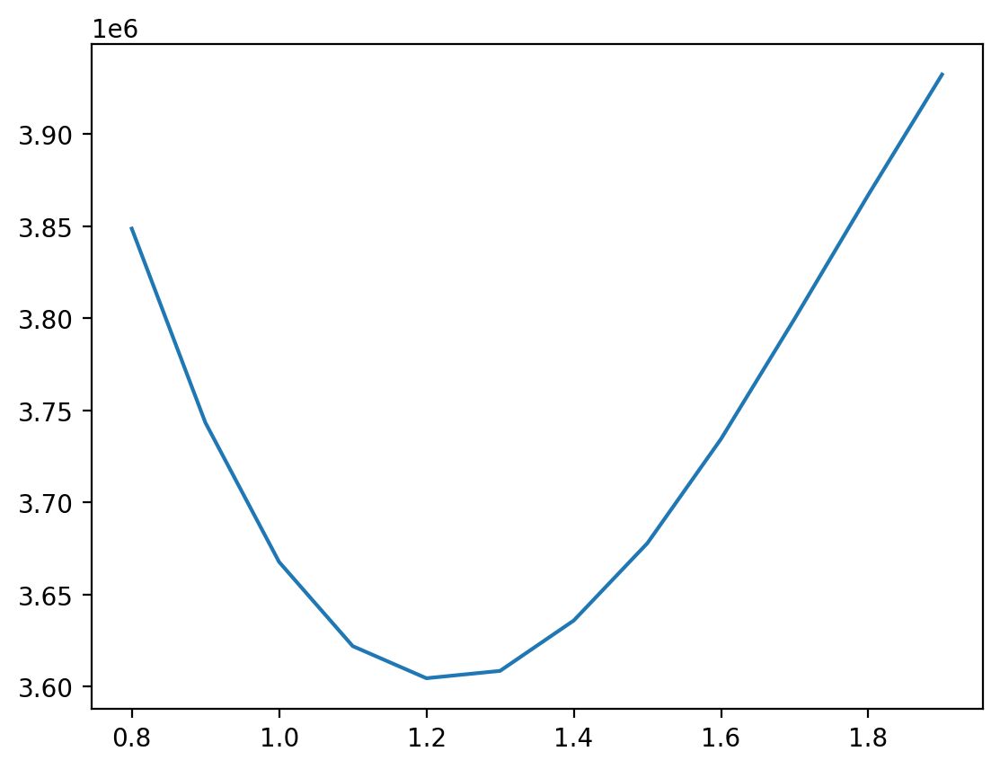

In [521]:
stds = np.arange(0.8,2., 0.1)
output = np.zeros_like(stds)

# Finite pixel mask and positive pixel mask
k = np.isfinite(y)
j = y > 0

for ind, std in enumerate(stds):
    s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
    # s = get_gaussian_psfs(source_flux=np.asarray(df.tess_flux), std=std)
    
    flux_mask = np.zeros(s.shape[1], bool)
    flux_mask[:len(df)] = True

    # weight the pixels by their flux errors
    sigma_w_inv = s[k&j].T.dot(s[k&j]/yerr[k&j, None]**2)
    w = np.linalg.solve(sigma_w_inv, s[k&j].T.dot(y[k&j]/yerr[k&j]**2))

    sigma_w_inv = s[k&j].T.dot(s[k&j].multiply(1/yerr[k&j, None]**2)).toarray() 
    source_flux = np.linalg.solve(sigma_w_inv, s[k&j].T.dot(y[k&j]/yerr[k&j]**2))

    output[ind] = np.sum(np.abs(data - s.dot(source_flux).reshape(image_shape)))

plt.plot(stds,output)
plt.show()

In [325]:
# k = np.isfinite()
# j = 
print(s.shape)
# s[k].max(axis=1) / s[k].sum(axis=1)
# s[k].max(axis=1).tocoo().toarray().flatten()
sum(s[k].sum(axis=1) < 0)

(39800, 3145)


matrix([[8098]])

In [348]:
sum(df.phot_rp_mean_flux < 0)

0

In [ ]:
# let's write a function that, given a psf-generating function and a list of fluxes, calculates the contamination ratio in each pixel and lets you select single-source pixels based on certain conditions

def select_gaussian_single_source_pixels(source_flux, std, ):
    # get the psf matrix
    # assumes that the first n=len(source_flux) components correspond to source psfs
    # does NOT include any flux fitting or offset fitting
    s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)

    # calculate contamination ratio
    con_ratio = s[k][:,:len(source_flux)].max(axis=1) / s[k][:,:len(source_flux)].sum(axis=1)

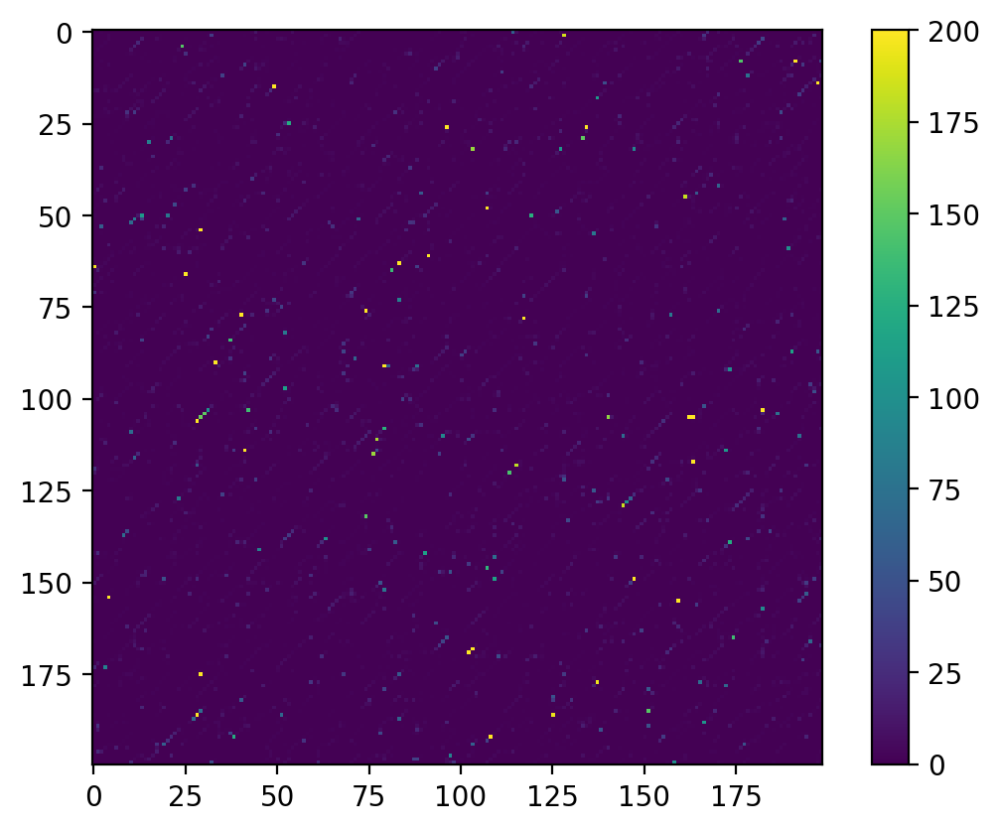

In [518]:
temp = s[k].max(axis=1) / s[k].sum(axis=1)
plt.imshow(temp.reshape(image_shape) - con_ratio.reshape(image_shape), vmin=0, vmax=200)
plt.colorbar()
plt.show()

In [514]:
s.shape


(39800, 3145)

(39800, 1)


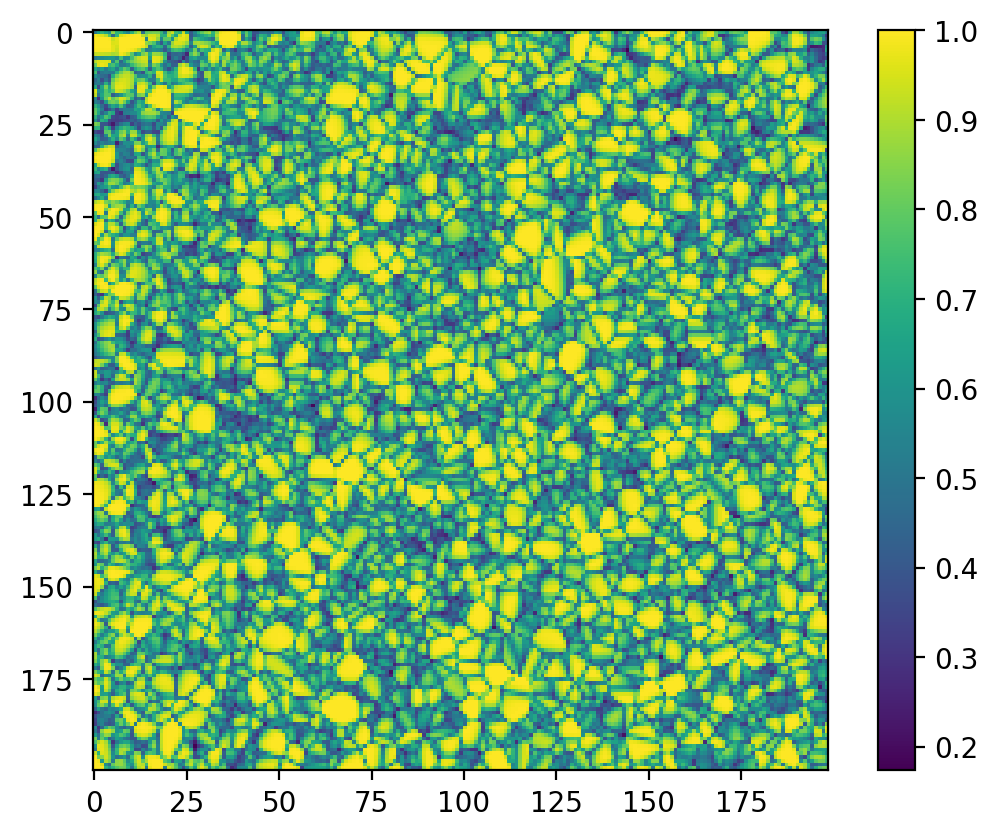

In [515]:
s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=1.2)
# s = get_gaussian_psfs(source_flux=np.asarray(df.tess_flux), std=1.2)


# sum(s[k][:,:-2].sum(axis=1) < 0)
# sum(s[k].max(axis=1).toarray() < 0)
# sum(s[k].sum(axis=1) < 0)
# (s[k].max(axis=1) / s[k].sum(axis=1)).shape
# sum(df.phot_rp_mean_flux < 0)

# plot the uniquness of contributions in each pixel (normalized to flux in the pixel)
con_ratio = s[:,:-2].max(axis=1) / s[:,:-2].sum(axis=1)
plt.imshow(con_ratio.reshape(image_shape))
plt.colorbar()
plt.show()



In [430]:
s[k][:,:-2].sum(axis=1).shape

(39800, 1)

In [498]:
1e4/50

200.0

In [447]:
(m1&m2).reshape(image_shape)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

Scale by median of gaia_flux / data

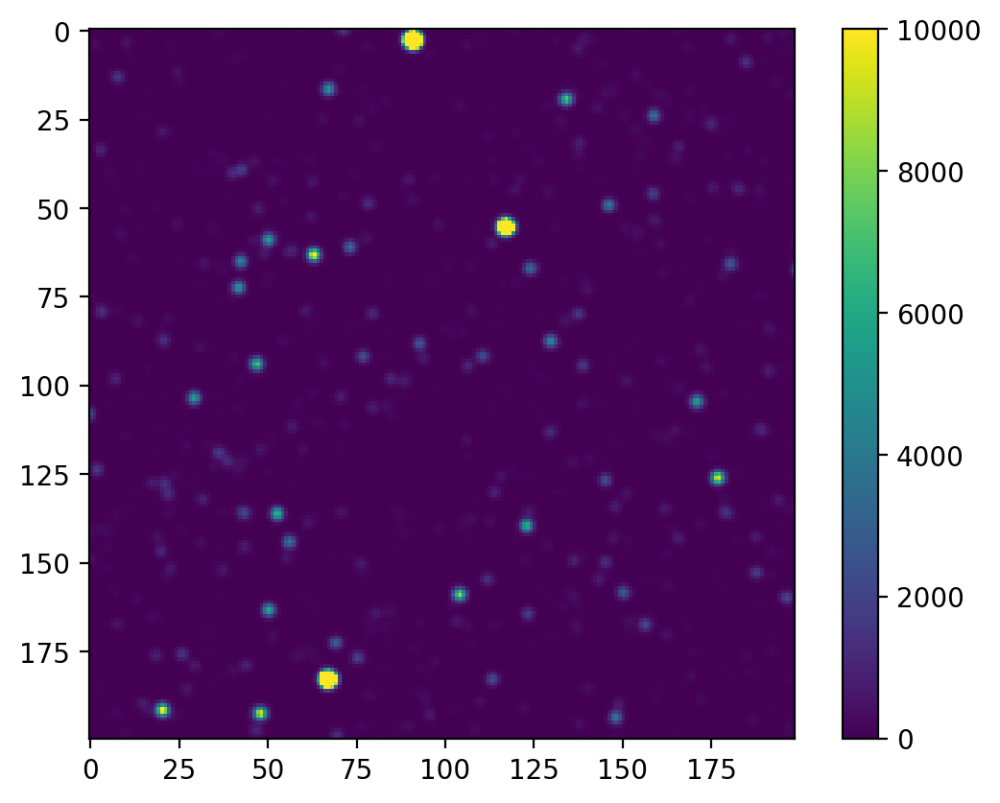

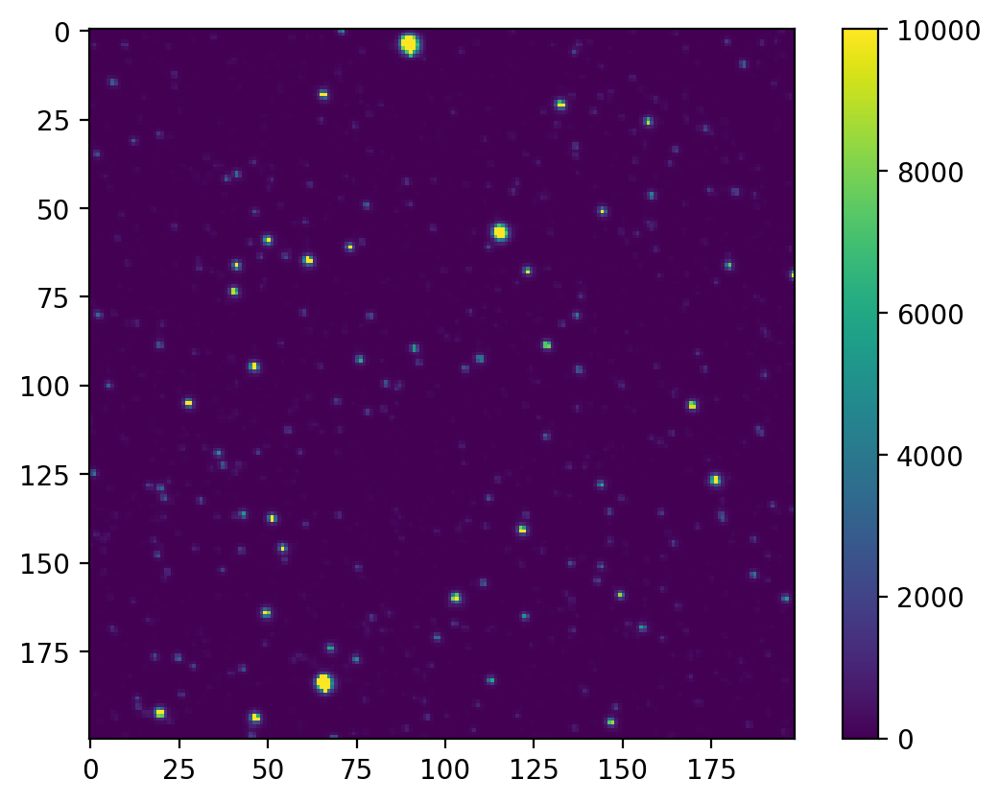

In [44]:
mi0 = (s[:,:-2]/45).sum(axis=1).reshape(image_shape)
plt.imshow(mi0, vmin=0, vmax=10000)
plt.colorbar()
plt.show()

plt.imshow(data, vmin=0, vmax=10000)
plt.colorbar()
plt.show()

(39800,) (39800,)


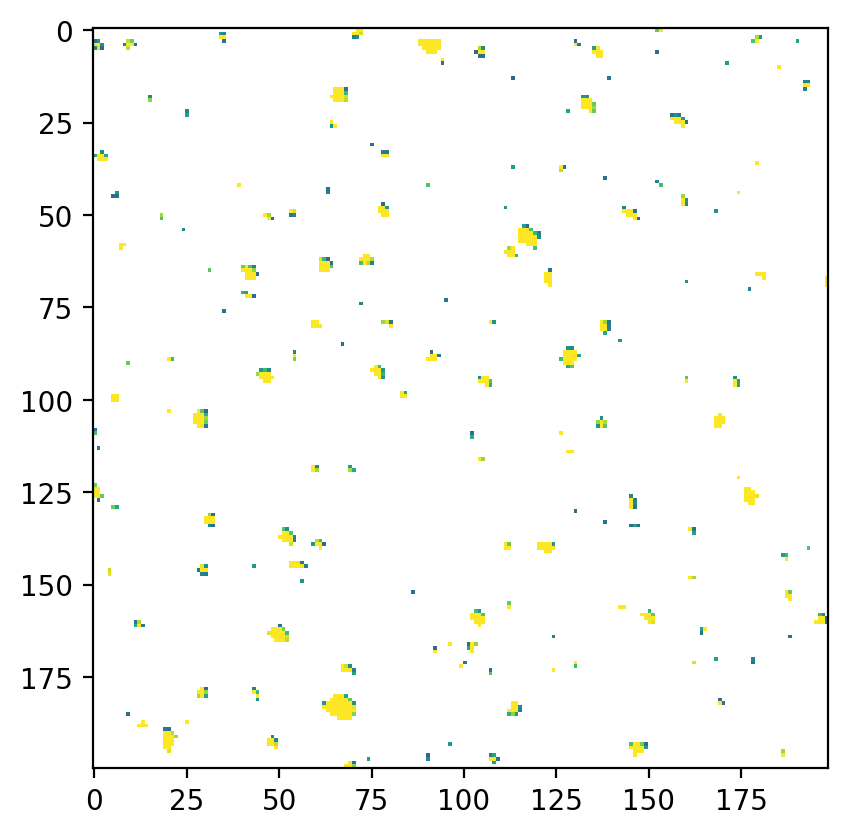

In [520]:
# Now we can select pixels by how bright they are and how "unique" their source contribution is!
m1 = np.array(con_ratio).squeeze() > .99
m2 = y > 100
print(np.shape(m1), np.shape(m2))

temp = np.ma.masked_where(~(m1&m2).reshape(image_shape), data)

plt.imshow(temp, vmin=0, vmax=300)
# plt.colorbar()

In [ ]:
# DON'T include a flux-fitting step, just calculate the PSF with the gaia fluxes
stds = np.arange(0.8,2., 0.1)
output = np.zeros_like(stds)

# Finite pixel mask and positive pixel mask
k = np.isfinite(y)
j = y > 0

for ind, std in enumerate(stds):
    s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
    
    # flux_mask = np.zeros(s.shape[1], bool)
    # flux_mask[:len(df)] = True

    # # weight the pixels by their flux errors
    # sigma_w_inv = s[k&j].T.dot(s[k&j]/yerr[k&j, None]**2)
    # w = np.linalg.solve(sigma_w_inv, s[k&j].T.dot(y[k&j]/yerr[k&j]**2))

    # sigma_w_inv = s[k&j].T.dot(s[k&j].multiply(1/yerr[k&j, None]**2)).toarray() 
    # source_flux = np.linalg.solve(sigma_w_inv, s[k&j].T.dot(y[k&j]/yerr[k&j]**2))

    # output[ind] = np.sum(np.abs(data - s.dot(source_flux).reshape(image_shape)))



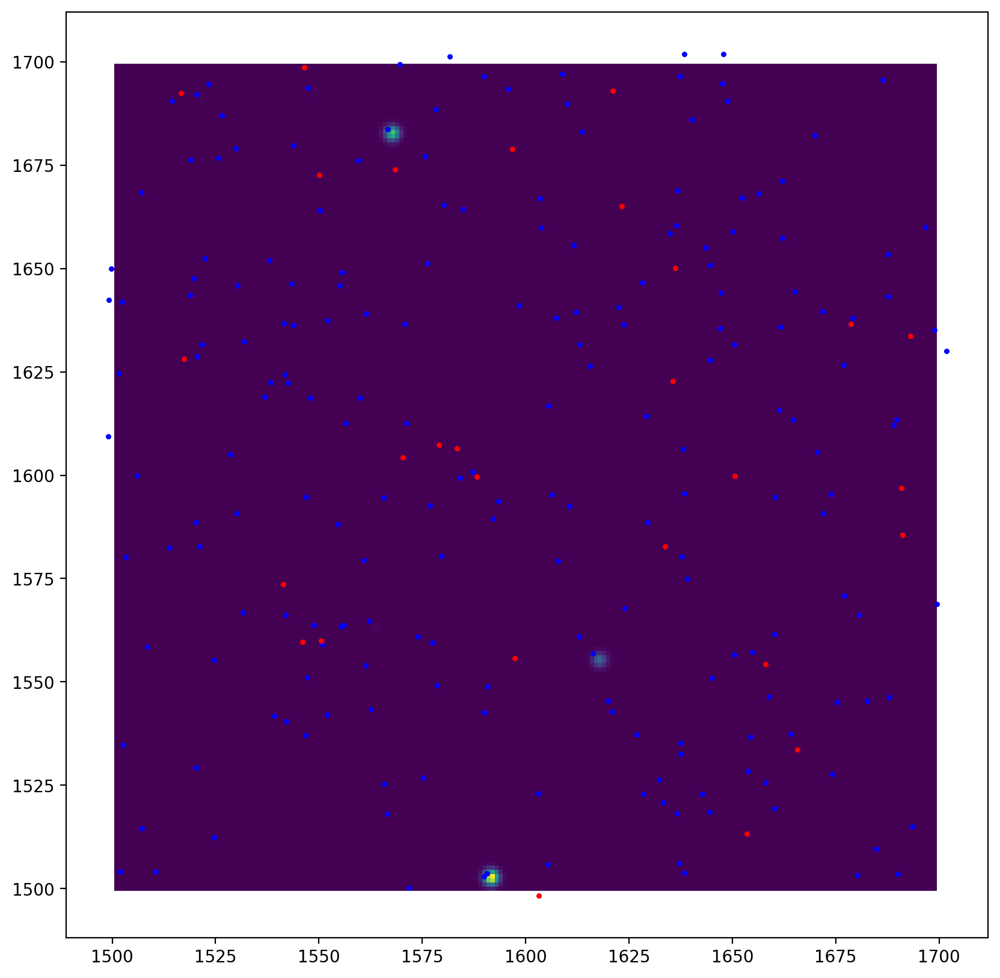

In [306]:
mi0 = s[:,:-2].dot(df.phot_rp_mean_flux).reshape(image_shape)

plt.figure(figsize=(10, 10))
# plt.pcolormesh(C, R, data, vmin=0, vmax=200)
plt.pcolormesh(C, R, mi0)#, vmin=0, vmax=200)
# plt.pcolormesh(C, R, data - model_image, vmin=0, vmax=200)
bright_sources = df.phot_rp_mean_flux > 1e5
plt.scatter(df["X0"][bright_sources & (w[:-2] > 0)], df["Y0"][bright_sources & (w[:-2] > 0)], s=5, c="b")
plt.scatter(df["X0"][bright_sources & (w[:-2] < 0)], df["Y0"][bright_sources & (w[:-2] < 0)], s=5, c="r")

# plt.scatter(df["X0"][(w[:-2] > 0)], df["Y0"][(w[:-2] > 0)], s=5, c="b")
# plt.scatter(df["X0"][(w[:-2] < 0)], df["Y0"][(w[:-2] < 0)], s=5, c="r")
plt.gca().set_aspect("equal")

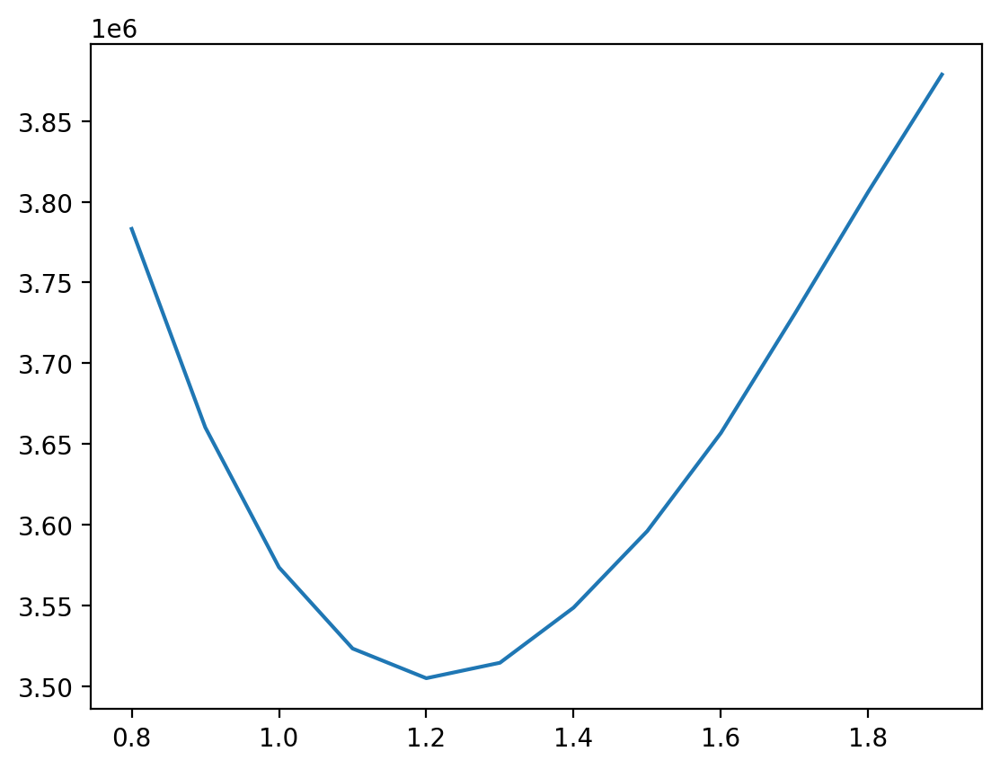

In [244]:
plt.plot(stds,output)
plt.show()

In [526]:
# get the std that minimizes the statistic and recaclulate
ind = np.argmin(output)
std = stds[ind]

# make sure you have the right data
y = data.ravel()
yerr = err.ravel()

# recalculate s
# s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=std)
s = get_gaussian_psfs(source_flux=np.asarray(df.tess_flux), std=std)
# s = get_gaussian_psfs(1)

flux_mask = np.zeros(s.shape[1], bool)
flux_mask[:len(df)] = True

# weight the pixels by their flux errors
sigma_w_inv = s[k&j].T.dot(s[k&j]/yerr[k&j, None]**2)
B = s[k&j].T.dot(y[k&j]/yerr[k&j]**2)
w = np.linalg.solve(sigma_w_inv, B)

# calculate source_flux
# sigma_w_inv = s[k&j].T.dot(s[k&j].multiply(1/yerr[k&j, None]**2)).toarray() 
# source_flux = np.linalg.solve(sigma_w_inv, B)


In [538]:
s.T.dot(s)

<3145x3145 sparse matrix of type '<class 'numpy.float64'>'
	with 156199 stored elements in Compressed Sparse Column format>

(-1000.0, 100000.0)

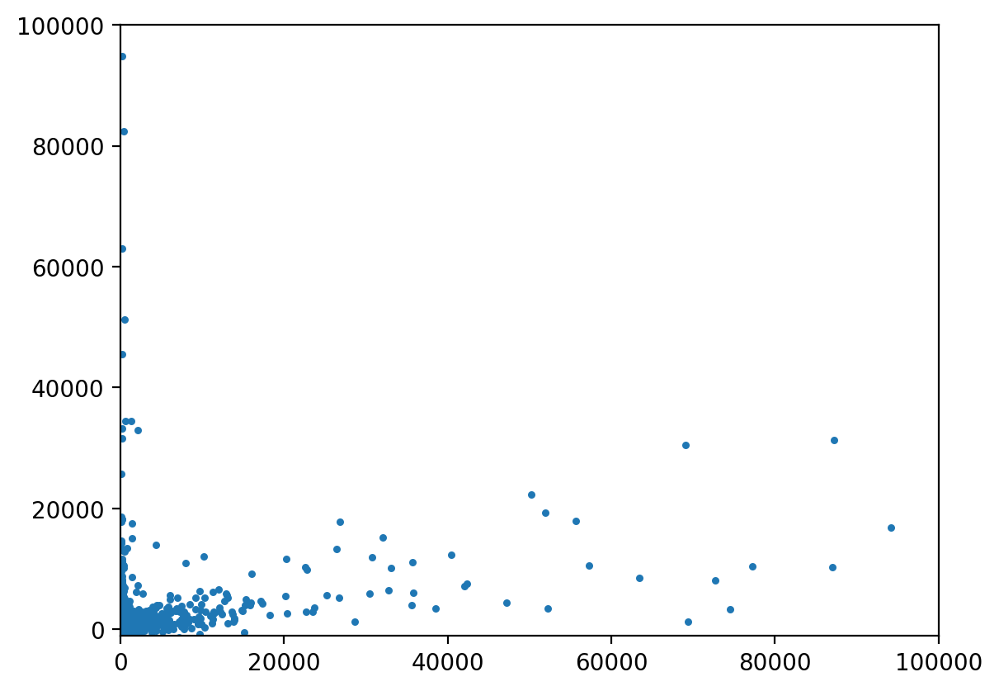

In [535]:
# plt.plot(w)
plt.scatter( df.tess_flux, w[:-2] * df.tess_flux, s=5)
plt.xlim([0,1e5])
plt.ylim([-1e3,1e5])

In [465]:
s.shape
sigma_w_inv.shape

(3145, 3145)

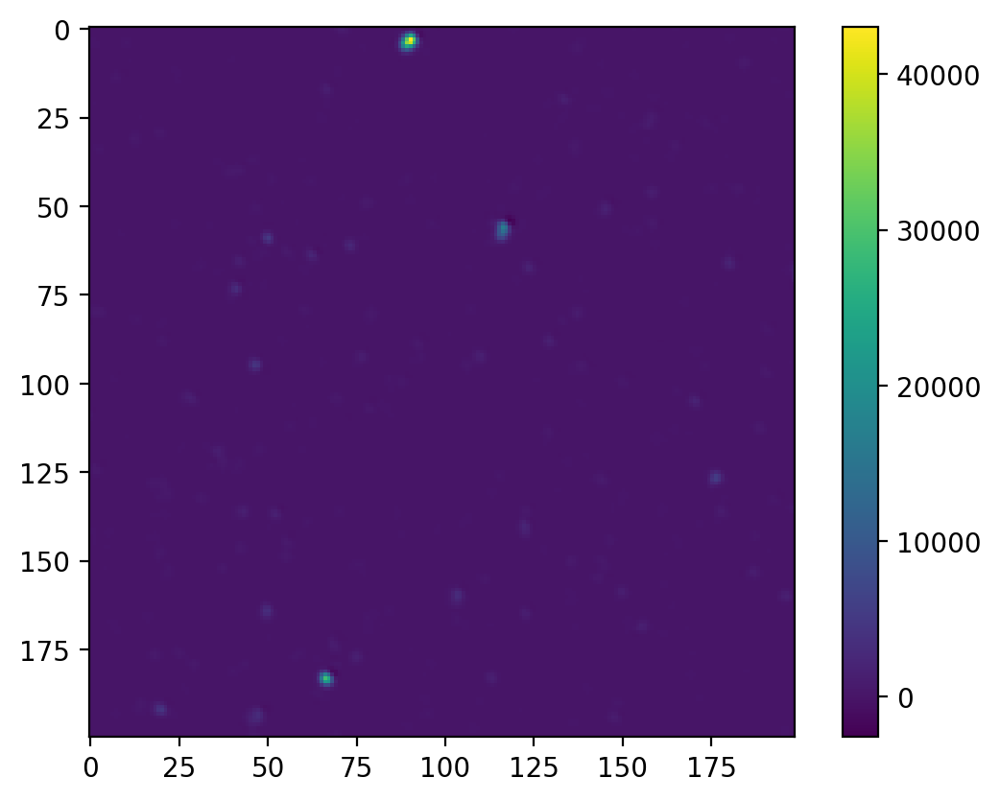

In [282]:
# np.dot(X, w).shape
model_image = s[k].dot(w).reshape(image_shape)
plt.imshow(s[k].dot(w).reshape(image_shape))
plt.colorbar()
plt.show()

# sum(y < 0)


In [284]:
w[:-2].shape

(3143,)

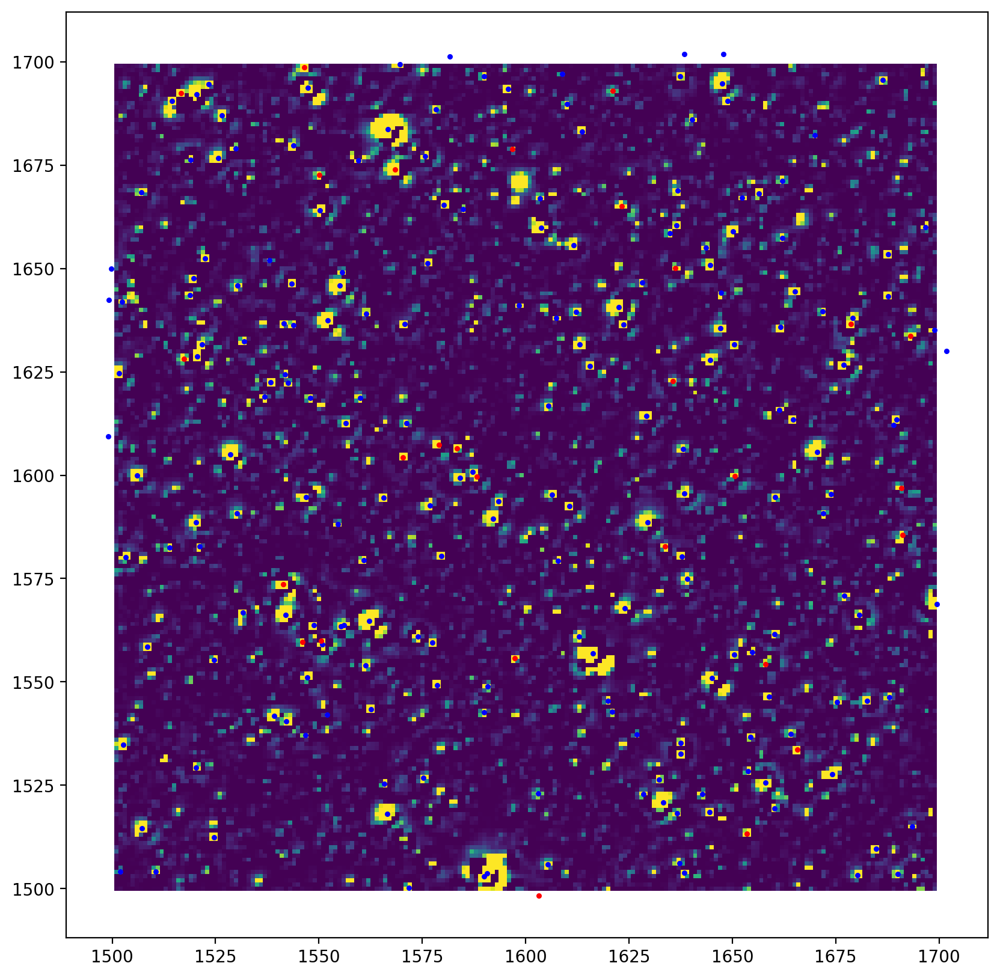

In [291]:
plt.figure(figsize=(10, 10))
# plt.pcolormesh(C, R, data, vmin=0, vmax=200)
plt.pcolormesh(C, R, data - model_image, vmin=0, vmax=200)
bright_sources = df.phot_rp_mean_flux > 1e5
plt.scatter(df["X0"][bright_sources & (w[:-2] > 0)], df["Y0"][bright_sources & (w[:-2] > 0)], s=5, c="b")
plt.scatter(df["X0"][bright_sources & (w[:-2] < 0)], df["Y0"][bright_sources & (w[:-2] < 0)], s=5, c="r")

# plt.scatter(df["X0"][(w[:-2] > 0)], df["Y0"][(w[:-2] > 0)], s=5, c="b")
# plt.scatter(df["X0"][(w[:-2] < 0)], df["Y0"][(w[:-2] < 0)], s=5, c="r")
plt.gca().set_aspect("equal")

In [231]:
source_flux[:-2].shape
sigma_w_inv.shape

(3145, 3145)

In [270]:
df.columns

Index(['dr2_teff_val', 'propagated_position_vector', 'dec', 'ruwe', 'parallax',
       'dr2_logg', 'j_msigcom', 'ra', 'ang_sep', 'phot_rp_mean_flux',
       'radial_velocity', 'ph_qual', 'pmra', 'pmdec', 'j_m', 'source_id',
       'logg_gspphot', 'teff_gspphot', 'RA_EPOCH', 'DEC_EPOCH', 'X0', 'Y0'],
      dtype='object')

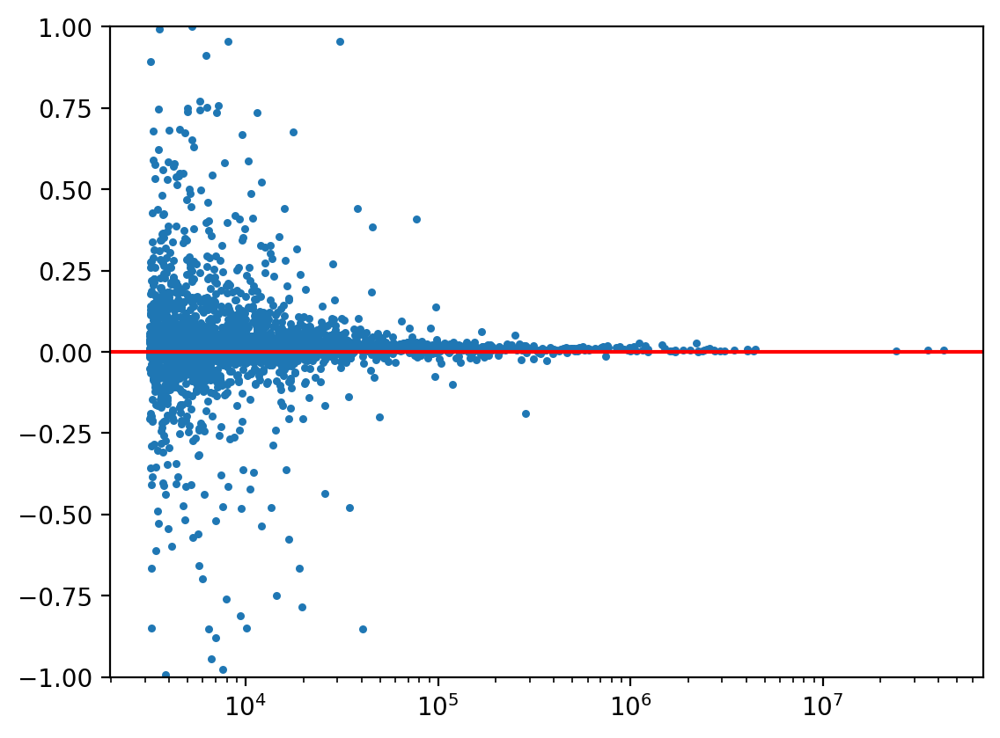

In [281]:
len(source_flux)
plt.scatter(df.phot_rp_mean_flux, w[:-2], s=5)
# plt.scatter(df.j_m, w[:-2], s=5)
plt.xscale('log')
plt.ylim([-1,1])
plt.axhline(0,c='r')
plt.show()

In [176]:
# (df.phot_rp_mean_flux < 0.).sum()
# plt.scatter(df.phot_rp_mean_flux, source_flux)
print(df.phot_rp_mean_flux.shape)
print(source_flux.shape)

(3143,)
(3145,)


In [165]:
# k = np.isfinite()
# j = 
print(s.shape)
# s[k].max(axis=1) / s[k].sum(axis=1)
# s[k].max(axis=1).tocoo().toarray().flatten()
sum(s[k].sum(axis=1) < 0)

(39800, 3145)


matrix([[8098]])

[3336.52588662]


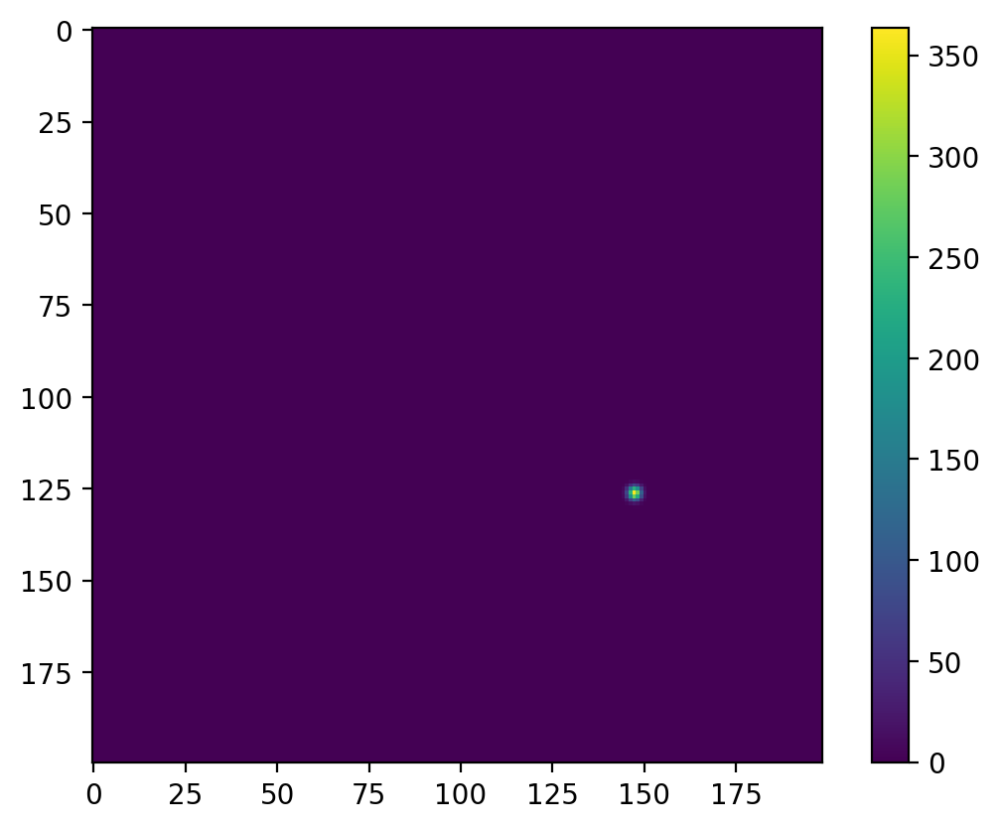

In [131]:
# s[:,0].reshape(image_shape)
print(sum(s[:,100].tocoo().toarray()))

plt.imshow((s[:,100].tocoo().toarray()).reshape(image_shape))
plt.colorbar()
plt.show()
# s.shape
# max(s[:,666].tocoo().toarray())

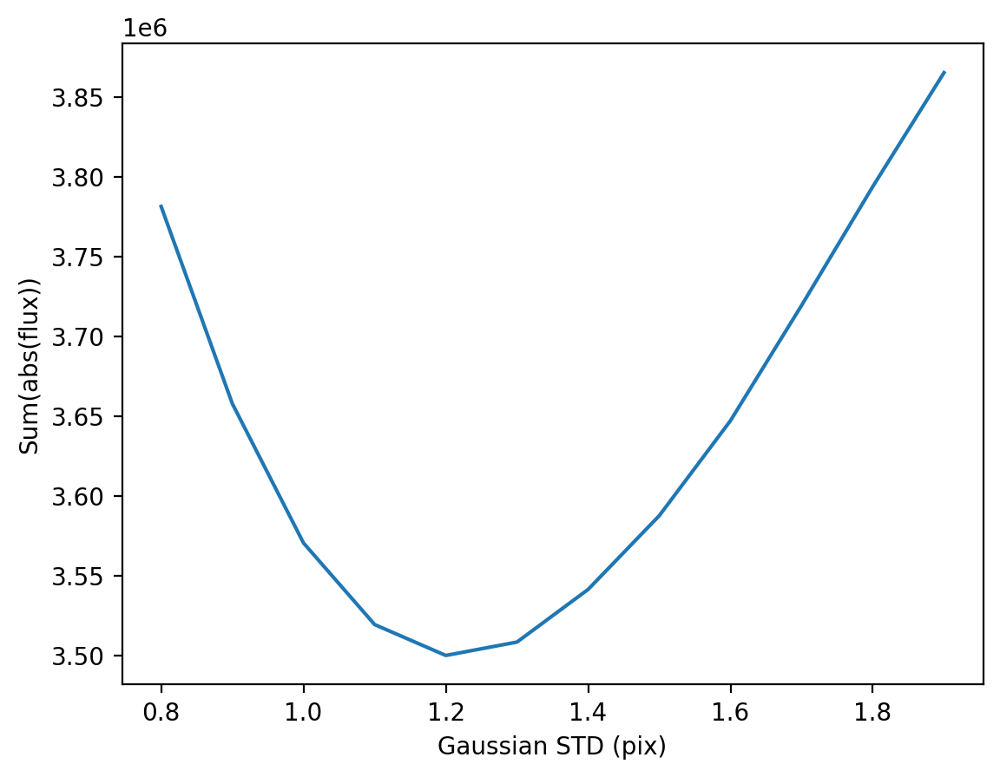

In [88]:
# np.sum(data - s.dot(source_flux).reshape(image_shape))

plt.plot(stds,output)
plt.xlabel('Gaussian STD (pix)')
plt.ylabel('Sum(abs(flux))')
plt.show()

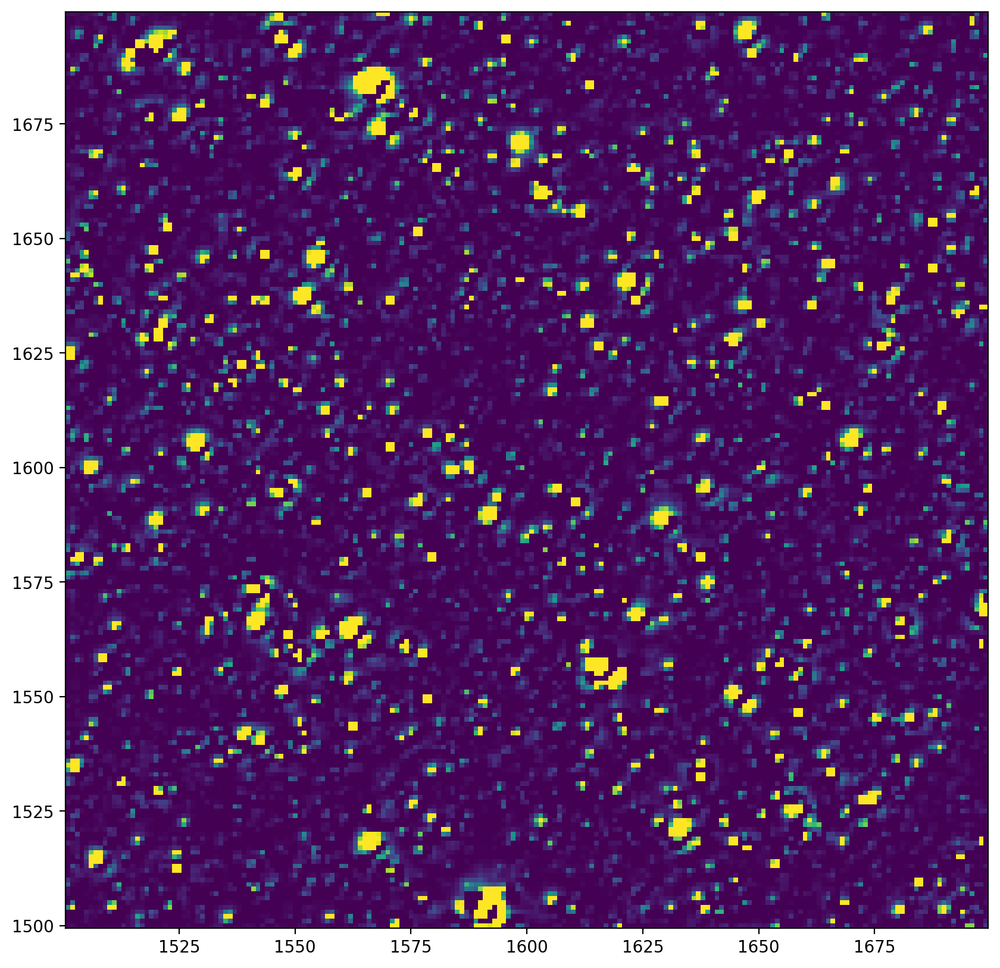

In [87]:
y = data.ravel()
yerr = err.ravel()

# returns a sparse matrix
s = get_gaussian_psfs(source_flux=np.asarray(df.phot_rp_mean_flux), std=1.2)
# s.shape

# Finite pixel mask
k = np.isfinite(y)

flux_mask = np.zeros(s.shape[1], bool)
flux_mask[:len(df)] = True

# weight the pixels by their flux errors
sigma_w_inv = s[k].T.dot(s[k]/yerr[k, None]**2)
w = np.linalg.solve(sigma_w_inv, s[k].T.dot(y[k]/yerr[k]**2))

sigma_w_inv = s[k].T.dot(s[k].multiply(1/yerr[k, None]**2)).toarray() 
source_flux = np.linalg.solve(sigma_w_inv, s[k].T.dot(y[k]/yerr[k]**2))
# chis[idx] = np.sum((y[k] - s.dot(source_flux)[k])**2/yerr[k]**2)

# plt.figure(figsize=(10, 10))
# plt.pcolormesh(C, R, data, vmin=0, vmax=200)
# plt.gca().set_aspect("equal")

plt.figure(figsize=(10, 10))
plt.pcolormesh(C, R, data - s.dot(source_flux).reshape(image_shape), vmin=0, vmax=200)

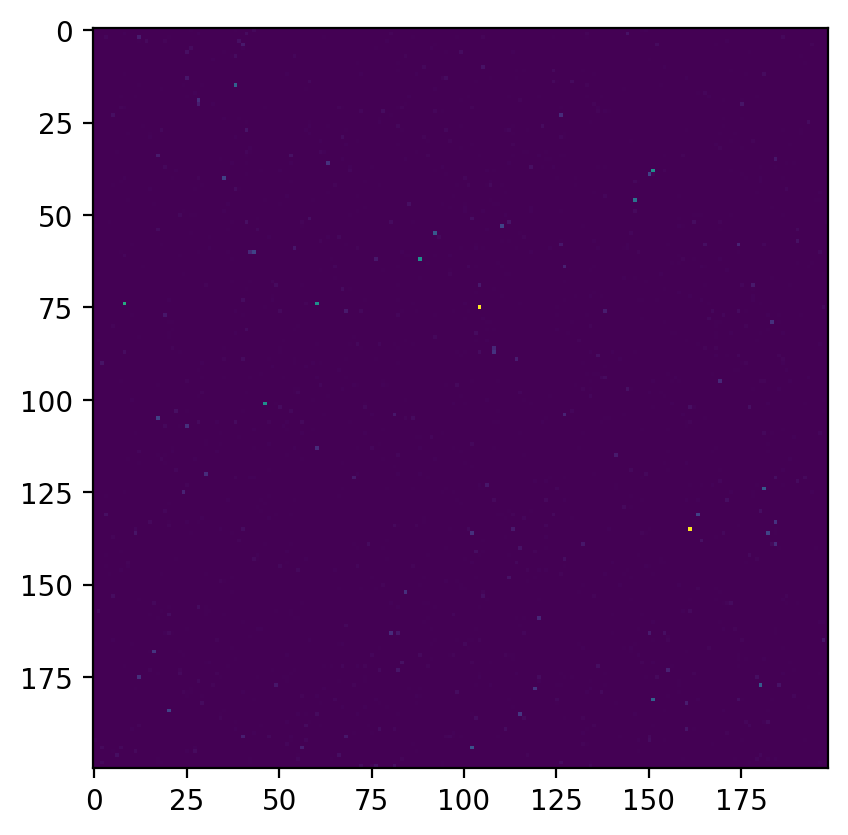

In [552]:
plt.imshow(ps[:,0].tocoo().toarray().reshape(image_shape))